# Nat comms rebuttals 

In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt
import utils.CaAnaly as CaaN
import scipy as sp
import scipy.signal as sps
import utils.Plotting as Pl
import sklearn.cluster as sc
from sklearn import metrics
import pandas as pd
import pickle
import utils.Pandas_analysis as PdA
import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels.stats.multicomp as tukey
import scipy.stats as stats


import os
import glob
import utils.GRABAnaly as GRAB
import utils.BehavAnaly as BA


In [2]:
color1 = '#0cbccc'
color2 = '#107acc'
color3 = '#15297c'
color4= '#b695b0'
color5= '#4c007d'


In [3]:
Save_path = '//qnap-amp001.dpag.ox.ac.uk/gsantero/Analysis/Paper_figures/Rebuttals/'

In [ ]:
Path_df = '//qnap-amp001.dpag.ox.ac.uk/gsantero/Analysis/Data_frames/With_data/'
file_name = '2023_08_08_df_data'

#import 2023_03_18_df_cumsum as df_cumsum using pickle
with open(Path_df + file_name,'rb') as handle:
    df = pickle.load(handle)

df['interneuron'] = df['interneuron'].replace('NKx2.1','Nkx2.1')
df['genotype'] = df['genotype'].replace('KO ','KO')
df['genotype'] = df['genotype'].replace('HET ','HET')
df['genotype'] = df['genotype'].replace('WT ','WT')
df['genotype'] = df['genotype'].replace('WT?','WT')

#extract_to_separate_coloumn number of neurons to separate coloumn
df = PdA.extract_to_separate_coloumn(df,'Number_of_neurons',0,'Neurons')
df = PdA.extract_to_separate_coloumn(df, 'Whisker_responses',-3,'Proportion_resp')
for n in range(0,10):
    df = PdA.extract_to_separate_coloumn(df, 'Whisker_responses',n,'Resp' + str((n+1)*10) + '%')
for n in range(0,10):
    df = PdA.extract_to_separate_coloumn(df, 'Airpuff_responses',n,'AResp' + str((n+1)*10) + '%')
df = PdA.extract_to_separate_coloumn(df, 'Whisker_responses',-3,'Whisker_responsive')
df = PdA.extract_to_separate_coloumn(df, 'Airpuff_responses',-3,'Airpuff_responsive')

#Remove rows with less than 500 neuorns and print how many where removed
print('Number of rows removed: ' + str(len(df[df['Neurons'] < 500])))
df = df[df['Neurons'] >= 500]

#remove runt 351 (died at P10 very underweighted)
df = df[df['animal'] != 'GOS351']
df.head(n=10)

#remove GOS464 ONWARDS (WT dams)
df = df[df['animal'] != 'GOS466']
df = df[df['animal'] != 'GOS470']
df = df[df['animal'] != 'GOS471']


Number of rows removed: 53


In [4]:
df.columns

Index(['animal', 'date', 'age', 'genotype', 'interneuron', 'sex',
       'experiment_id', 'filepath', 'Number_of_neurons',
       'cumulative_1_percentile_dF_F', 'num_neurons', 'AUC', 'Events',
       'Whisker_responses', 'Whisker_response_trace',
       'Whisker_response_trace_responsive', 'Airpuff_responses',
       'Airpuff_response_trace', 'Airpuff_response_trace_responsive',
       'Interneurons_events', 'Interneurons_corr', 'Correlations',
       'Correlations_distance', 'Raw_stats',
       'Whisker_response_trace_interneurons',
       'Airpuff_response_trace_interneurons',
       'Whisker_response_trace_interneurons_responsive',
       'Airpuff_response_trace_interneurons_responsive', 'Interneurons_t001',
       'Interneurons_events_single_neuron_t001',
       'Whisker_response_trace_interneurons_single',
       'Airpuff_response_trace_interneurons_single',
       'Interneurons_events_single_neuron_t001_ALL',
       'Whisker_SD_response_trace', 'Population_SD', 'Population_var',

# Sex differences re-analysis

In [120]:
# Column 'Sex' get counts of each unique value

print(df['sex'].value_counts())
# Check how many None values are 
df['sex'].isnull().sum()
#Find unique values of 'animal that have None in sex
unique_animals_with_none_sex = df[df['sex'].isnull()]['animal'].unique()

print("Unique animals with None in 'sex' column:", unique_animals_with_none_sex)

Male      295
Female    276
Name: sex, dtype: int64
Unique animals with None in 'sex' column: []


In [5]:
#Give rows with animal = 'GOS192' value 'Male' in column 'sex'

df.loc[df['animal'] == 'GOS192', 'sex'] = 'Male'
df.loc[df['animal'] == 'GOS193', 'sex'] = 'Male'
df.loc[df['animal'] == 'GOS194', 'sex'] = 'Male'
df.loc[df['animal'] == 'GOS195', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS430', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS431', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS432', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS433', 'sex'] = 'Male'
df.loc[df['animal'] == 'GOS447', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS449', 'sex'] = 'Male'
df.loc[df['animal'] == 'GOS450', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS451', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS453', 'sex'] = 'Male'
df.loc[df['animal'] == 'GOS415', 'sex'] = 'Male'
df.loc[df['animal'] == 'GOS419', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS424', 'sex'] = 'Male'
df.loc[df['animal'] == 'GOS411', 'sex'] = 'Male'
df.loc[df['animal'] == 'GOS420', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS413', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS414', 'sex'] = 'Male'
df.loc[df['animal'] == 'GOS403', 'sex'] = 'Male'
df.loc[df['animal'] == 'GOS406', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS408', 'sex'] = 'Male'
df.loc[df['animal'] == 'GOS425', 'sex'] = 'Male'
df.loc[df['animal'] == 'GOS346', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS347', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS349', 'sex'] = 'Male'
df.loc[df['animal'] == 'GOS350', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS372', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS374', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS375', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS376', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS377', 'sex'] = 'Male'
df.loc[df['animal'] == 'GOS378', 'sex'] = 'Male'
df.loc[df['animal'] == 'GOS306', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS309', 'sex'] = 'Male'
df.loc[df['animal'] == 'GOS244', 'sex'] = 'Male'
df.loc[df['animal'] == 'GOS245', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS307', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS319', 'sex'] = 'Male'
df.loc[df['animal'] == 'GOS333', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS384', 'sex'] = 'Female'
df.loc[df['animal'] == 'GOS407', 'sex'] = 'Male'

## H-events

In [6]:
# Extract event data
t = 3 # 3 mean 4  82.5 percentile 5 is mean plus one sd
#calculate length og Events and store it in a new coloumn called 'Number_of_events'
for i, row in df.iterrows():
    try:
        df.at[i,'Number_of_events'] = row['Events'][0].shape[0]
        df.at[i,'Recruitment'] = np.nanmean(row['Events'][0][:,t])
        df.at[i,'H_events'] = np.nansum(row['Events'][0][:,t]>=0.8)/20
        df.at[i,'L_events'] = np.nansum((row['Events'][0][:,t]<0.8) & (row['Events'][0][:,t]>=0.2))/20
        df.at[i,'H_L_events'] = np.nansum(row['Events'][0][:,t]>0.2)
        df.at[i,'S_events'] = np.nansum(row['Events'][0][:,t]<0.2)
        df.at[i,'Duration'] = np.nanmean(row['Events'][0][:,2])
        df.at[i,'H_Duration'] = np.nanmean(row['Events'][0][:,2][row['Events'][0][:,t]>=0.8])
        df.at[i,'L_Duration'] = np.nanmean(row['Events'][0][:,2][(row['Events'][0][:,t]<0.8) & (row['Events'][0][:,t]>=0.2)])
        df.at[i,'H_L_Duration'] = np.nanmean(row['Events'][0][:,2][row['Events'][0][:,t]>=0.2])
        df.at[i,'S_Duration'] = np.nanmean(row['Events'][0][:,2][row['Events'][0][:,t]<0.2])
        df.at[i,'H_Recruitment'] = np.nanmean(row['Events'][0][:,t][row['Events'][0][:,t]>=0.8])
        df.at[i,'L_Recruitment'] = np.nanmean(row['Events'][0][:,t][(row['Events'][0][:,t]<0.8) & (row['Events'][0][:,t]>=0.2)])
        df.at[i,'H_L_Recruitment'] = np.nanmean(row['Events'][0][:,t][row['Events'][0][:,t]>=0.2])
        df.at[i,'S_Recruitment'] = np.nanmean(row['Events'][0][:,t][row['Events'][0][:,t]<0.2])
        df.at[i,'Event_max'] = np.nanmean(row['Events'][0][:,0])
        df.at[i,'H_Event_max'] = np.nanmean(row['Events'][0][:,0][row['Events'][0][:,t]>=0.8])
        df.at[i,'L_Event_max'] = np.nanmean(row['Events'][0][:,0][(row['Events'][0][:,t]<0.8) & (row['Events'][0][:,t]>=0.2)])
        df.at[i,'H_L_Event_max'] = np.nanmean(row['Events'][0][:,0][row['Events'][0][:,t]>=0.2])
        df.at[i,'S_Event_max'] = np.nanmean(row['Events'][0][:,0][row['Events'][0][:,t]<0.2])
        df.at[i,'Late_H_Event_max'] = np.nanmean(row['Events'][0][:,0][(row['Events'][0][:,t]>=0.8) & (row['Events'][0][:,1]>=26000)])#[row['Events'][0][:,t]>=0.8]))
        df.at[i,'Late_L_Event_max'] = np.nanmean(row['Events'][0][:,0][(row['Events'][0][:,t]<0.8) & (row['Events'][0][:,t]>=0.2) & (row['Events'][0][:,1]>=26000)])#[row['Events'][0][:,t]>=0.8]))
    except:
        pass
    

C:\Users\gabrielos\AppData\Local\Temp\ipykernel_7316\1832578032.py:16: RuntimeWarning: Mean of empty slice
  df.at[i,'S_Duration'] = np.nanmean(row['Events'][0][:,2][row['Events'][0][:,t]<0.2])
C:\Users\gabrielos\AppData\Local\Temp\ipykernel_7316\1832578032.py:20: RuntimeWarning: Mean of empty slice
  df.at[i,'S_Recruitment'] = np.nanmean(row['Events'][0][:,t][row['Events'][0][:,t]<0.2])
C:\Users\gabrielos\AppData\Local\Temp\ipykernel_7316\1832578032.py:25: RuntimeWarning: Mean of empty slice
  df.at[i,'S_Event_max'] = np.nanmean(row['Events'][0][:,0][row['Events'][0][:,t]<0.2])
C:\Users\gabrielos\AppData\Local\Temp\ipykernel_7316\1832578032.py:26: RuntimeWarning: Mean of empty slice
  df.at[i,'Late_H_Event_max'] = np.nanmean(row['Events'][0][:,0][(row['Events'][0][:,t]>=0.8) & (row['Events'][0][:,1]>=26000)])#[row['Events'][0][:,t]>=0.8]))
C:\Users\gabrielos\AppData\Local\Temp\ipykernel_7316\1832578032.py:27: RuntimeWarning: Mean of empty slice
  df.at[i,'Late_L_Event_max'] = np.nanme

### SERTKO

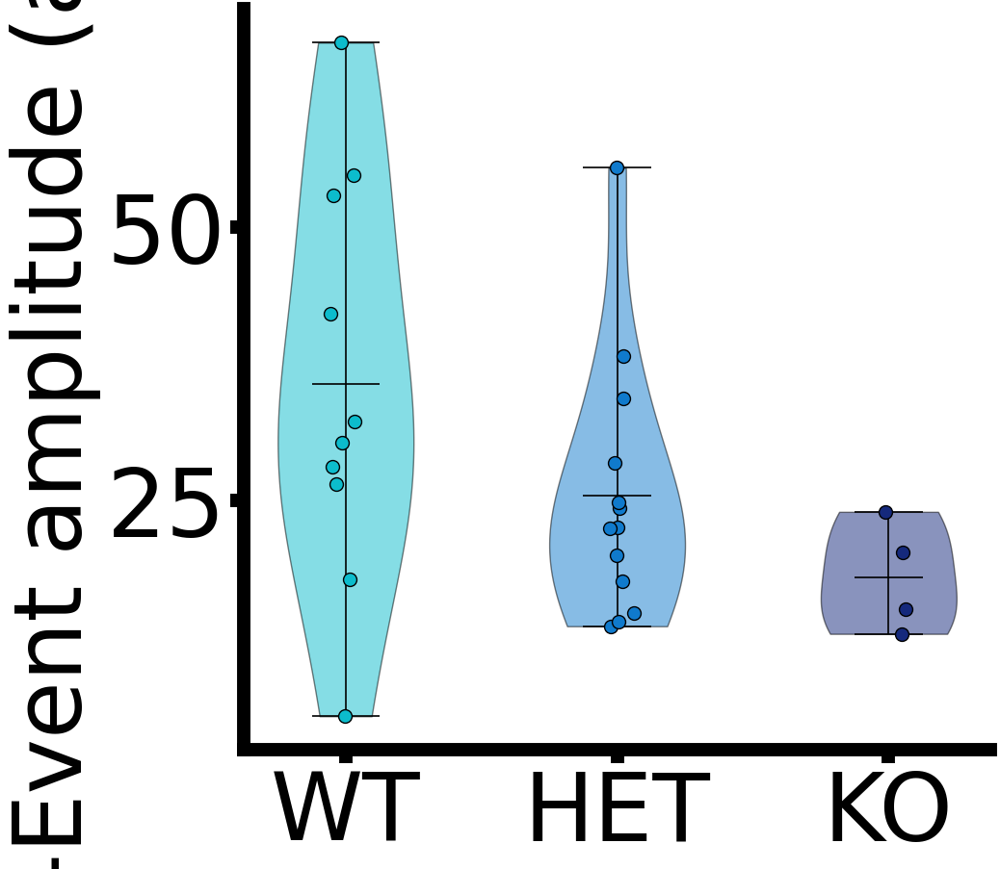

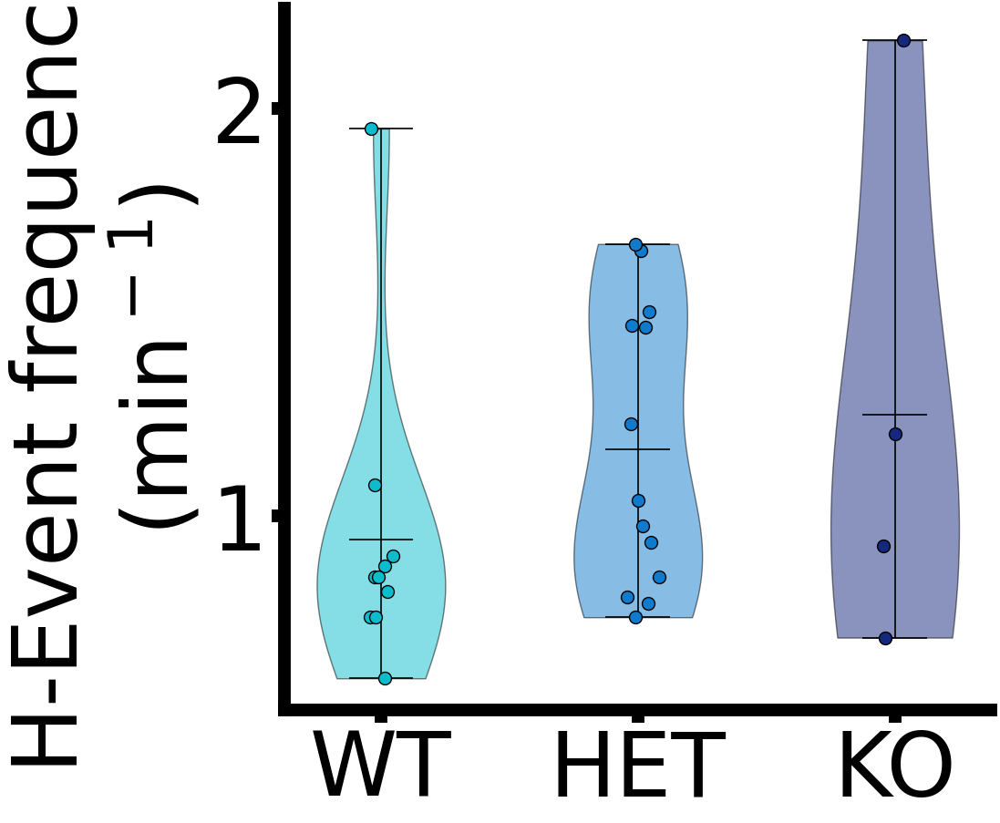

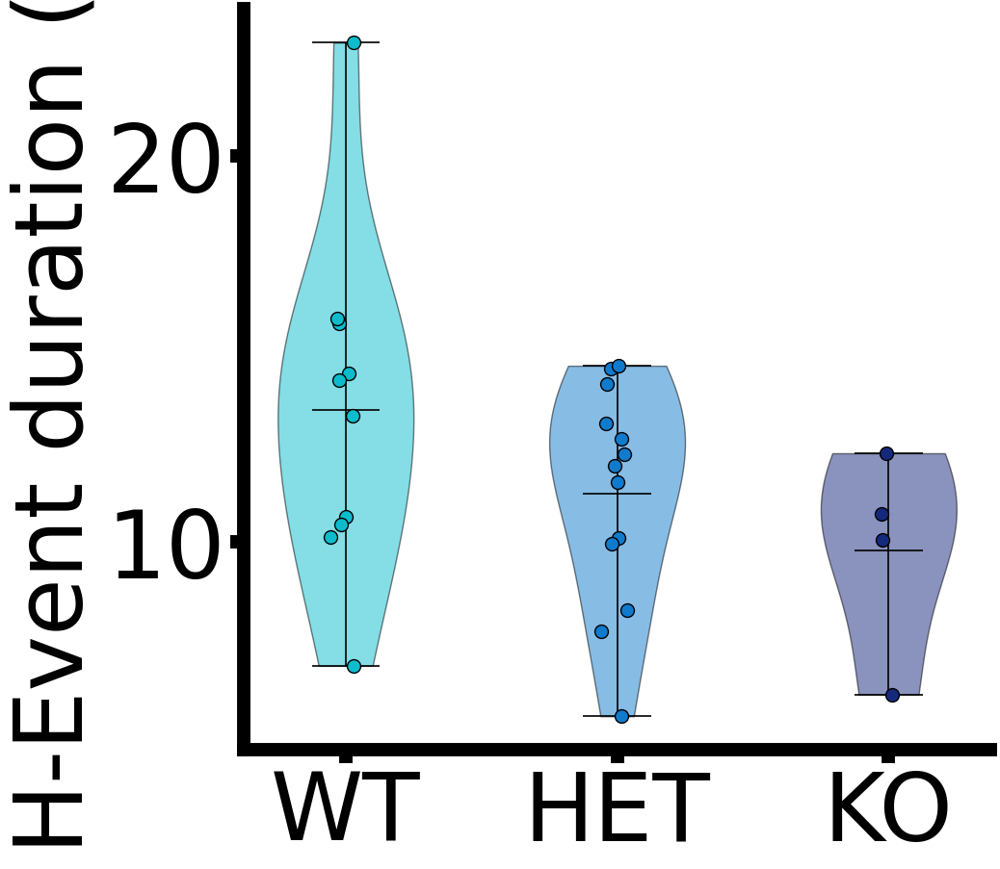

In [125]:
#Number of events violin plot
df_t = df[df['sex']=='Male']
plt.figure(figsize=(10,10))
PdA.violin_plot(df_t[df_t['age']<11],parameter='H_Event_max' , genotypes=['WT','HET','KO'], y_label = 'H-Event amplitude (a.u.)', color = [color1,color2,color3],title = None, fontsize = 70)
plt.savefig(Save_path + 'Male_H_event_max_violin.svg', dpi=300, bbox_inches='tight')
plt.figure(figsize=(10,10))
PdA.violin_plot(df_t[df_t['age']<11],parameter='H_events' , genotypes=['WT','HET','KO'], y_label = 'H-Event frequency\n(min$^-$$^1$)', color = [color1,color2,color3],title = None, fontsize = 70)
plt.savefig(Save_path + 'Male_Blue,H_events_violin.svg', dpi=300, bbox_inches='tight')
plt.figure(figsize=(10,10))
PdA.violin_plot(df_t[df_t['age']<11],parameter='H_Duration' , genotypes=['WT','HET','KO'], y_label = 'H-Event duration (s)', color = [color1,color2,color3],title = None, fontsize = 70)
plt.savefig(Save_path + 'Male_H_event_duration_violin.svg', dpi=300, bbox_inches='tight')

In [7]:
# rUN CaaN.stating(df[df['age']<11],'H_events',['WT','HET','KO'], alpha=0.05) for each event feature on df_t
df_t = df[df['sex']=='Male']
print('Max')
CaaN.stating(df_t[df_t['age']<11],'H_Event_max',['WT','HET','KO'], alpha=0.05)
print('Frequency')
CaaN.stating(df_t[df_t['age']<11],'H_events',['WT','HET','KO'], alpha=0.05)
print('Duration')
CaaN.stating(df_t[df_t['age']<11],'H_Duration',['WT','HET','KO'], alpha=0.05)

Max
Two way ANOVA results:
                          sum_sq    df         F    PR(>F)
C(age)               5337.617460   3.0  5.957709  0.001184
C(genotype)          4507.788199   2.0  7.547213  0.001129
C(age):C(genotype)   1410.885734   6.0  0.787397  0.582997
Residual            19411.552659  65.0       NaN       NaN
Shapiro p-val:3.291359689683304e-06


c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 2
  warnings.warn('covariance of constraints does not have full '
c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 6, but rank is 5
  warnings.warn('covariance of constraints does not have full '
c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 2
  warnings.warn('covariance of constraints does 

Permutation test results:
(0.001, 0.002, 0.556)
          HET        KO        WT
HET  1.000000  0.406458  0.009259
KO   0.406458  1.000000  0.008956
WT   0.009259  0.008956  1.000000
Frequency
Two way ANOVA results:
                       sum_sq    df         F    PR(>F)
C(age)               4.943955   3.0  8.430060  0.000082
C(genotype)          2.252188   2.0  5.760392  0.004976
C(age):C(genotype)   1.012026   6.0  0.862816  0.527020
Residual            12.706792  65.0       NaN       NaN
Shapiro p-val:3.004763857461512e-05


c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 2
  warnings.warn('covariance of constraints does not have full '
c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 6, but rank is 5
  warnings.warn('covariance of constraints does not have full '
c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 2
  warnings.warn('covariance of constraints does 

Permutation test results:
(0.0, 0.009, 0.515)
          HET        KO        WT
HET  1.000000  0.813789  0.013274
KO   0.813789  1.000000  0.131448
WT   0.013274  0.131448  1.000000
Duration
Two way ANOVA results:
                         sum_sq    df         F    PR(>F)
C(age)                35.927821   3.0  0.251821  0.859759
C(genotype)          237.867568   2.0  2.500850  0.089878
C(age):C(genotype)    92.832099   6.0  0.325334  0.921373
Residual            3091.227337  65.0       NaN       NaN
Shapiro p-val:1.2122670488973197e-13


c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 2
  warnings.warn('covariance of constraints does not have full '
c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 6, but rank is 5
  warnings.warn('covariance of constraints does not have full '
c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 2
  warnings.warn('covariance of constraints does 

Permutation test results:
(0.933, 0.084, 0.875)


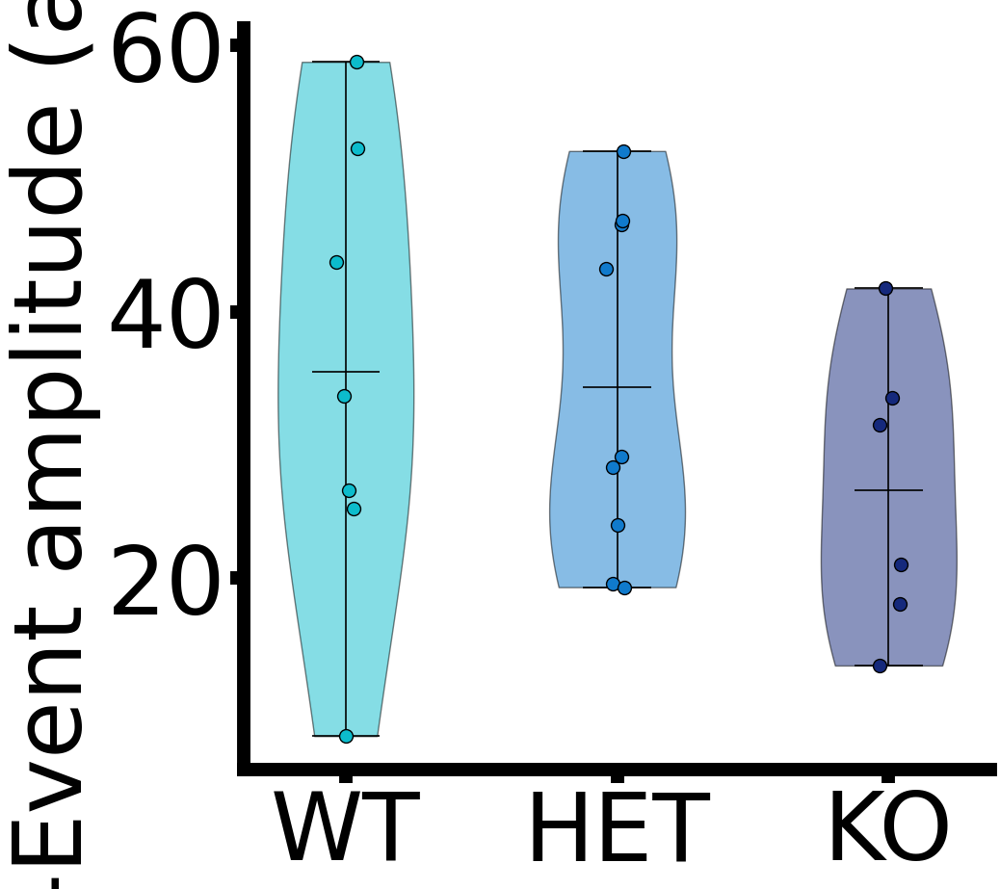

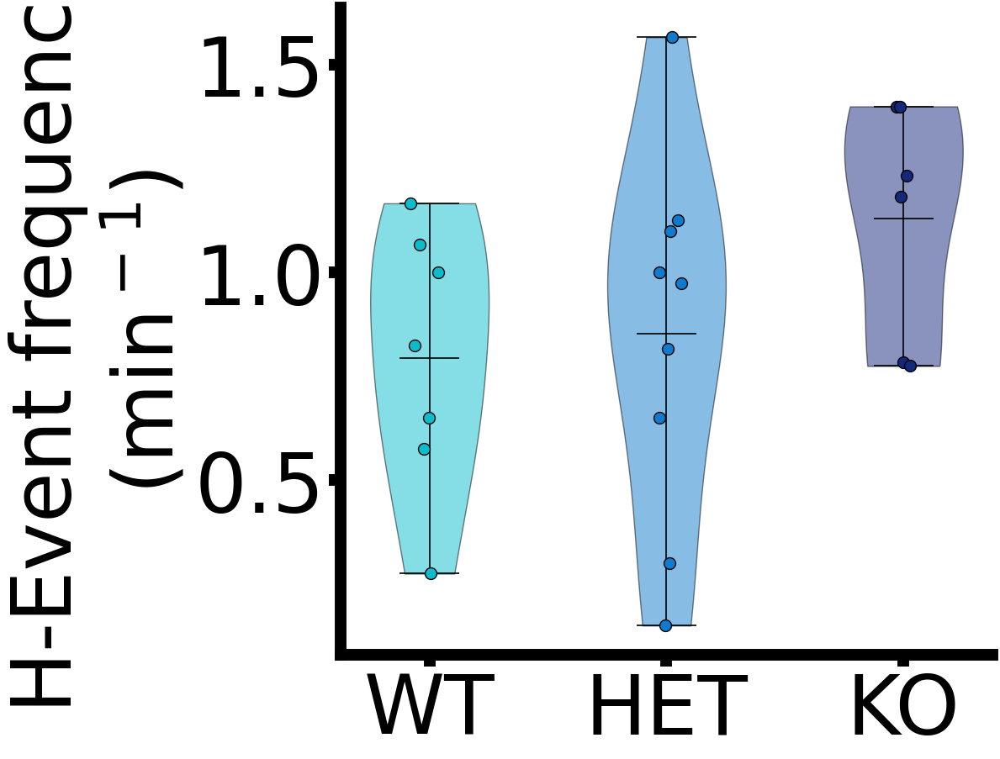

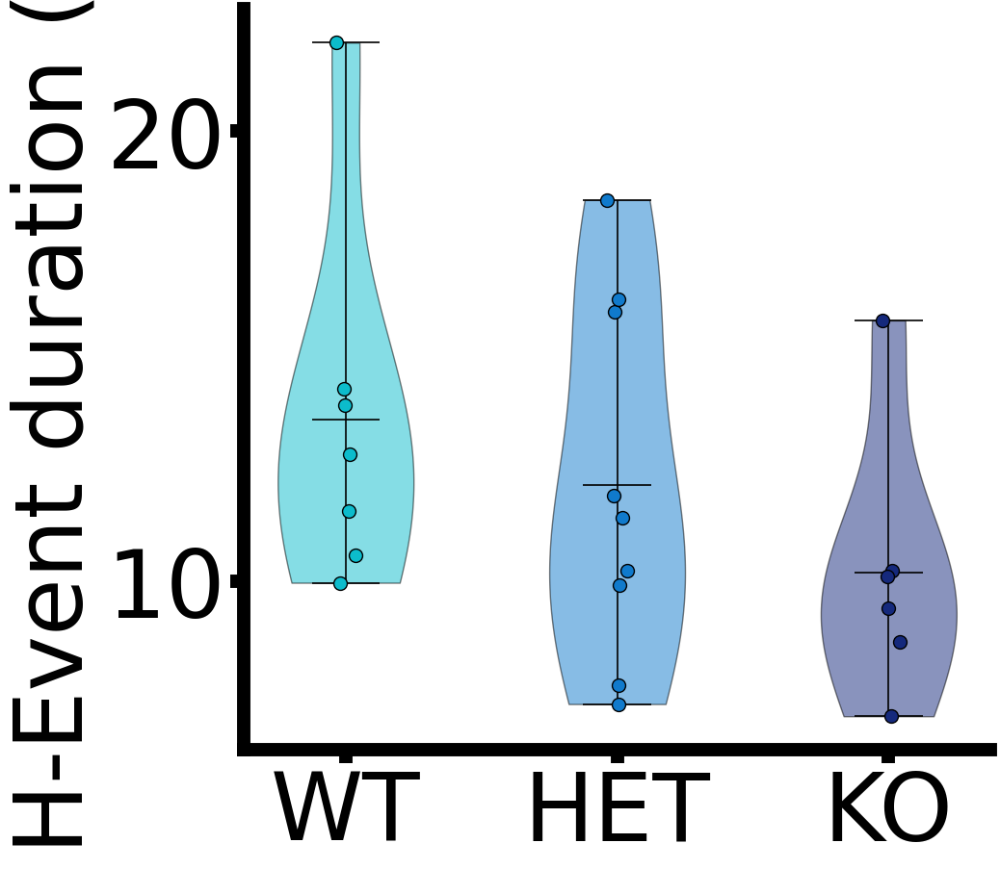

In [126]:
#Number of events violin plot
df_t = df[df['sex']=='Female']
plt.figure(figsize=(10,10))
PdA.violin_plot(df_t[df_t['age']<11],parameter='H_Event_max' , genotypes=['WT','HET','KO'], y_label = 'H-Event amplitude (a.u.)', color = [color1,color2,color3],title = None, fontsize = 70)
plt.savefig(Save_path + 'Female_H_event_max_violin.svg', dpi=300, bbox_inches='tight')
plt.figure(figsize=(10,10))
PdA.violin_plot(df_t[df_t['age']<11],parameter='H_events' , genotypes=['WT','HET','KO'], y_label = 'H-Event frequency\n(min$^-$$^1$)', color = [color1,color2,color3],title = None, fontsize = 70)
plt.savefig(Save_path + 'Female_Blue,H_events_violin.svg', dpi=300, bbox_inches='tight')
plt.figure(figsize=(10,10))
PdA.violin_plot(df_t[df_t['age']<11],parameter='H_Duration' , genotypes=['WT','HET','KO'], y_label = 'H-Event duration (s)', color = [color1,color2,color3],title = None, fontsize = 70)
plt.savefig(Save_path + 'Female_H_event_duration_violin.svg', dpi=300, bbox_inches='tight')

In [8]:
# Stats

df_t = df[df['sex']=='Female']
print('Max')
CaaN.stating(df_t[df_t['age']<11],'H_Event_max',['WT','HET','KO'], alpha=0.05)
print('Frequency')
CaaN.stating(df_t[df_t['age']<11],'H_events',['WT','HET','KO'], alpha=0.05)
print('Duration')
CaaN.stating(df_t[df_t['age']<11],'H_Duration',['WT','HET','KO'], alpha=0.05)

Max
Two way ANOVA results:
                          sum_sq    df         F    PR(>F)
C(age)               5526.216792   3.0  5.775417  0.001832
C(genotype)           138.589059   2.0  0.217258  0.805493
C(age):C(genotype)   1245.828156   6.0  0.651004  0.689050
Residual            15628.574370  49.0       NaN       NaN
Shapiro p-val:0.0009359506075270474


c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 2
  warnings.warn('covariance of constraints does 

Permutation test results:
(0.008, 0.811, 0.71)
Frequency
Two way ANOVA results:
                      sum_sq    df         F    PR(>F)
C(age)              3.597107   3.0  8.295558  0.000146
C(genotype)         0.419429   2.0  1.450916  0.244246
C(age):C(genotype)  0.311103   6.0  0.358729  0.901322
Residual            7.082435  49.0       NaN       NaN
Shapiro p-val:0.046602312475442886


c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does 

Permutation test results:
(0.0, 0.265, 0.897)
Duration
Two way ANOVA results:
                         sum_sq    df         F    PR(>F)
C(age)                71.070245   3.0  1.032520  0.386439
C(genotype)           90.818386   2.0  1.979136  0.149082
C(age):C(genotype)    32.998986   6.0  0.239707  0.961170
Residual            1124.253660  49.0       NaN       NaN
Shapiro p-val:3.641249713837169e-05


c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
c:\Users\gabrielos\anaconda3\lib\site-packages\statsmodels\base\model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does 

Permutation test results:
(0.413, 0.162, 0.965)


### SSRI

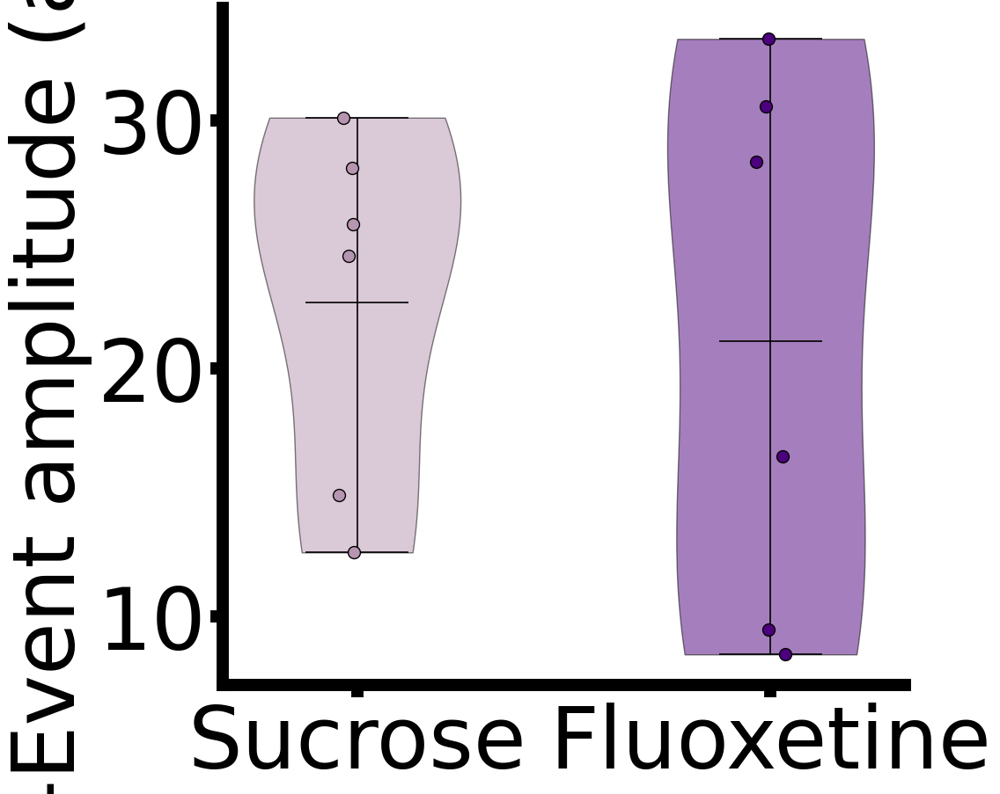

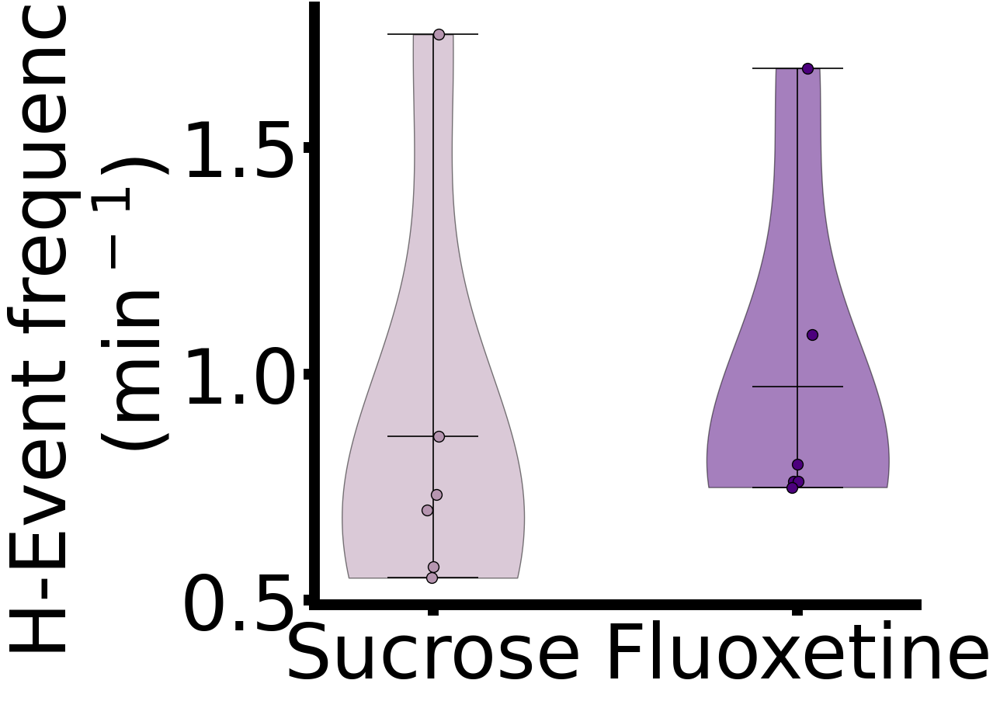

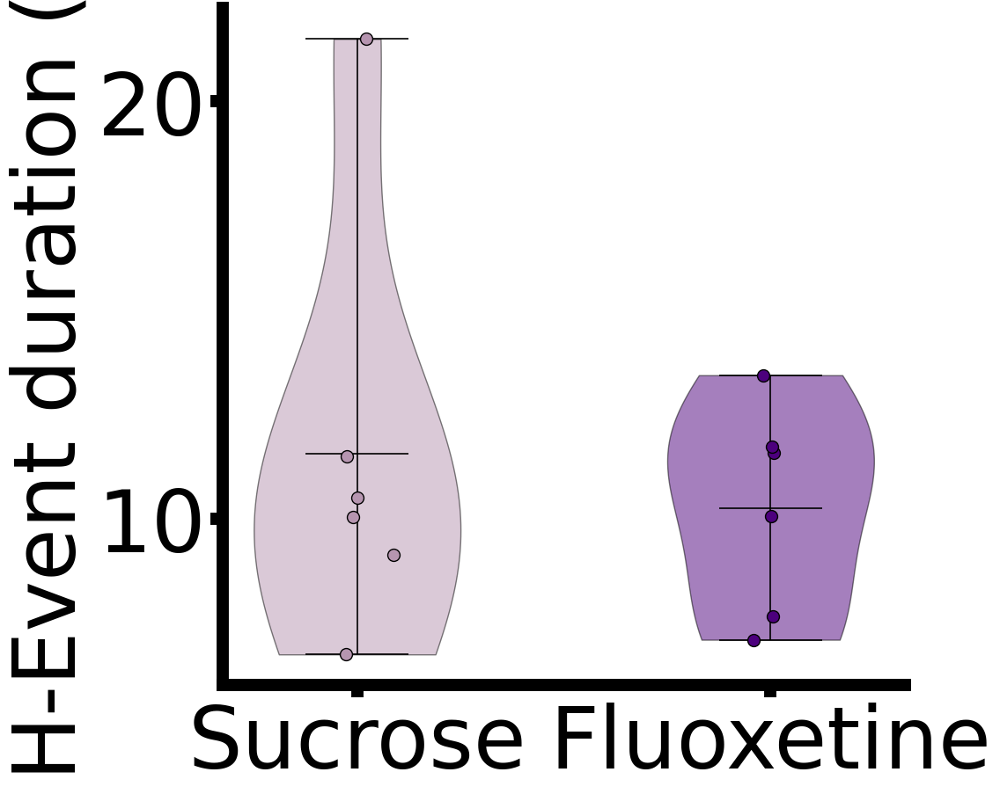

In [127]:
#Number of events violin plot
df_t = df[df['sex']=='Male']
plt.figure(figsize=(10,10))
PdA.violin_plot(df_t[df_t['age']<11],parameter='H_Event_max' , genotypes=['Control','SSRI'], y_label = 'H-Event amplitude (a.u.)', color = [color4,color5],title = None, fontsize = 70)
plt.xticks([1,2],['Sucrose','Fluoxetine'],fontsize=70)
plt.savefig(Save_path + 'Male_ssri_H_event_max_violin.svg', dpi=300, bbox_inches='tight')
plt.figure(figsize=(10,10))
PdA.violin_plot(df_t[df_t['age']<11],parameter='H_events' , genotypes=['Control','SSRI'], y_label = 'H-Event frequency\n(min$^-$$^1$)', color = [color4,color5],title = None, fontsize = 70)
plt.xticks([1,2],['Sucrose','Fluoxetine'],fontsize=70)
plt.savefig(Save_path + 'Male_ssri_H_events_violin.svg', dpi=300, bbox_inches='tight')
plt.figure(figsize=(10,10))
PdA.violin_plot(df_t[df_t['age']<11],parameter='H_Duration' , genotypes=['Control','SSRI'], y_label = 'H-Event duration (s)', color = [color4,color5],title = None, fontsize = 70)
plt.xticks([1,2],['Sucrose','Fluoxetine'],fontsize=70)
plt.savefig(Save_path + 'Male_ssri_H_event_duration_violin.svg', dpi=300, bbox_inches='tight')

In [10]:
for var in ['H_Event_max','H_events','H_Duration']:
    print(var)

    # Number of l events stats: No effect!
    df_t = df[df['sex']=='Male']
    df_tmp = df_t[df_t['age']<11]
    #Select only control and ssri
    df_tmp = df_tmp[df_tmp['genotype'].isin(['Control','SSRI'])]
    #Make control control 0 and ssri 1
    df_tmp['genotype'] = df_tmp['genotype'].replace('Control',0)
    df_tmp['genotype'] = df_tmp['genotype'].replace('SSRI',1)
    #Average across ages for the same animal
    df_tmp = df_tmp.groupby(['animal']).mean().reset_index()
    #Perform shapiro
    print(stats.shapiro(df_tmp[df_tmp['genotype']==0][var]))
    #Perform mann whitney u test in control and ssri
    print(stats.mannwhitneyu(df_tmp[df_tmp['genotype']==0][var],df_tmp[df_tmp['genotype']==1][var]))
    #Perform t test in control and ssri
    print(stats.ttest_ind(df_tmp[df_tmp['genotype']==0][var],df_tmp[df_tmp['genotype']==1][var]))

H_Event_max
ShapiroResult(statistic=0.8738998770713806, pvalue=0.24219763278961182)
MannwhitneyuResult(statistic=17.0, pvalue=0.9372294372294373)
Ttest_indResult(statistic=0.2929404792226247, pvalue=0.7755562741741364)
H_events
ShapiroResult(statistic=0.7233898639678955, pvalue=0.01080191507935524)
MannwhitneyuResult(statistic=10.0, pvalue=0.2289506814145954)
Ttest_indResult(statistic=-0.46879837665716717, pvalue=0.6492665691086303)
H_Duration
ShapiroResult(statistic=0.7905514240264893, pvalue=0.048243988305330276)
MannwhitneyuResult(statistic=16.0, pvalue=0.8181818181818182)
Ttest_indResult(statistic=0.5618572931330507, pvalue=0.5865847003603686)


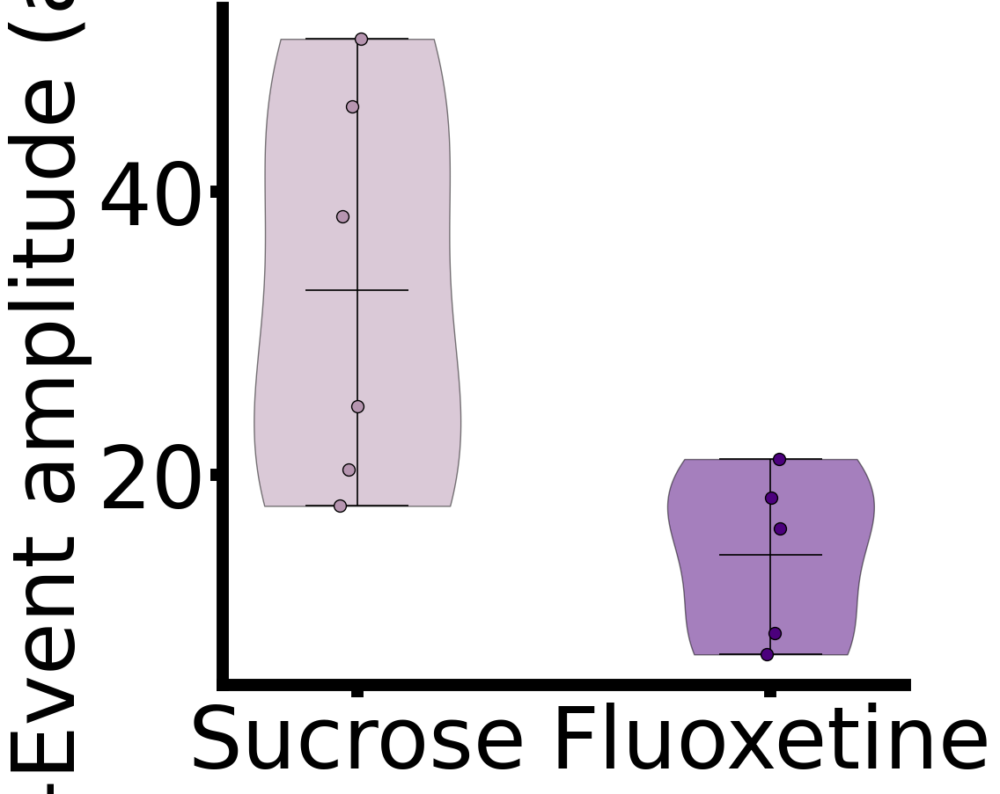

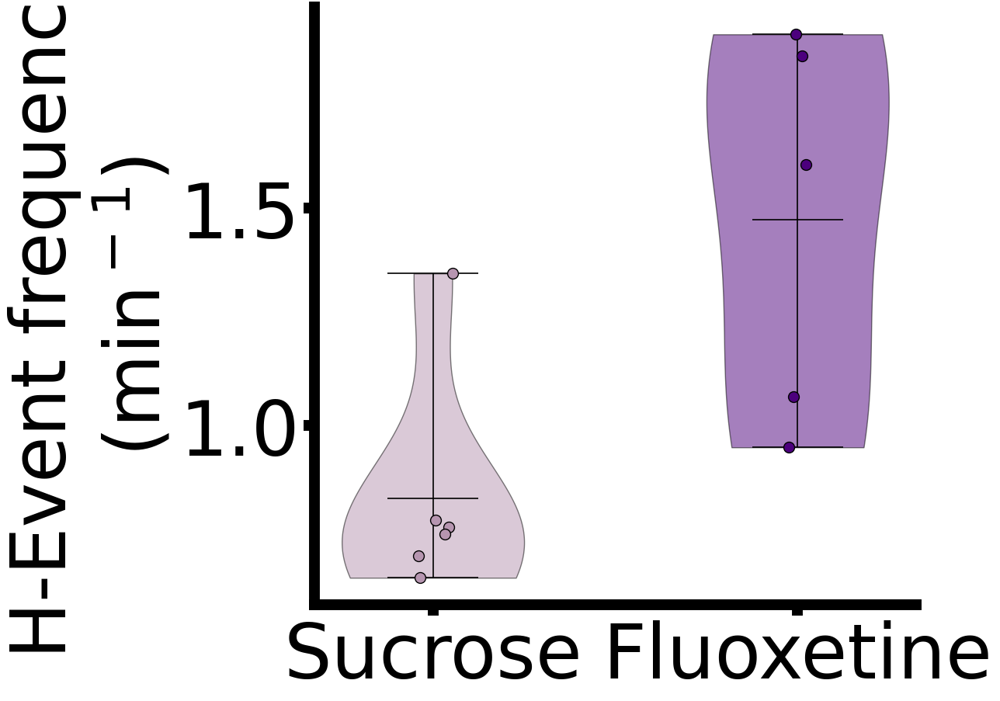

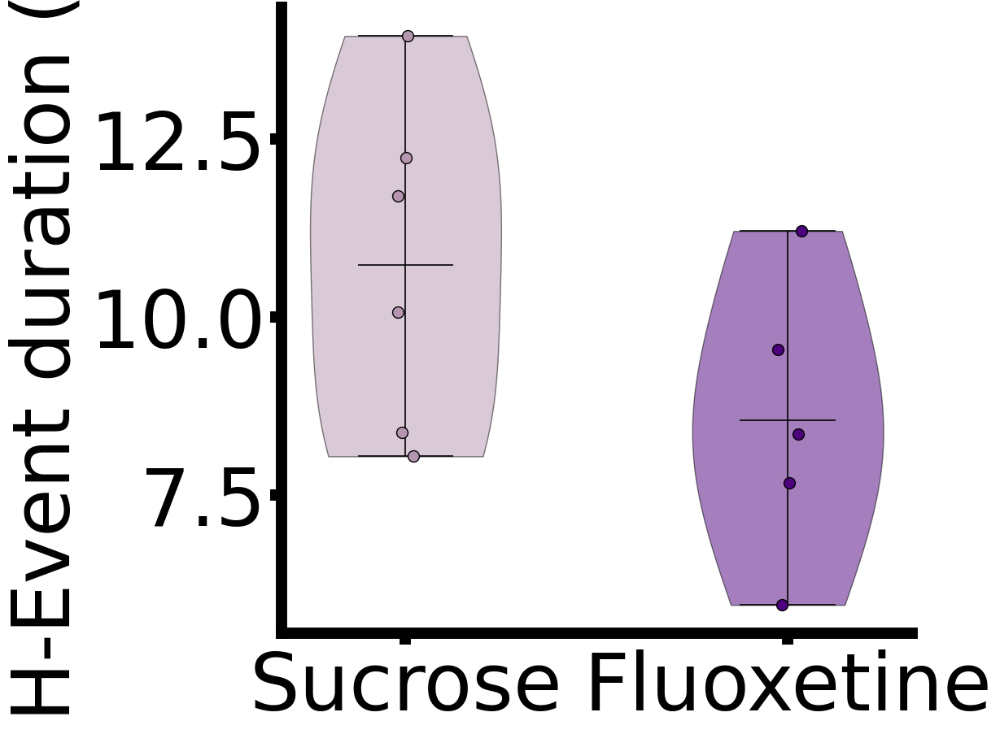

In [128]:
#Number of events violin plot
df_t = df[df['sex']=='Female']
plt.figure(figsize=(10,10))
PdA.violin_plot(df_t[df_t['age']<11],parameter='H_Event_max' , genotypes=['Control','SSRI'], y_label = 'H-Event amplitude (a.u.)', color = [color4,color5],title = None, fontsize = 70)
plt.xticks([1,2],['Sucrose','Fluoxetine'],fontsize=70)
plt.savefig(Save_path + 'Female_ssri_H_event_max_violin.svg', dpi=300, bbox_inches='tight')
plt.figure(figsize=(10,10))
PdA.violin_plot(df_t[df_t['age']<11],parameter='H_events' , genotypes=['Control','SSRI'], y_label = 'H-Event frequency\n(min$^-$$^1$)', color = [color4,color5],title = None, fontsize = 70)
plt.xticks([1,2],['Sucrose','Fluoxetine'],fontsize=70)
plt.savefig(Save_path + 'Female_Blue_ssri_H_events_violin.svg', dpi=300, bbox_inches='tight')
plt.figure(figsize=(10,10))
PdA.violin_plot(df_t[df_t['age']<11],parameter='H_Duration' , genotypes=['Control','SSRI'], y_label = 'H-Event duration (s)', color = [color4,color5],title = None, fontsize = 70)
plt.xticks([1,2],['Sucrose','Fluoxetine'],fontsize=70)
plt.savefig(Save_path + 'Female_ssri_H_event_duration_violin.svg', dpi=300, bbox_inches='tight')

In [11]:
for var in ['H_Event_max','H_events','H_Duration']:
    print(var)

    # Number of l events stats: No effect!
    df_t = df[df['sex']=='Female']
    df_tmp = df_t[df_t['age']<11]
    #Select only control and ssri
    df_tmp = df_tmp[df_tmp['genotype'].isin(['Control','SSRI'])]
    #Make control control 0 and ssri 1
    df_tmp['genotype'] = df_tmp['genotype'].replace('Control',0)
    df_tmp['genotype'] = df_tmp['genotype'].replace('SSRI',1)
    #Average across ages for the same animal
    df_tmp = df_tmp.groupby(['animal']).mean().reset_index()
    #Perform shapiro
    print(stats.shapiro(df_tmp[df_tmp['genotype']==0][var]))
    #Perform mann whitney u test in control and ssri
    print(stats.mannwhitneyu(df_tmp[df_tmp['genotype']==0][var],df_tmp[df_tmp['genotype']==1][var]))
    #Perform t test in control and ssri
    print(stats.ttest_ind(df_tmp[df_tmp['genotype']==0][var],df_tmp[df_tmp['genotype']==1][var]))

H_Event_max
ShapiroResult(statistic=0.9021812677383423, pvalue=0.386983722448349)
MannwhitneyuResult(statistic=27.0, pvalue=0.030303030303030304)
Ttest_indResult(statistic=2.764904760446524, pvalue=0.02193550433959032)
H_events
ShapiroResult(statistic=0.6789771318435669, pvalue=0.003683530492708087)
MannwhitneyuResult(statistic=2.0, pvalue=0.017316017316017316)
Ttest_indResult(statistic=-3.007610787126936, pvalue=0.01477295143704051)
H_Duration
ShapiroResult(statistic=0.9430716037750244, pvalue=0.6840333342552185)
MannwhitneyuResult(statistic=24.0, pvalue=0.12554112554112554)
Ttest_indResult(statistic=1.660934012183184, pvalue=0.13109476375840165)


## Whisker stim

### SERTKO

ANOVA: F_onewayResult(statistic=0.28947981047662913, pvalue=0.7515922961789465)
Tukey: Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
   1.0    2.0   0.1305 0.7306 -0.3019 0.5628  False
   1.0    3.0   0.0887 0.9211 -0.4893 0.6668  False
   2.0    3.0  -0.0417 0.9783  -0.569 0.4856  False
---------------------------------------------------


C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\1846486106.py:15: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for leg in leg.legendHandles:


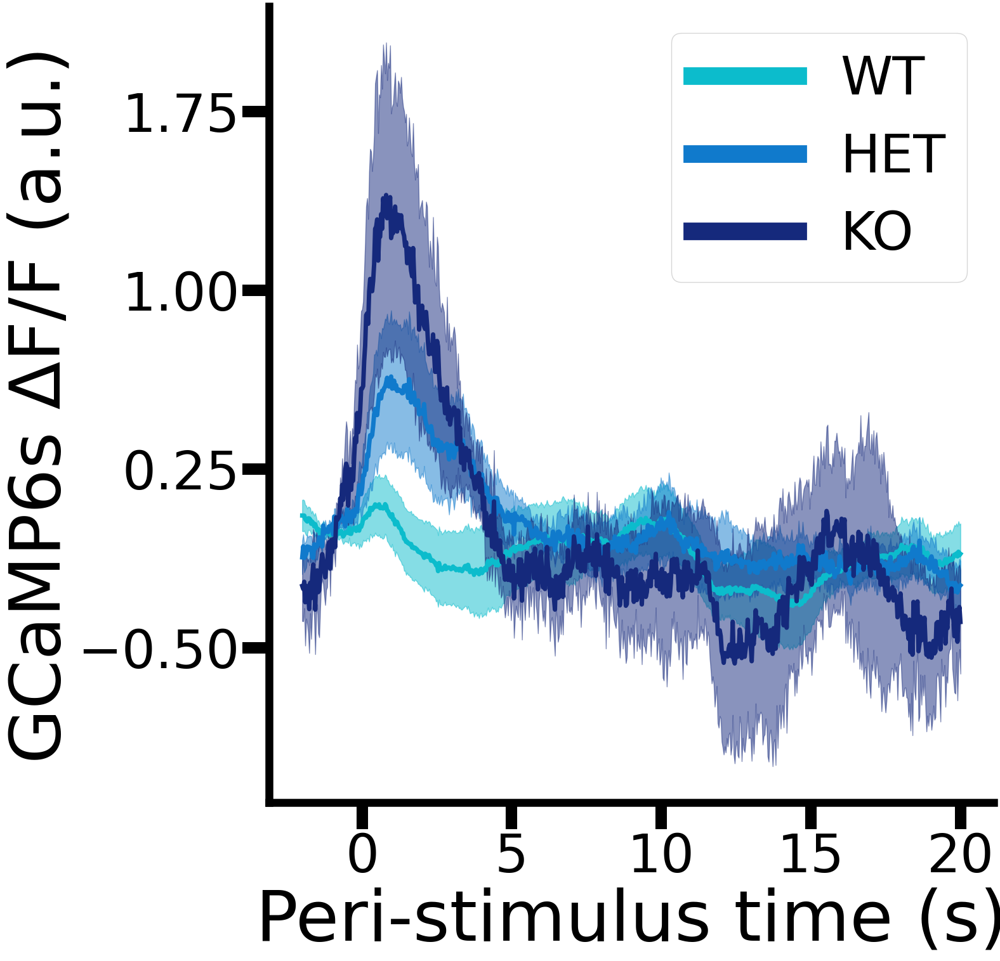

In [129]:
#P11-13
df['Whisker_response_trace_cropped'] = None
for i, row in df.iterrows():
    #if row['Whisker_responsive']>=0.0:
    #if row['Whisker_responsive']>=0.01: 
        try:
            df.at[i,'Whisker_response_trace_cropped'] = row['Whisker_response_trace'][:660]
        except:
            pass

df_t = df[df['sex']=='Male']
plt.figure(figsize=(15,15))
PdA.Response(df_t,parameter='Whisker_response_trace_cropped', length = 660, genotypes=['WT','HET','KO'], ages=[11,12,13], color = [color1,color2,color3],title = None,sp_row=1,sp_colomn=1,sp_number=1,stat = np.nanmean)
leg = plt.legend(fontsize=60)
for leg in leg.legendHandles:
    leg.set_linewidth(20)
plt.xlabel('Peri-stimulus time (s)',fontsize=80)
plt.xticks(np.linspace(0,600,5),np.linspace(0,20,5).astype(int),fontsize=60)
plt.yticks(np.arange(-0.5,2,0.75), fontsize=60)
plt.ylabel('GCaMP6s ΔF/F (a.u.)',fontsize=80)

#save figure
plt.savefig(Save_path + 'Male_Blue_Whisker_response_22s_p11-13.svg',dpi=300)


c:\Users\gabrielos\SerotoninBeyond\DPhil_2\Notebooks\utils\Pandas_analysis.py:682: RuntimeWarning: Mean of empty slice
  baseline = np.nanmean(globals()[g][:,:60],axis=1)
c:\Users\gabrielos\SerotoninBeyond\DPhil_2\Notebooks\utils\Pandas_analysis.py:691: RuntimeWarning: Mean of empty slice
  globals()[g] = stat(globals()[g][:,60:],axis=1)


Kruskal Wallis test: KruskalResult(statistic=4.051020408163268, pvalue=0.13192651656690413)
Tukey: Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
   1.0    2.0   0.2671 0.5026 -0.3332 0.8674  False
   1.0    3.0   0.5853 0.0877 -0.0759 1.2465  False
   2.0    3.0   0.3182 0.4681 -0.3609 0.9973  False
---------------------------------------------------


C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\1075157345.py:15: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for leg in leg.legendHandles:


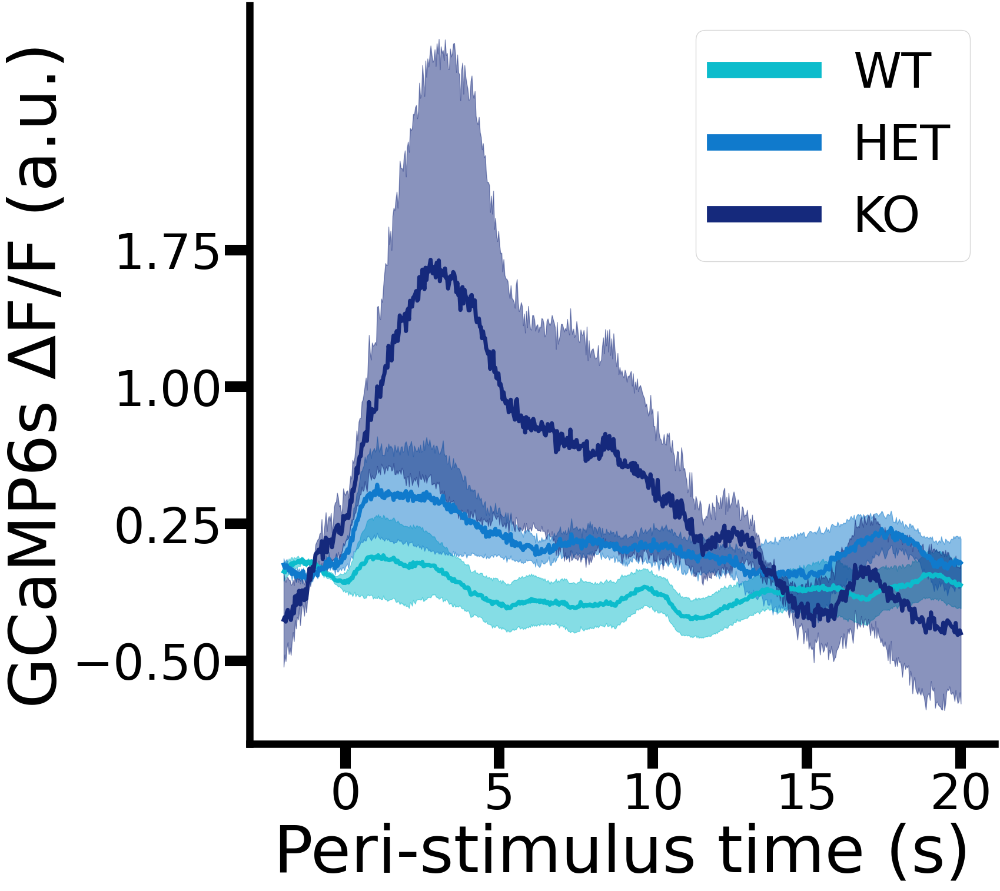

In [130]:
#P11-13
df['Whisker_response_trace_cropped'] = None
for i, row in df.iterrows():
    #if row['Whisker_responsive']>=0.0:
    #if row['Whisker_responsive']>=0.01: 
        try:
            df.at[i,'Whisker_response_trace_cropped'] = row['Whisker_response_trace'][:660]
        except:
            pass

df_t = df[df['sex']=='Female']
plt.figure(figsize=(15,15))
PdA.Response(df_t,parameter='Whisker_response_trace_cropped', length = 660, genotypes=['WT','HET','KO'], ages=[11,12,13], color = [color1,color2,color3],title = None,sp_row=1,sp_colomn=1,sp_number=1,stat = np.nanmean)
leg = plt.legend(fontsize=60)
for leg in leg.legendHandles:
    leg.set_linewidth(20)
plt.xlabel('Peri-stimulus time (s)',fontsize=80)
plt.xticks(np.linspace(0,600,5),np.linspace(0,20,5).astype(int),fontsize=60)
plt.yticks(np.arange(-0.5,2,0.75), fontsize=60)
plt.ylabel('GCaMP6s ΔF/F (a.u.)',fontsize=80)

#save figure
plt.savefig(Save_path + 'Female_Blue_Whisker_response_22s_p11-13.svg',dpi=300)


### SSRI

T-test: Ttest_indResult(statistic=-2.6593995527356524, pvalue=0.02392393191423039)


C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\1356298423.py:15: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for leg in leg.legendHandles:


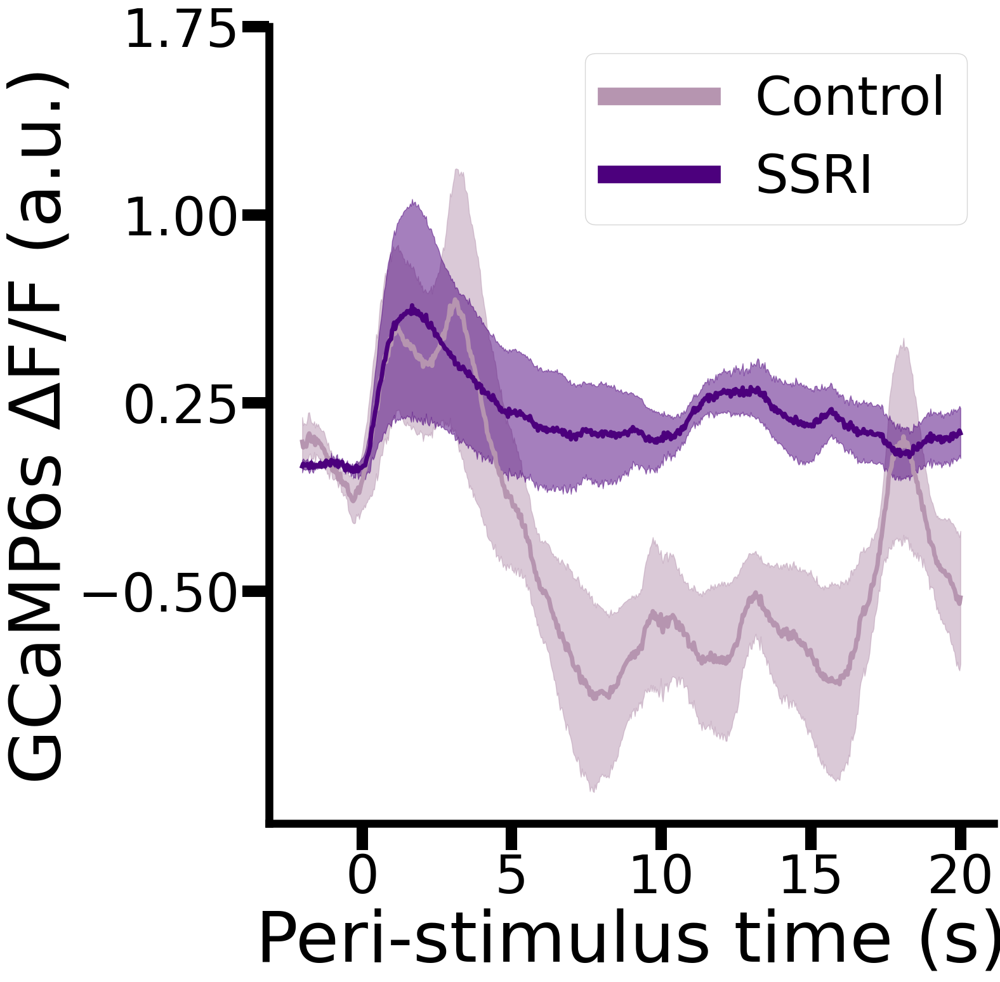

In [135]:
#P11-13
df['Whisker_response_trace_cropped'] = None
for i, row in df.iterrows():
    #if row['Whisker_responsive']>=0.0:
    #if row['Whisker_responsive']>=0.01: 
        try:
            df.at[i,'Whisker_response_trace_cropped'] = row['Whisker_response_trace'][:660]
        except:
            pass

df_t = df[df['sex']=='Male']
plt.figure(figsize=(15,15))
PdA.Response(df_t,parameter='Whisker_response_trace_cropped', length = 660, genotypes=['Control','SSRI'], ages=[11,12,13], color = [color4,color5],title = None,sp_row=1,sp_colomn=1,sp_number=1,stat = np.nanmean)
leg = plt.legend(fontsize=60)
for leg in leg.legendHandles:
    leg.set_linewidth(20)
plt.xlabel('Peri-stimulus time (s)',fontsize=80)
plt.xticks(np.linspace(0,600,5),np.linspace(0,20,5).astype(int),fontsize=60)
plt.yticks(np.arange(-0.5,2,0.75), fontsize=60)
plt.ylabel('GCaMP6s ΔF/F (a.u.)',fontsize=80)

#save figure
plt.savefig(Save_path + 'Male_SSRI_lue_Whisker_response_22s_p11-13.svg',dpi=300)


T-test: Ttest_indResult(statistic=-1.5060094850280699, pvalue=0.1663285397653578)


C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\2841077968.py:15: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for leg in leg.legendHandles:


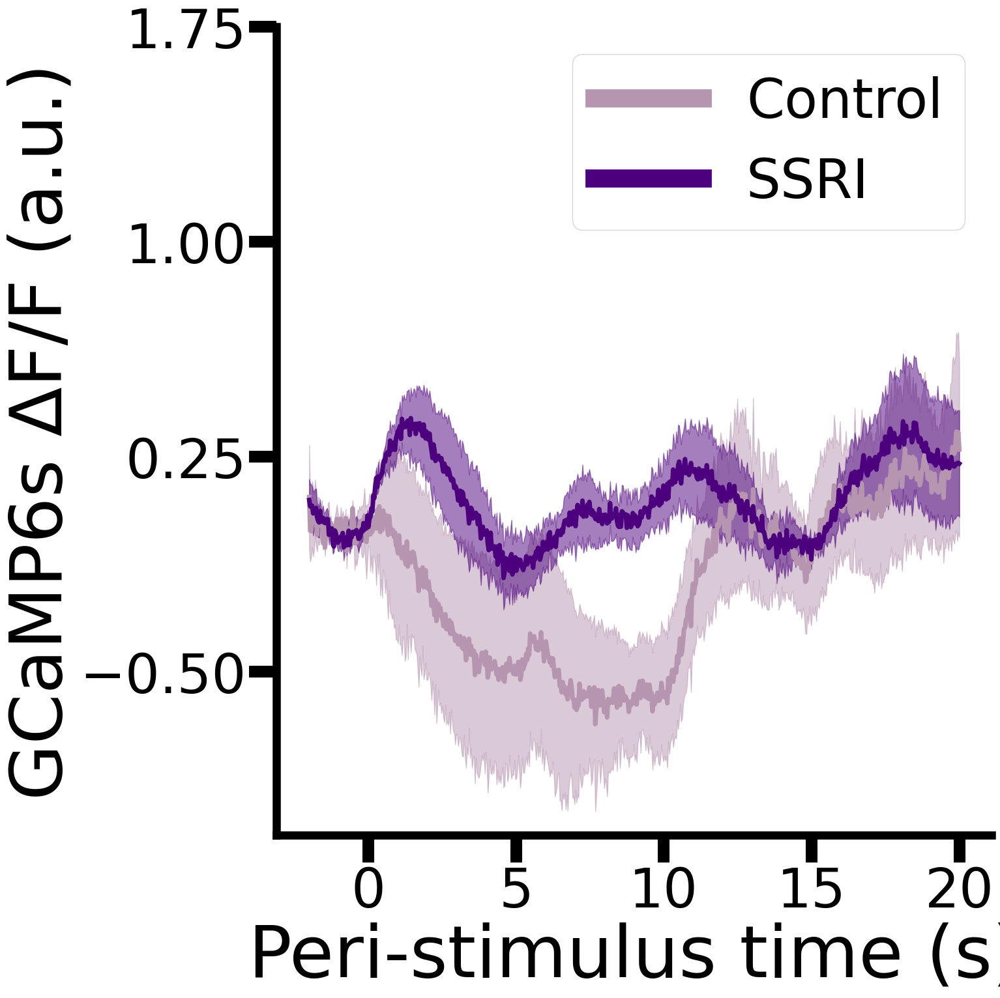

In [136]:
#P11-13
df['Whisker_response_trace_cropped'] = None
for i, row in df.iterrows():
    #if row['Whisker_responsive']>=0.0:
    #if row['Whisker_responsive']>=0.01: 
        try:
            df.at[i,'Whisker_response_trace_cropped'] = row['Whisker_response_trace'][:660]
        except:
            pass

df_t = df[df['sex']=='Female']
plt.figure(figsize=(15,15))
PdA.Response(df_t,parameter='Whisker_response_trace_cropped', length = 660, genotypes=['Control','SSRI'], ages=[11,12,13], color = [color4,color5],title = None,sp_row=1,sp_colomn=1,sp_number=1,stat = np.nanmean)
leg = plt.legend(fontsize=60)
for leg in leg.legendHandles:
    leg.set_linewidth(20)
plt.xlabel('Peri-stimulus time (s)',fontsize=80)
plt.xticks(np.linspace(0,600,5),np.linspace(0,20,5).astype(int),fontsize=60)
plt.yticks(np.arange(-0.5,2,0.75), fontsize=60)
plt.ylabel('GCaMP6s ΔF/F (a.u.)',fontsize=80)

#save figure
plt.savefig(Save_path + 'Female_SSRI_Blue_Whisker_response_22s_p11-13.svg',dpi=300)


## Cummulative probability

### SERTKO

At P7-10, KS test between WT and HET: KstestResult(statistic=0.09282346396227964, pvalue=1.4093306472984734e-17, statistic_location=2.717936940562249, statistic_sign=1)
At P7-10, KS test between WT and KO: KstestResult(statistic=0.11682472512940643, pvalue=1.4769340605744025e-12, statistic_location=2.6894684171844743, statistic_sign=1)
At P7-10, KS test between HET and KO: KstestResult(statistic=0.05641508032774711, pvalue=0.001513283560459182, statistic_location=2.759522129356711, statistic_sign=-1)
At P11-14, KS test between WT and HET: KstestResult(statistic=0.18555598505347248, pvalue=8.642308922805674e-55, statistic_location=2.7636755997008406, statistic_sign=1)
At P11-14, KS test between WT and KO: KstestResult(statistic=0.13116866383198042, pvalue=2.5054750090767934e-16, statistic_location=2.743206803635637, statistic_sign=-1)
At P11-14, KS test between HET and KO: KstestResult(statistic=0.14276940256839754, pvalue=6.053654826455689e-25, statistic_location=2.7601638476646846, st

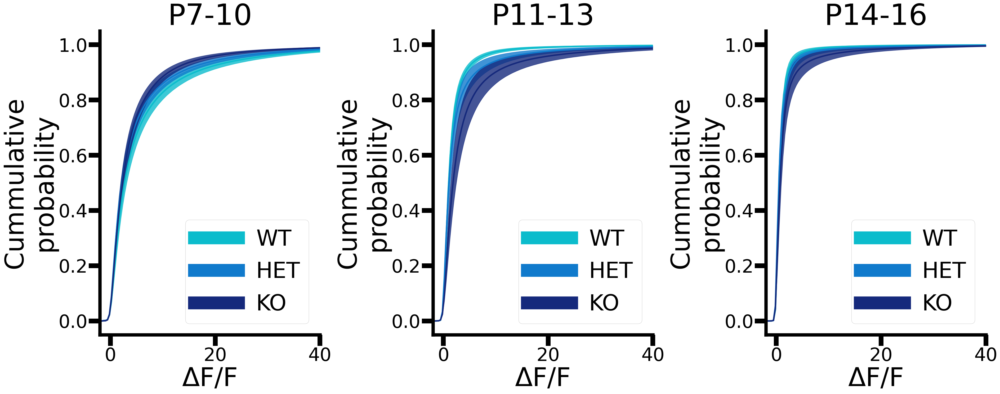

In [137]:
# dF/F Cumulative probability plot
df_t = df[df['sex']=='Male']

plt.figure(figsize=(50,15))
PdA.cum_sum(df_t, 'cumulative_1_percentile_dF_F', genotypes=['WT','HET','KO'],color=[color1,color2,color3],ages=[7,8,9,10],sp_number=1,x_lim=40,title='P7-10',vertical_line=False, vertical_line_val=2)
PdA.cum_sum(df_t, 'cumulative_1_percentile_dF_F', genotypes=['WT','HET','KO'],color=[color1,color2,color3],ages=[11,12,13],sp_number=2,x_lim=40,title='P11-13',vertical_line=False, vertical_line_val=2)
PdA.cum_sum(df_t, 'cumulative_1_percentile_dF_F', genotypes=['WT','HET','KO'],color=[color1,color2,color3],ages=[14,15,16],sp_number=3,x_lim=40,title='P14-16',vertical_line=False, vertical_line_val=2)

#Run kolmogorov-smirnov test between genotypes
df_7_10 = df_t[(df_t['age'] <10)]
#Store all cummulative_1_percentile_dF_F values in a different array for each genotype
WT_7_10 = np.vstack(df_7_10[df_7_10['genotype'] == 'WT']['cumulative_1_percentile_dF_F'])#.values
HET_7_10 = np.vstack(df_7_10[df_7_10['genotype'] == 'HET']['cumulative_1_percentile_dF_F'])#.values
KO_7_10 = np.vstack(df_7_10[df_7_10['genotype'] == 'KO']['cumulative_1_percentile_dF_F'])#.values
#Run KS test
print('At P7-10, KS test between WT and HET: ' + str(stats.ks_2samp(np.reshape(WT_7_10,(WT_7_10.size)),np.reshape(HET_7_10,(HET_7_10.size)))))
print('At P7-10, KS test between WT and KO: ' + str(stats.ks_2samp(np.reshape(WT_7_10,(WT_7_10.size)),np.reshape(KO_7_10,(KO_7_10.size)))))
print('At P7-10, KS test between HET and KO: ' + str(stats.ks_2samp(np.reshape(HET_7_10,(HET_7_10.size)),np.reshape(KO_7_10,(KO_7_10.size)))))

df_11_14 = df_t[(df_t['age'] >= 11) & (df_t['age'] <14)] 
#Store all cummulative_1_percentile_dF_F values in a different array for each genotype
WT_11_14 = np.vstack(df_11_14[df_11_14['genotype'] == 'WT']['cumulative_1_percentile_dF_F'])#.values
HET_11_14 = np.vstack(df_11_14[df_11_14['genotype'] == 'HET']['cumulative_1_percentile_dF_F'])#.values
KO_11_14 = np.vstack(df_11_14[df_11_14['genotype'] == 'KO']['cumulative_1_percentile_dF_F'])#.values
#Run KS test
print('At P11-14, KS test between WT and HET: ' + str(stats.ks_2samp(np.reshape(WT_11_14,(WT_11_14.size)),np.reshape(HET_11_14,(HET_11_14.size)))))
print('At P11-14, KS test between WT and KO: ' + str(stats.ks_2samp(np.reshape(WT_11_14,(WT_11_14.size)),np.reshape(KO_11_14,(KO_11_14.size)))))
print('At P11-14, KS test between HET and KO: ' + str(stats.ks_2samp(np.reshape(HET_11_14,(HET_11_14.size)),np.reshape(KO_11_14,(KO_11_14.size)))))

df_15_16 = df_t[(df_t['age'] >= 15)]
#Store all cummulative_1_percentile_dF_F values in a different array for each genotype
WT_15_16 = np.vstack(df_15_16[df_15_16['genotype'] == 'WT']['cumulative_1_percentile_dF_F'])#.values
HET_15_16 = np.vstack(df_15_16[df_15_16['genotype'] == 'HET']['cumulative_1_percentile_dF_F'])#.values
KO_15_16 = np.vstack(df_15_16[df_15_16['genotype'] == 'KO']['cumulative_1_percentile_dF_F'])#.values
#Run KS test
print('At P15-16, KS test between WT and HET: ' + str(stats.ks_2samp(np.reshape(WT_15_16,(WT_15_16.size)),np.reshape(HET_15_16,(HET_15_16.size)))))
print('At P15-16, KS test between WT and KO: ' + str(stats.ks_2samp(np.reshape(WT_15_16,(WT_15_16.size)),np.reshape(KO_15_16,(KO_15_16.size)))))
print('At P15-16, KS test between HET and KO: ' + str(stats.ks_2samp(np.reshape(HET_15_16,(HET_15_16.size)),np.reshape(KO_15_16,(KO_15_16.size)))))

#
#plt.savefig(Save_path + 'SERTKO_Cumulative_1_percentile_dF_F.png', dpi=300, bbox_inches='tight')
plt.savefig(Save_path + 'Male_SERTKO_Cumulative_1_percentile_dF_F.svg', dpi=300, bbox_inches='tight')

At P7-10, KS test between WT and HET: KstestResult(statistic=0.044967484481229676, pvalue=0.002529253788262314, statistic_location=2.7387934892008388, statistic_sign=-1)
At P7-10, KS test between WT and KO: KstestResult(statistic=0.07584983742240616, pvalue=1.021645759843262e-06, statistic_location=2.7549665953455826, statistic_sign=-1)
At P7-10, KS test between HET and KO: KstestResult(statistic=0.03850502512562814, pvalue=0.051545019736955675, statistic_location=2.7577397510658592, statistic_sign=-1)
At P11-14, KS test between WT and HET: KstestResult(statistic=0.08533974218920691, pvalue=6.14322030901652e-14, statistic_location=2.762814646775327, statistic_sign=1)
At P11-14, KS test between WT and KO: KstestResult(statistic=0.18719958488092636, pvalue=5.551842907520786e-58, statistic_location=2.7638843204719428, statistic_sign=1)
At P11-14, KS test between HET and KO: KstestResult(statistic=0.21187185929648242, pvalue=5.655143132076938e-70, statistic_location=2.755034386604608, stat

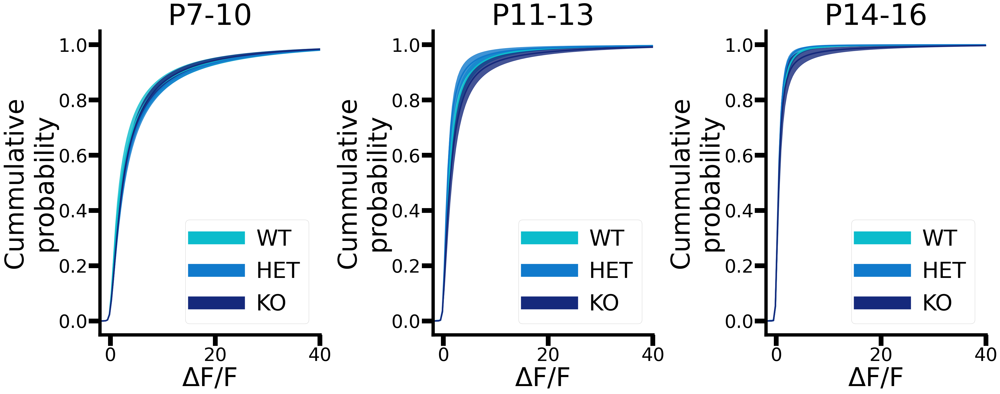

In [138]:
# dF/F Cumulative probability plot
df_t = df[df['sex']=='Female']

plt.figure(figsize=(50,15))
PdA.cum_sum(df_t, 'cumulative_1_percentile_dF_F', genotypes=['WT','HET','KO'],color=[color1,color2,color3],ages=[7,8,9,10],sp_number=1,x_lim=40,title='P7-10',vertical_line=False, vertical_line_val=2)
PdA.cum_sum(df_t, 'cumulative_1_percentile_dF_F', genotypes=['WT','HET','KO'],color=[color1,color2,color3],ages=[11,12,13],sp_number=2,x_lim=40,title='P11-13',vertical_line=False, vertical_line_val=2)
PdA.cum_sum(df_t, 'cumulative_1_percentile_dF_F', genotypes=['WT','HET','KO'],color=[color1,color2,color3],ages=[14,15,16],sp_number=3,x_lim=40,title='P14-16',vertical_line=False, vertical_line_val=2)

#Run kolmogorov-smirnov test between genotypes
df_7_10 = df_t[(df_t['age'] <10)]
#Store all cummulative_1_percentile_dF_F values in a different array for each genotype
WT_7_10 = np.vstack(df_7_10[df_7_10['genotype'] == 'WT']['cumulative_1_percentile_dF_F'])#.values
HET_7_10 = np.vstack(df_7_10[df_7_10['genotype'] == 'HET']['cumulative_1_percentile_dF_F'])#.values
KO_7_10 = np.vstack(df_7_10[df_7_10['genotype'] == 'KO']['cumulative_1_percentile_dF_F'])#.values
#Run KS test
print('At P7-10, KS test between WT and HET: ' + str(stats.ks_2samp(np.reshape(WT_7_10,(WT_7_10.size)),np.reshape(HET_7_10,(HET_7_10.size)))))
print('At P7-10, KS test between WT and KO: ' + str(stats.ks_2samp(np.reshape(WT_7_10,(WT_7_10.size)),np.reshape(KO_7_10,(KO_7_10.size)))))
print('At P7-10, KS test between HET and KO: ' + str(stats.ks_2samp(np.reshape(HET_7_10,(HET_7_10.size)),np.reshape(KO_7_10,(KO_7_10.size)))))

df_11_14 = df_t[(df_t['age'] >= 11) & (df_t['age'] <14)] 
#Store all cummulative_1_percentile_dF_F values in a different array for each genotype
WT_11_14 = np.vstack(df_11_14[df_11_14['genotype'] == 'WT']['cumulative_1_percentile_dF_F'])#.values
HET_11_14 = np.vstack(df_11_14[df_11_14['genotype'] == 'HET']['cumulative_1_percentile_dF_F'])#.values
KO_11_14 = np.vstack(df_11_14[df_11_14['genotype'] == 'KO']['cumulative_1_percentile_dF_F'])#.values
#Run KS test
print('At P11-14, KS test between WT and HET: ' + str(stats.ks_2samp(np.reshape(WT_11_14,(WT_11_14.size)),np.reshape(HET_11_14,(HET_11_14.size)))))
print('At P11-14, KS test between WT and KO: ' + str(stats.ks_2samp(np.reshape(WT_11_14,(WT_11_14.size)),np.reshape(KO_11_14,(KO_11_14.size)))))
print('At P11-14, KS test between HET and KO: ' + str(stats.ks_2samp(np.reshape(HET_11_14,(HET_11_14.size)),np.reshape(KO_11_14,(KO_11_14.size)))))

df_15_16 = df_t[(df_t['age'] >= 15)]
#Store all cummulative_1_percentile_dF_F values in a different array for each genotype
WT_15_16 = np.vstack(df_15_16[df_15_16['genotype'] == 'WT']['cumulative_1_percentile_dF_F'])#.values
HET_15_16 = np.vstack(df_15_16[df_15_16['genotype'] == 'HET']['cumulative_1_percentile_dF_F'])#.values
KO_15_16 = np.vstack(df_15_16[df_15_16['genotype'] == 'KO']['cumulative_1_percentile_dF_F'])#.values
#Run KS test
print('At P15-16, KS test between WT and HET: ' + str(stats.ks_2samp(np.reshape(WT_15_16,(WT_15_16.size)),np.reshape(HET_15_16,(HET_15_16.size)))))
print('At P15-16, KS test between WT and KO: ' + str(stats.ks_2samp(np.reshape(WT_15_16,(WT_15_16.size)),np.reshape(KO_15_16,(KO_15_16.size)))))
print('At P15-16, KS test between HET and KO: ' + str(stats.ks_2samp(np.reshape(HET_15_16,(HET_15_16.size)),np.reshape(KO_15_16,(KO_15_16.size)))))


#plt.savefig(Save_path + 'SERTKO_Cumulative_1_percentile_dF_F.png', dpi=300, bbox_inches='tight')
plt.savefig(Save_path + 'Female_SERTKO_Cumulative_1_percentile_dF_F.svg', dpi=300, bbox_inches='tight')

### SSRI

At P7-10, KS test between Sucrose and Fluoxetine: KstestResult(statistic=0.0408949509452022, pvalue=0.015580784331242213, statistic_location=2.7604548058930445, statistic_sign=-1)
At P11-13, KS test between Sucrose and Fluoxetine: KstestResult(statistic=0.1031224498561182, pvalue=2.332573648872046e-14, statistic_location=2.7638888888888866, statistic_sign=1)
At P14-16, KS test between Sucrose and Fluoxetine: KstestResult(statistic=0.14505563531945442, pvalue=1.0135406461024064e-27, statistic_location=2.763888813840317, statistic_sign=1)


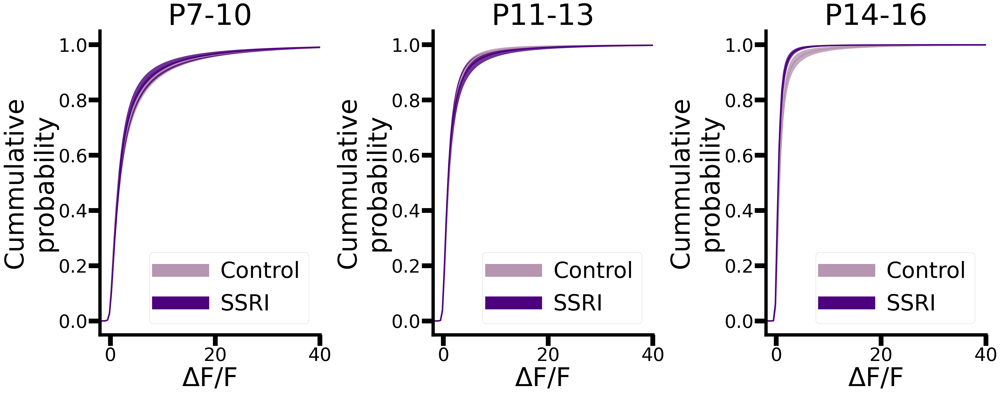

In [139]:
# dF/F Cumulative probability plot
df_t = df[df['sex']=='Male']

plt.figure(figsize=(50,15))
PdA.cum_sum(df_t, 'cumulative_1_percentile_dF_F', genotypes=['Control','SSRI'],color=[color4,color5],ages=[7,8,9,10],sp_number=1,x_lim=40,title='P7-10',vertical_line=False, vertical_line_val=2)
PdA.cum_sum(df_t, 'cumulative_1_percentile_dF_F', genotypes=['Control','SSRI'],color=[color4,color5],ages=[11,12,13],sp_number=2,x_lim=40,title='P11-13',vertical_line=False, vertical_line_val=2)
PdA.cum_sum(df_t, 'cumulative_1_percentile_dF_F', genotypes=['Control','SSRI'],color=[color4,color5],ages=[14,15,16],sp_number=3,x_lim=40,title='P14-16',vertical_line=False, vertical_line_val=2)

#Run kolmogorov-smirnov test between genotypes
df_7_10 = df_t[(df_t['age'] <10)]
#Store all cummulative_1_percentile_dF_F values in a different array for each genotype
Control_7_10 = np.vstack(df_7_10[df_7_10['genotype'] == 'Control']['cumulative_1_percentile_dF_F'])#.values
SSRI_7_10 = np.vstack(df_7_10[df_7_10['genotype'] == 'SSRI']['cumulative_1_percentile_dF_F'])#.values
#Run KS test
print('At P7-10, KS test between Sucrose and Fluoxetine: ' + str(stats.ks_2samp(np.reshape(Control_7_10,(Control_7_10.size)),np.reshape(SSRI_7_10,(SSRI_7_10.size)))))


df_11_14 = df_t[(df_t['age'] >= 11) & (df_t['age'] <14)] 
#Store all cummulative_1_percentile_dF_F values in a different array for each genotype
Control_7_10 = np.vstack(df_11_14[df_11_14['genotype'] == 'Control']['cumulative_1_percentile_dF_F'])#.values
SSRI_7_10 = np.vstack(df_11_14[df_11_14['genotype'] == 'SSRI']['cumulative_1_percentile_dF_F'])#.values
#Run KS test
print('At P11-13, KS test between Sucrose and Fluoxetine: ' + str(stats.ks_2samp(np.reshape(Control_7_10,(Control_7_10.size)),np.reshape(SSRI_7_10,(SSRI_7_10.size)))))

df_14_16 = df_t[(df_t['age'] >= 14)]
#Store all cummulative_1_percentile_dF_F values in a different array for each genotype
Control_7_10 = np.vstack(df_14_16[df_14_16['genotype'] == 'Control']['cumulative_1_percentile_dF_F'])#.values
SSRI_7_10 = np.vstack(df_14_16[df_14_16['genotype'] == 'SSRI']['cumulative_1_percentile_dF_F'])#.values
#Run KS test
print('At P14-16, KS test between Sucrose and Fluoxetine: ' + str(stats.ks_2samp(np.reshape(Control_7_10,(Control_7_10.size)),np.reshape(SSRI_7_10,(SSRI_7_10.size)))))


#plt.savefig(Save_path + 'SSRI_Cumulative_1_percentile_dF_F.png', dpi=300, bbox_inches='tight')
plt.savefig(Save_path + 'Male_SSRI_Cumulative_1_percentile_dF_F.svg', dpi=300, bbox_inches='tight')

At P7-10, KS test between Sucrose and Fluoxetine: KstestResult(statistic=0.10036292573981016, pvalue=2.034563003287555e-09, statistic_location=2.741001275808209, statistic_sign=1)
At P11-13, KS test between Sucrose and Fluoxetine: KstestResult(statistic=0.11155778894472362, pvalue=1.3696923497536994e-16, statistic_location=2.7636457498785756, statistic_sign=-1)
At P14-16, KS test between Sucrose and Fluoxetine: KstestResult(statistic=0.3144964589027006, pvalue=2.9147299371461147e-161, statistic_location=2.762577996721123, statistic_sign=-1)


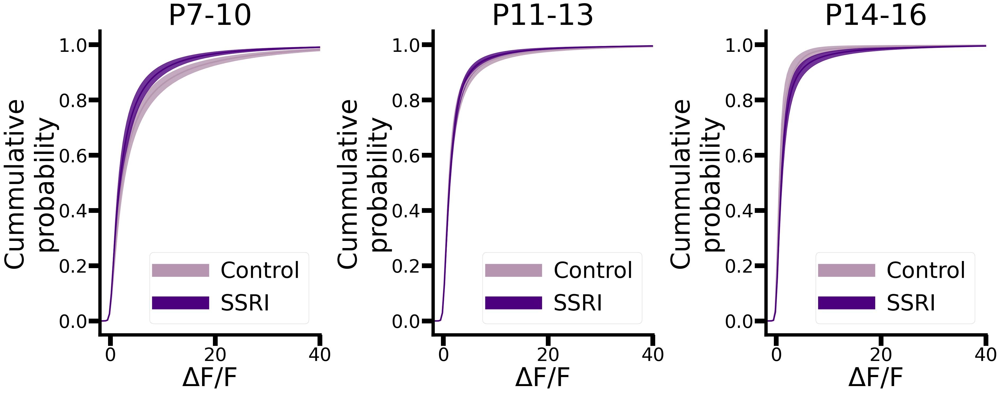

In [140]:
# dF/F Cumulative probability plot
df_t = df[df['sex']=='Female']

plt.figure(figsize=(50,15))
PdA.cum_sum(df_t, 'cumulative_1_percentile_dF_F', genotypes=['Control','SSRI'],color=[color4,color5],ages=[7,8,9,10],sp_number=1,x_lim=40,title='P7-10',vertical_line=False, vertical_line_val=2)
PdA.cum_sum(df_t, 'cumulative_1_percentile_dF_F', genotypes=['Control','SSRI'],color=[color4,color5],ages=[11,12,13],sp_number=2,x_lim=40,title='P11-13',vertical_line=False, vertical_line_val=2)
PdA.cum_sum(df_t, 'cumulative_1_percentile_dF_F', genotypes=['Control','SSRI'],color=[color4,color5],ages=[14,15,16],sp_number=3,x_lim=40,title='P14-16',vertical_line=False, vertical_line_val=2)

#Run kolmogorov-smirnov test between genotypes
df_7_10 = df_t[(df_t['age'] <10)]
#Store all cummulative_1_percentile_dF_F values in a different array for each genotype
Control_7_10 = np.vstack(df_7_10[df_7_10['genotype'] == 'Control']['cumulative_1_percentile_dF_F'])#.values
SSRI_7_10 = np.vstack(df_7_10[df_7_10['genotype'] == 'SSRI']['cumulative_1_percentile_dF_F'])#.values
#Run KS test
print('At P7-10, KS test between Sucrose and Fluoxetine: ' + str(stats.ks_2samp(np.reshape(Control_7_10,(Control_7_10.size)),np.reshape(SSRI_7_10,(SSRI_7_10.size)))))


df_11_14 = df_t[(df_t['age'] >= 11) & (df_t['age'] <14)] 
#Store all cummulative_1_percentile_dF_F values in a different array for each genotype
Control_7_10 = np.vstack(df_11_14[df_11_14['genotype'] == 'Control']['cumulative_1_percentile_dF_F'])#.values
SSRI_7_10 = np.vstack(df_11_14[df_11_14['genotype'] == 'SSRI']['cumulative_1_percentile_dF_F'])#.values
#Run KS test
print('At P11-13, KS test between Sucrose and Fluoxetine: ' + str(stats.ks_2samp(np.reshape(Control_7_10,(Control_7_10.size)),np.reshape(SSRI_7_10,(SSRI_7_10.size)))))

df_14_16 = df_t[(df_t['age'] >= 14)]
#Store all cummulative_1_percentile_dF_F values in a different array for each genotype
Control_7_10 = np.vstack(df_14_16[df_14_16['genotype'] == 'Control']['cumulative_1_percentile_dF_F'])#.values
SSRI_7_10 = np.vstack(df_14_16[df_14_16['genotype'] == 'SSRI']['cumulative_1_percentile_dF_F'])#.values
#Run KS test
print('At P14-16, KS test between Sucrose and Fluoxetine: ' + str(stats.ks_2samp(np.reshape(Control_7_10,(Control_7_10.size)),np.reshape(SSRI_7_10,(SSRI_7_10.size)))))


#plt.savefig(Save_path + 'SSRI_Cumulative_1_percentile_dF_F.png', dpi=300, bbox_inches='tight')
plt.savefig(Save_path + 'Female_SSRI_Cumulative_1_percentile_dF_F.svg', dpi=300, bbox_inches='tight')

## Correlation

In [50]:
#To account for correlations in the edge introducing noise, crop
#Make new colomn with cropped traces
df['Correlations_distance_cropped'] = None
for i, row in df.iterrows():
    try:
        df.at[i,'Correlations_distance_cropped'] = np.array(row['Correlations_distance'][:10])
    except:
        pass

### SERTKO

C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\2823003892.py:6: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for leg in leg.legendHandles:
C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\2823003892.py:17: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for leg in leg.legendHandles:


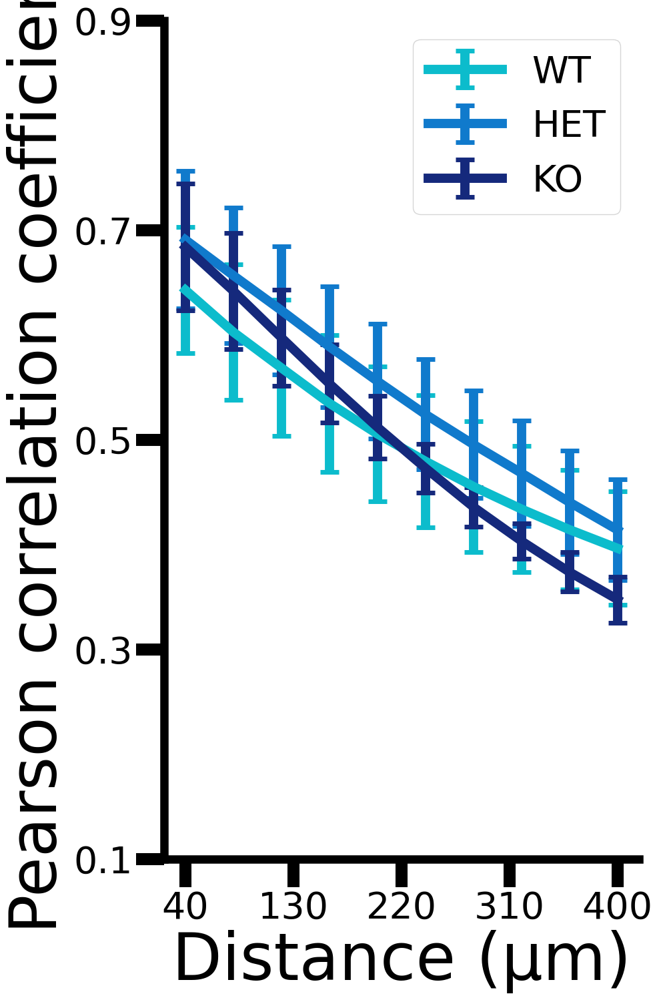

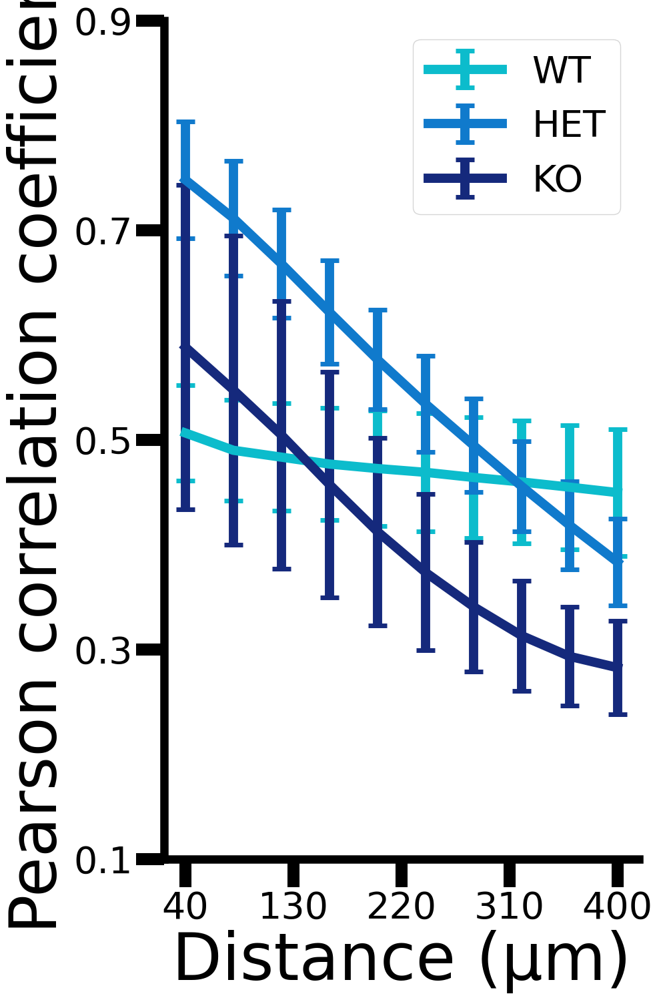

In [141]:
df_t = df[df['sex']=='Male']
plt.figure(figsize=(10,15))
PdA.Corr_distance_plot(df_t,parameter='Correlations_distance_cropped', genotypes=['WT','HET','KO'], ages=[9], color = [color1,color2,color3],title = None,sp_row=1,sp_colomn=1,sp_number=1)
plt.ylim([0.1,0.85])
leg = plt.legend(['WT','HET','KO','Sucrose','Fluoxetine'],fontsize=40)
for leg in leg.legendHandles:
    leg.set_linewidth(10.0)
#Set xticks from 0 to 10 as 40 to 400
plt.xticks(np.linspace(0,9,5),np.linspace(40,400,5).astype(int),fontsize=40)
plt.yticks(np.arange(0.1,1,0.2),fontsize=40)
#Savefig
#plt.savefig(Save_path + 'P9_Correlations_distance_with_SERTKO.svg',bbox_inches='tight',dpi=300)
plt.figure(figsize=(10,15))
PdA.Corr_distance_plot(df_t,parameter='Correlations_distance_cropped', genotypes=['WT','HET','KO'], ages=[8], color = [color1,color2,color3],title = None,sp_row=1,sp_colomn=1,sp_number=1)
plt.ylim([0.1,0.85])
leg = plt.legend(['WT','HET','KO','Sucrose','Fluoxetine'],fontsize=40)
for leg in leg.legendHandles:
    leg.set_linewidth(10.0)
#Set xticks from 0 to 10 as 40 to 400
plt.xticks(np.linspace(0,9,5),np.linspace(40,400,5).astype(int),fontsize=40)
plt.yticks(np.arange(0.1,1,0.2),fontsize=40)
#Savefig
plt.savefig(Save_path + 'Male_P8_Correlations_distance_with_SERTKO.svg',bbox_inches='tight',dpi=300)

C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\414455972.py:6: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for leg in leg.legendHandles:
C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\414455972.py:17: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for leg in leg.legendHandles:


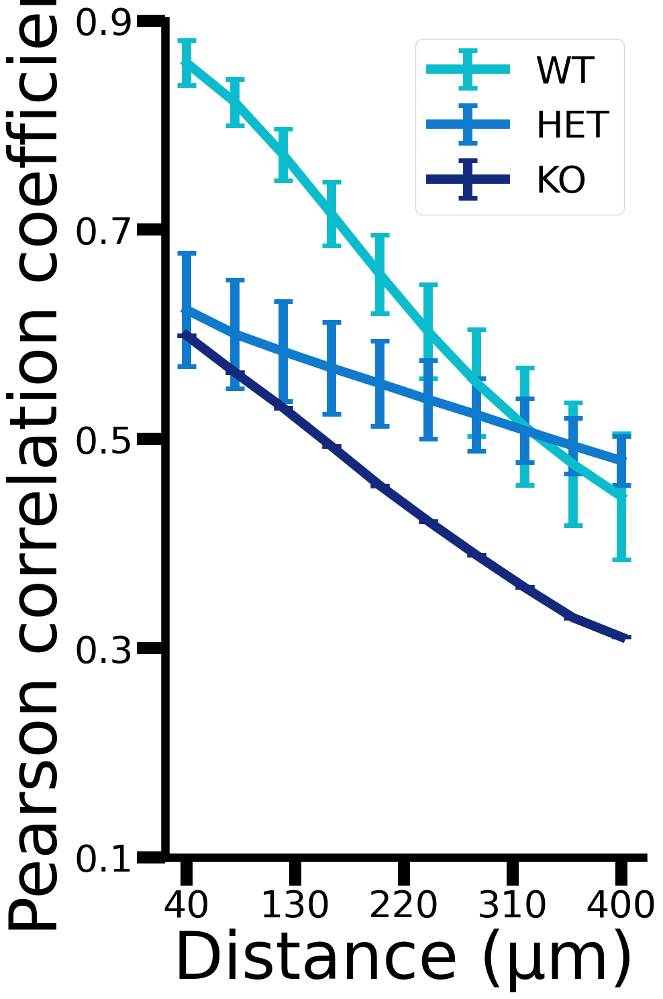

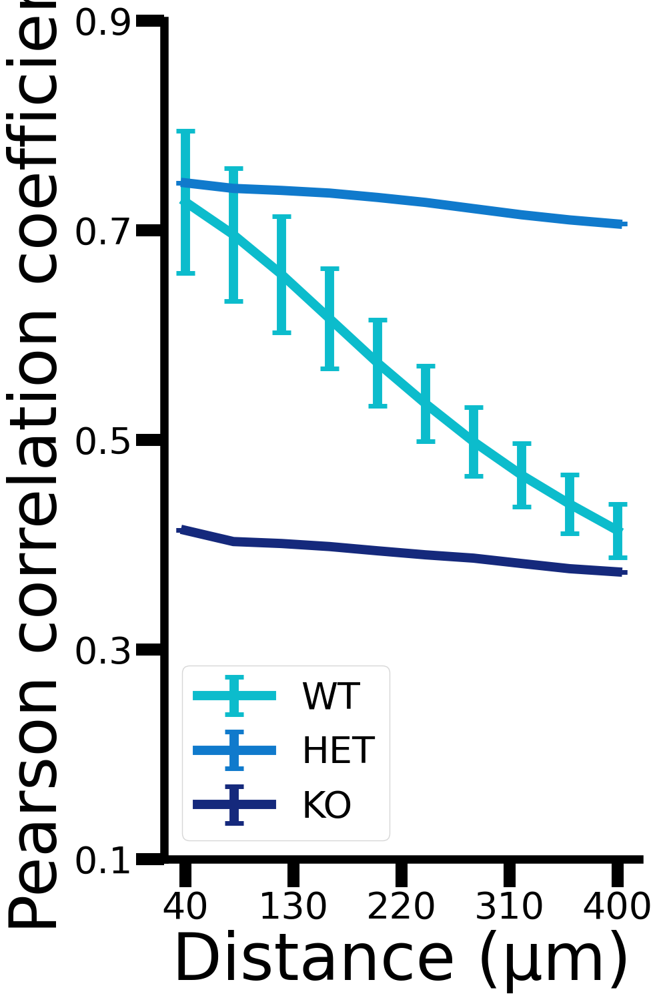

In [142]:
df_t = df[df['sex']=='Female']
plt.figure(figsize=(10,15))
PdA.Corr_distance_plot(df_t,parameter='Correlations_distance_cropped', genotypes=['WT','HET','KO'], ages=[9], color = [color1,color2,color3],title = None,sp_row=1,sp_colomn=1,sp_number=1)
plt.ylim([0.1,0.85])
leg = plt.legend(['WT','HET','KO','Sucrose','Fluoxetine'],fontsize=40)
for leg in leg.legendHandles:
    leg.set_linewidth(10.0)
#Set xticks from 0 to 10 as 40 to 400
plt.xticks(np.linspace(0,9,5),np.linspace(40,400,5).astype(int),fontsize=40)
plt.yticks(np.arange(0.1,1,0.2),fontsize=40)
#Savefig
#plt.savefig(Save_path + 'P9_Correlations_distance_with_SERTKO.svg',bbox_inches='tight',dpi=300)
plt.figure(figsize=(10,15))
PdA.Corr_distance_plot(df_t,parameter='Correlations_distance_cropped', genotypes=['WT','HET','KO'], ages=[8], color = [color1,color2,color3],title = None,sp_row=1,sp_colomn=1,sp_number=1)
plt.ylim([0.1,0.85])
leg = plt.legend(['WT','HET','KO','Sucrose','Fluoxetine'],fontsize=40)
for leg in leg.legendHandles:
    leg.set_linewidth(10.0)
#Set xticks from 0 to 10 as 40 to 400
plt.xticks(np.linspace(0,9,5),np.linspace(40,400,5).astype(int),fontsize=40)
plt.yticks(np.arange(0.1,1,0.2),fontsize=40)
#Savefig
plt.savefig(Save_path + 'Female_P8_Correlations_distance_with_SERTKO.svg',bbox_inches='tight',dpi=300)

### SSRI

C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\2136504768.py:6: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for leg in leg.legendHandles:
C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\2136504768.py:17: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for leg in leg.legendHandles:


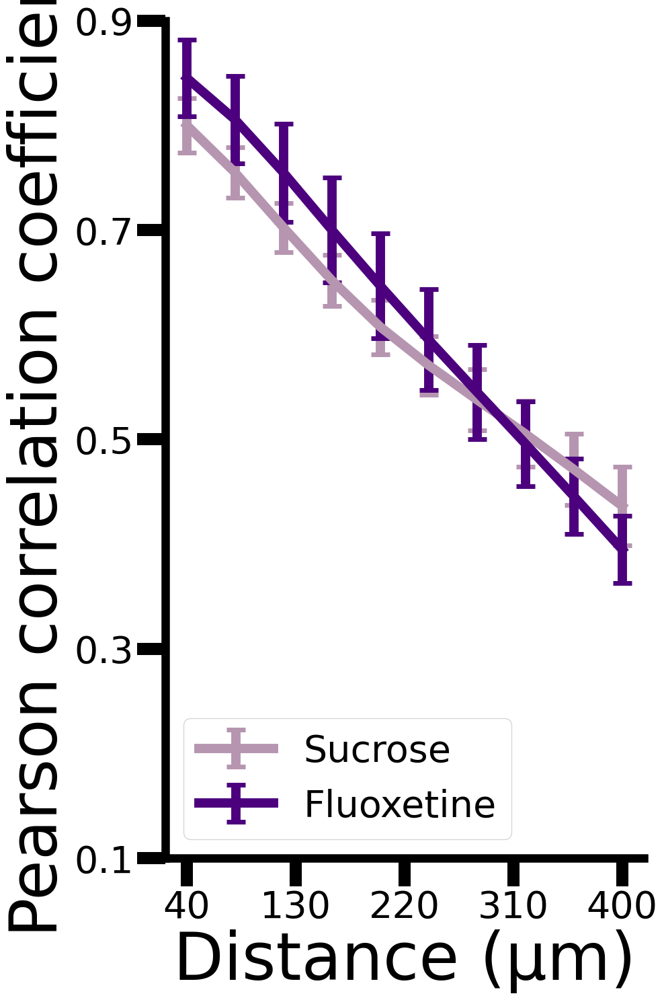

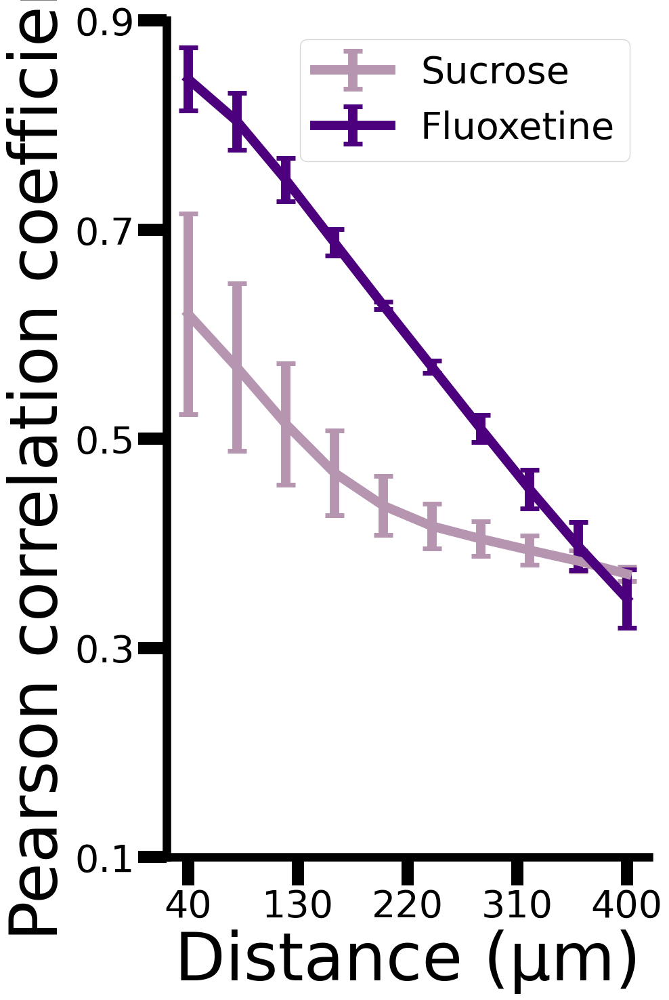

In [143]:
df_t = df[df['sex']=='Male']
plt.figure(figsize=(10,15))
PdA.Corr_distance_plot(df_t,parameter='Correlations_distance_cropped', genotypes=['Control','SSRI'], ages=[9], color = [color4,color5],title = None,sp_row=1,sp_colomn=1,sp_number=1)
plt.ylim([0.1,0.85])
leg = plt.legend(['Sucrose','Fluoxetine'],fontsize=40)
for leg in leg.legendHandles:
    leg.set_linewidth(10.0)
#Set xticks from 0 to 10 as 40 to 400
plt.xticks(np.linspace(0,9,5),np.linspace(40,400,5).astype(int),fontsize=40)
plt.yticks(np.arange(0.1,1,0.2),fontsize=40)
#Savefig
#plt.savefig(Save_path + 'P9_Correlations_distance.svg',bbox_inches='tight',dpi=300)
plt.figure(figsize=(10,15))
PdA.Corr_distance_plot(df_t,parameter='Correlations_distance_cropped', genotypes=['Control','SSRI'], ages=[8], color = [color4,color5],title = None,sp_row=1,sp_colomn=1,sp_number=1)
plt.ylim([0.1,0.85])
leg = plt.legend(['Sucrose','Fluoxetine'],fontsize=40)
for leg in leg.legendHandles:
    leg.set_linewidth(10.0)
#Set xticks from 0 to 10 as 40 to 400
plt.xticks(np.linspace(0,9,5),np.linspace(40,400,5).astype(int),fontsize=40)
plt.yticks(np.arange(0.1,1,0.2),fontsize=40)
#Savefig
plt.savefig(Save_path + 'Male_SSRI_P8_Correlations_distance.svg',bbox_inches='tight',dpi=300)


C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\2516839124.py:6: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for leg in leg.legendHandles:
C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\2516839124.py:17: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for leg in leg.legendHandles:


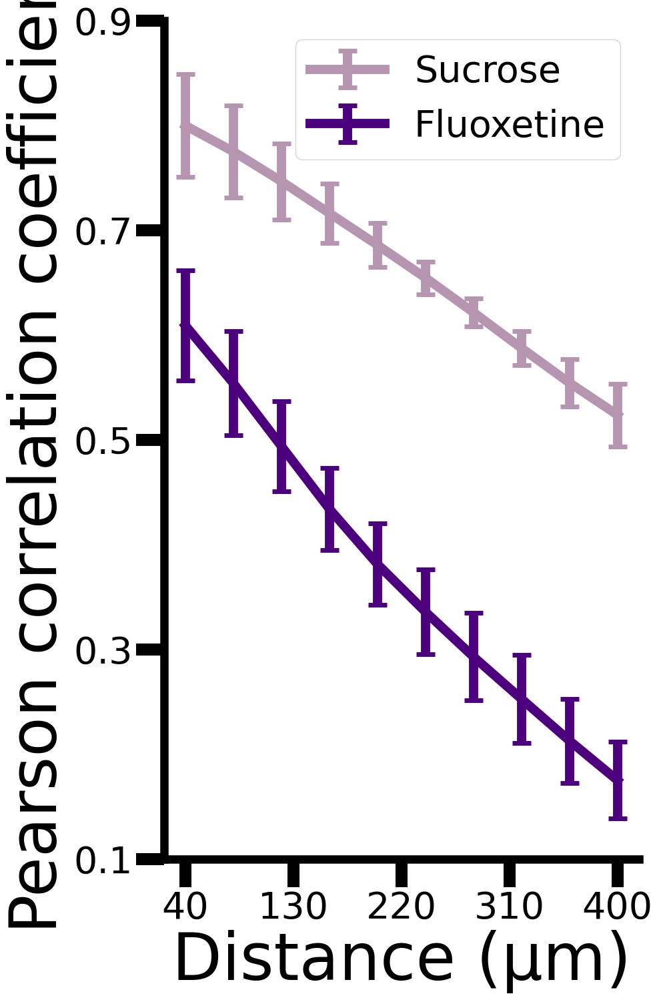

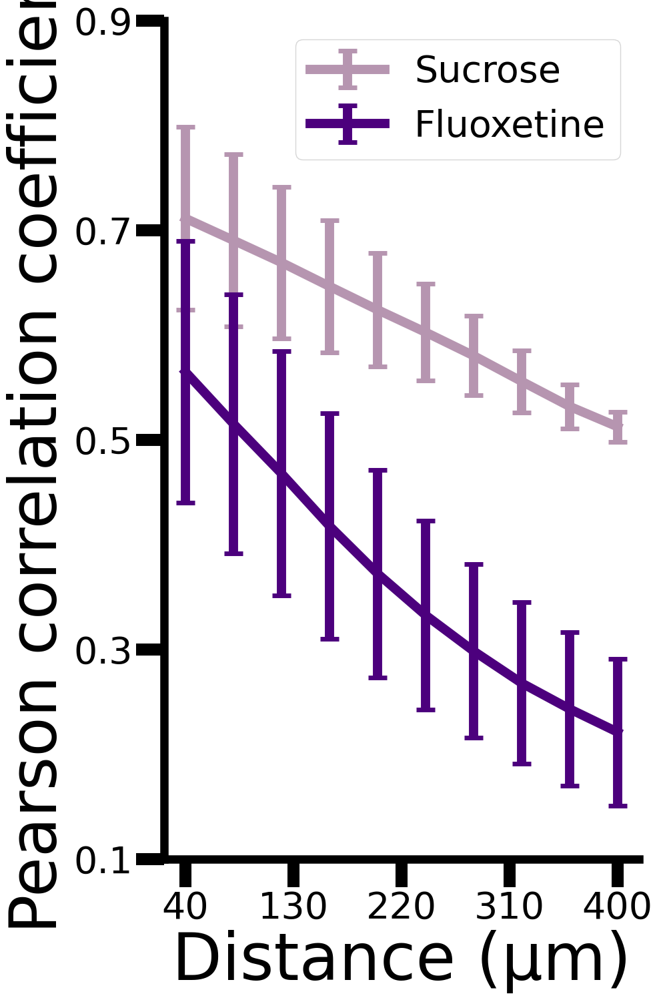

In [144]:
df_t = df[df['sex']=='Female']
plt.figure(figsize=(10,15))
PdA.Corr_distance_plot(df_t,parameter='Correlations_distance_cropped', genotypes=['Control','SSRI'], ages=[9], color = [color4,color5],title = None,sp_row=1,sp_colomn=1,sp_number=1)
plt.ylim([0.1,0.85])
leg = plt.legend(['Sucrose','Fluoxetine'],fontsize=40)
for leg in leg.legendHandles:
    leg.set_linewidth(10.0)
#Set xticks from 0 to 10 as 40 to 400
plt.xticks(np.linspace(0,9,5),np.linspace(40,400,5).astype(int),fontsize=40)
plt.yticks(np.arange(0.1,1,0.2),fontsize=40)
#Savefig
#plt.savefig(Save_path + 'P9_Correlations_distance.svg',bbox_inches='tight',dpi=300)
plt.figure(figsize=(10,15))
PdA.Corr_distance_plot(df_t,parameter='Correlations_distance_cropped', genotypes=['Control','SSRI'], ages=[8], color = [color4,color5],title = None,sp_row=1,sp_colomn=1,sp_number=1)
plt.ylim([0.1,0.85])
leg = plt.legend(['Sucrose','Fluoxetine'],fontsize=40)
for leg in leg.legendHandles:
    leg.set_linewidth(10.0)
#Set xticks from 0 to 10 as 40 to 400
plt.xticks(np.linspace(0,9,5),np.linspace(40,400,5).astype(int),fontsize=40)
plt.yticks(np.arange(0.1,1,0.2),fontsize=40)
#Savefig
plt.savefig(Save_path + 'Female_SSRI_P8_Correlations_distance.svg',bbox_inches='tight',dpi=300)


## GRAB

In [400]:
path = '//qnap-amp001.dpag.ox.ac.uk/gsantero/Data/'
dates = ['2023-07-15']
animals = ['440','441','442','443','444']
recordings = ['t-002']
channel = 'Sound_in'
plt.figure(figsize=(20,20))
PeriStim = np.zeros((3,len(animals)+1,10,1050))
for i in range(3):
    if i == 1:
        channel = 'Whisker_in'
    elif i == 2:
        recordings = ['t-003']
    for animal in animals:
        for date in dates:
            for recording in recordings:
                grab = GRAB.GRAB_dataload(path + date + '/' + date + '_' + 'GOS' + animal + '_' +recording , detrend_both=False, detrend_CH2=False, only_CH3=True)
                paq = CaaN.paq_read_function(path + date + '/' + date + '_' + 'GOS' + animal + '_' + recording.replace('-','_') + '.paq')
                Meta = CaaN.paq_extract(paq, channel_to_Extract = channel)#'Sound_in'
                PeriStim[i,animals.index(animal),:,:] = GRAB.PeriStimFrames(grab,Meta,minus_fr=5,plus_fr=30,hz=30) # 30.49
                #plt.plot(np.nanmean(PeriStim,0),label=animal,lw=3)
    #plt.legend(fontsize=20)
    #plt.plot([60,60],[-0.01,0.015],'k--',lw=3)
    #plt.ylabel('ΔF/F',fontsize=20)
    #plt.xlabel('# Frames (30Hz)',fontsize=20)
    #plt.ylim([-0.02,0.02])

    date = '2023-04-20'
    animal = '391'

    grab = GRAB.GRAB_dataload(path + date + '/' + date + '_' + 'GOS' + animal + '_' +recording , detrend_both=False, detrend_CH2=False, only_CH3=True)
    paq = CaaN.paq_read_function(path + date + '/' + date + '_' + 'GOS' + animal + '_' + recording.replace('-','_') + '.paq')
    Meta = CaaN.paq_extract(paq, channel_to_Extract = channel)#'Sound_in'
    PeriStim[i,-1,:,:] = GRAB.PeriStimFrames(grab,Meta,minus_fr=5,plus_fr=30,hz=30)

<Figure size 2000x2000 with 0 Axes>

In [56]:
import scipy.signal as signal


C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\305685236.py:3: RuntimeWarning: Mean of empty slice
  PeriStim_nor = PeriStim[:,[0,1,3,4]] - np.nanmean(PeriStim[:,[0,1,3,4],:,:150],axis=(3)).reshape(3,3+1,10,1)


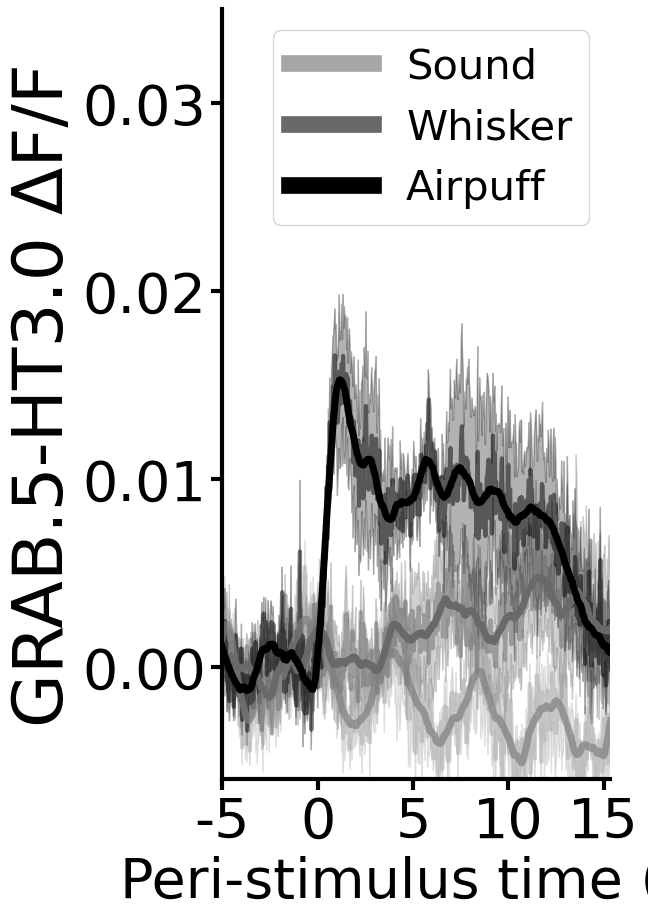

In [161]:
#Plot whisker, airruff and sound together
plt.figure(figsize=(5,10))
PeriStim_nor = PeriStim[:,[0,1,3,4]] - np.nanmean(PeriStim[:,[0,1,3,4],:,:150],axis=(3)).reshape(3,3+1,10,1)
plt.plot(np.nanmean(PeriStim_nor[0],(0,1)),color='darkgrey',lw=3, alpha=0.5)
plt.plot(np.nanmean(PeriStim_nor[1],(0,1)),color='dimgrey',lw=3, alpha=0.5)
plt.plot(np.nanmean(PeriStim_nor[2],(0,1)),color='k',lw=3, alpha=0.5)
#Plot shaded S.E.M
plt.fill_between(np.arange(1050),np.nanmean(PeriStim_nor[0],(0,1))-np.nanstd(np.nanmean(PeriStim_nor[0],1),0)/np.sqrt(len(animals)),np.nanmean(PeriStim_nor[0],(0,1))+np.nanstd(np.nanmean(PeriStim_nor[0],1),0)/np.sqrt(len(animals)),color='darkgrey',alpha=0.3)
plt.fill_between(np.arange(1050),np.nanmean(PeriStim_nor[1],(0,1))-np.nanstd(np.nanmean(PeriStim_nor[1],1),0)/np.sqrt(len(animals)),np.nanmean(PeriStim_nor[1],(0,1))+np.nanstd(np.nanmean(PeriStim_nor[1],1),0)/np.sqrt(len(animals)),color='dimgrey',alpha=0.3)
plt.fill_between(np.arange(1050),np.nanmean(PeriStim_nor[2],(0,1))-np.nanstd(np.nanmean(PeriStim_nor[2],1),0)/np.sqrt(len(animals)),np.nanmean(PeriStim_nor[2],(0,1))+np.nanstd(np.nanmean(PeriStim_nor[2],1),0)/np.sqrt(len(animals)),color='k',alpha=0.3)
#Plot savgol filtered signal
plt.plot(signal.savgol_filter(np.nanmean(PeriStim_nor[0],(0,1)),51,3),color='grey',alpha = 0.7, lw=5, label = 'Sound')
plt.plot(signal.savgol_filter(np.nanmean(PeriStim_nor[1],(0,1)),51,3),color='dimgrey',lw=5, label = 'Whisker')
plt.plot(signal.savgol_filter(np.nanmean(PeriStim_nor[2],(0,1)),51,3),color='k',lw=5, label = 'Airpuff')
#Vertical line in 60 from min to max
#plt.plot([60,60],[np.min(np.nanmean(PeriStim_nor,(0,1))),np.max(np.nanmean(PeriStim_nor,(0,1)))],'k--',lw=3)
#Remove top and right axis
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#make axis lines and ticks thicker
ax.spines['left'].set_linewidth(3.0)
ax.spines['bottom'].set_linewidth(3.0)
ax.tick_params(width=3.0,length=8.0)
#Set xticks from -2 s to 20 s, every 2 given a framerate of 30Hz
plt.xticks(np.arange(0,632,150),np.arange(-5,16,5),fontsize=40)#plt.xticks(np.arange(0,510,60),np.arange(-2,15,2),fontsize=20)
plt.xlim([0,610])
plt.ylim([-0.006,0.035])
plt.yticks(np.arange(0,0.031, 0.01),fontsize=40)
plt.ylabel('GRAB.5-HT3.0 ΔF/F',fontsize=50)
plt.xlabel('Peri-stimulus time (s)',fontsize=40)
leg = plt.legend(fontsize=30)
for line in leg.get_lines():
    line.set_linewidth(12.0)
plt.savefig(Save_path + 'Male_P_7_10_AllStims.svg',bbox_inches='tight',format='svg',dpi=300)

C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\3330551018.py:3: RuntimeWarning: Mean of empty slice
  PeriStim_nor = PeriStim[:,[2,5]] - np.nanmean(PeriStim[:,[2,5],:,:150],axis=(3)).reshape(3,1+1,10,1)


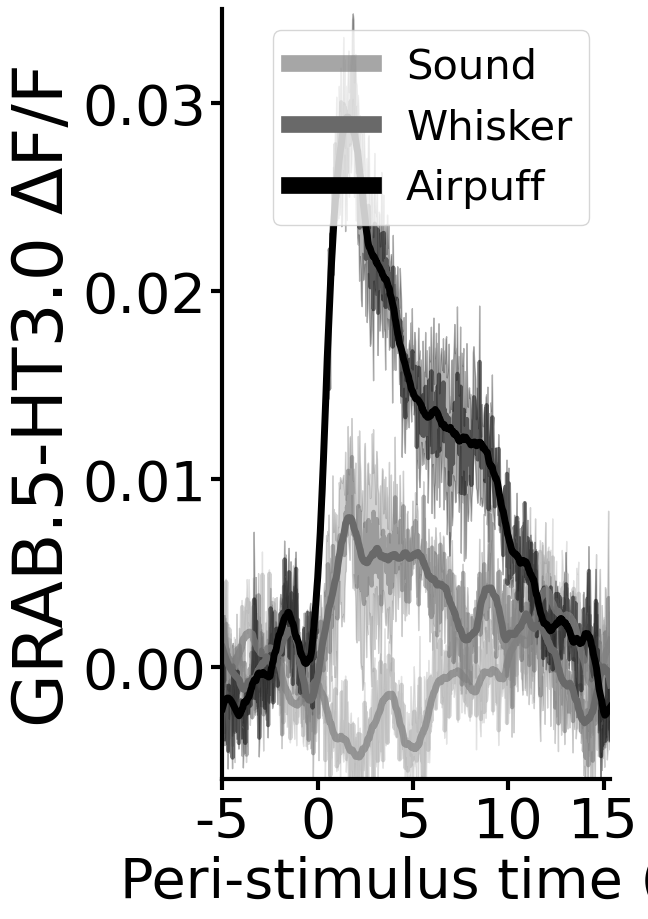

In [160]:
#Plot whisker, airruff and sound together
plt.figure(figsize=(5,10))
PeriStim_nor = PeriStim[:,[2,5]] - np.nanmean(PeriStim[:,[2,5],:,:150],axis=(3)).reshape(3,1+1,10,1)
plt.plot(np.nanmean(PeriStim_nor[0],(0,1)),color='darkgrey',lw=3, alpha=0.5)
plt.plot(np.nanmean(PeriStim_nor[1],(0,1)),color='dimgrey',lw=3, alpha=0.5)
plt.plot(np.nanmean(PeriStim_nor[2],(0,1)),color='k',lw=3, alpha=0.5)
#Plot shaded S.E.M
plt.fill_between(np.arange(1050),np.nanmean(PeriStim_nor[0],(0,1))-np.nanstd(np.nanmean(PeriStim_nor[0],1),0)/np.sqrt(len(animals)),np.nanmean(PeriStim_nor[0],(0,1))+np.nanstd(np.nanmean(PeriStim_nor[0],1),0)/np.sqrt(len(animals)),color='darkgrey',alpha=0.3)
plt.fill_between(np.arange(1050),np.nanmean(PeriStim_nor[1],(0,1))-np.nanstd(np.nanmean(PeriStim_nor[1],1),0)/np.sqrt(len(animals)),np.nanmean(PeriStim_nor[1],(0,1))+np.nanstd(np.nanmean(PeriStim_nor[1],1),0)/np.sqrt(len(animals)),color='dimgrey',alpha=0.3)
plt.fill_between(np.arange(1050),np.nanmean(PeriStim_nor[2],(0,1))-np.nanstd(np.nanmean(PeriStim_nor[2],1),0)/np.sqrt(len(animals)),np.nanmean(PeriStim_nor[2],(0,1))+np.nanstd(np.nanmean(PeriStim_nor[2],1),0)/np.sqrt(len(animals)),color='k',alpha=0.3)
#Plot savgol filtered signal
plt.plot(signal.savgol_filter(np.nanmean(PeriStim_nor[0],(0,1)),51,3),color='grey',alpha = 0.7, lw=5, label = 'Sound')
plt.plot(signal.savgol_filter(np.nanmean(PeriStim_nor[1],(0,1)),51,3),color='dimgrey',lw=5, label = 'Whisker')
plt.plot(signal.savgol_filter(np.nanmean(PeriStim_nor[2],(0,1)),51,3),color='k',lw=5, label = 'Airpuff')
#Vertical line in 60 from min to max
#plt.plot([60,60],[np.min(np.nanmean(PeriStim_nor,(0,1))),np.max(np.nanmean(PeriStim_nor,(0,1)))],'k--',lw=3)
#Remove top and right axis
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#make axis lines and ticks thicker
ax.spines['left'].set_linewidth(3.0)
ax.spines['bottom'].set_linewidth(3.0)
ax.tick_params(width=3.0,length=8.0)
#Set xticks from -2 s to 20 s, every 2 given a framerate of 30Hz
plt.xticks(np.arange(0,632,150),np.arange(-5,16,5),fontsize=40)#plt.xticks(np.arange(0,510,60),np.arange(-2,15,2),fontsize=20)
plt.xlim([0,610])
plt.ylim([-0.006,0.035])
plt.yticks(np.arange(0,0.031, 0.01),fontsize=40)
plt.ylabel('GRAB.5-HT3.0 ΔF/F',fontsize=50)
plt.xlabel('Peri-stimulus time (s)',fontsize=40)
leg = plt.legend(fontsize=30)
for line in leg.get_lines():
    line.set_linewidth(12.0)
plt.savefig(Save_path + 'Female_P_7_10_AllStims.svg',bbox_inches='tight',format='svg',dpi=300)

C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\1325651767.py:3: RuntimeWarning: Mean of empty slice
  PeriStim_nor = PeriStim[:,[1,5]] - np.nanmean(PeriStim[:,[1,5],:,:150],axis=(3)).reshape(3,1+1,10,1)


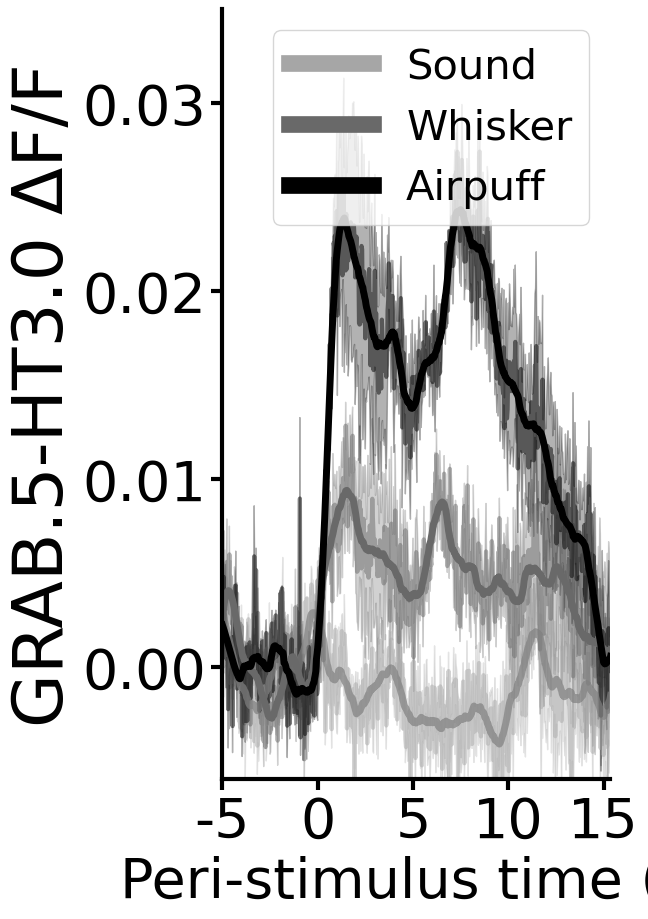

In [403]:
#Plot whisker, airruff and sound together
plt.figure(figsize=(5,10))
PeriStim_nor = PeriStim[:,[1,5]] - np.nanmean(PeriStim[:,[1,5],:,:150],axis=(3)).reshape(3,1+1,10,1)
plt.plot(np.nanmean(PeriStim_nor[0],(0,1)),color='darkgrey',lw=3, alpha=0.5)
plt.plot(np.nanmean(PeriStim_nor[1],(0,1)),color='dimgrey',lw=3, alpha=0.5)
plt.plot(np.nanmean(PeriStim_nor[2],(0,1)),color='k',lw=3, alpha=0.5)
#Plot shaded S.E.M
plt.fill_between(np.arange(1050),np.nanmean(PeriStim_nor[0],(0,1))-np.nanstd(np.nanmean(PeriStim_nor[0],1),0)/np.sqrt(len(animals)),np.nanmean(PeriStim_nor[0],(0,1))+np.nanstd(np.nanmean(PeriStim_nor[0],1),0)/np.sqrt(len(animals)),color='darkgrey',alpha=0.3)
plt.fill_between(np.arange(1050),np.nanmean(PeriStim_nor[1],(0,1))-np.nanstd(np.nanmean(PeriStim_nor[1],1),0)/np.sqrt(len(animals)),np.nanmean(PeriStim_nor[1],(0,1))+np.nanstd(np.nanmean(PeriStim_nor[1],1),0)/np.sqrt(len(animals)),color='dimgrey',alpha=0.3)
plt.fill_between(np.arange(1050),np.nanmean(PeriStim_nor[2],(0,1))-np.nanstd(np.nanmean(PeriStim_nor[2],1),0)/np.sqrt(len(animals)),np.nanmean(PeriStim_nor[2],(0,1))+np.nanstd(np.nanmean(PeriStim_nor[2],1),0)/np.sqrt(len(animals)),color='k',alpha=0.3)
#Plot savgol filtered signal
plt.plot(signal.savgol_filter(np.nanmean(PeriStim_nor[0],(0,1)),51,3),color='grey',alpha = 0.7, lw=5, label = 'Sound')
plt.plot(signal.savgol_filter(np.nanmean(PeriStim_nor[1],(0,1)),51,3),color='dimgrey',lw=5, label = 'Whisker')
plt.plot(signal.savgol_filter(np.nanmean(PeriStim_nor[2],(0,1)),51,3),color='k',lw=5, label = 'Airpuff')
#Vertical line in 60 from min to max
#plt.plot([60,60],[np.min(np.nanmean(PeriStim_nor,(0,1))),np.max(np.nanmean(PeriStim_nor,(0,1)))],'k--',lw=3)
#Remove top and right axis
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#make axis lines and ticks thicker
ax.spines['left'].set_linewidth(3.0)
ax.spines['bottom'].set_linewidth(3.0)
ax.tick_params(width=3.0,length=8.0)
#Set xticks from -2 s to 20 s, every 2 given a framerate of 30Hz
plt.xticks(np.arange(0,632,150),np.arange(-5,16,5),fontsize=40)#plt.xticks(np.arange(0,510,60),np.arange(-2,15,2),fontsize=20)
plt.xlim([0,610])
plt.ylim([-0.006,0.035])
plt.yticks(np.arange(0,0.031, 0.01),fontsize=40)
plt.ylabel('GRAB.5-HT3.0 ΔF/F',fontsize=50)
plt.xlabel('Peri-stimulus time (s)',fontsize=40)
leg = plt.legend(fontsize=30)
for line in leg.get_lines():
    line.set_linewidth(12.0)
#plt.savefig(Save_path + 'Female_P_7_10_AllStims.svg',bbox_inches='tight',format='svg',dpi=300)

In [162]:
path = '//qnap-amp001.dpag.ox.ac.uk/gsantero/Data/'
dates = ['2023-07-20']
animals = ['440','441','442','443','444']
recordings = ['t-002']
channel = 'Sound_in'
plt.figure(figsize=(20,20))
PeriStim = np.zeros((3,len(animals)+1,10,1050))
for i in range(3):
    if i == 1:
        channel = 'Whisker_in'
    elif i == 2:
        recordings = ['t-003']
    for animal in animals:
        for date in dates:
            for recording in recordings:
                grab = GRAB.GRAB_dataload(path + date + '/' + date + '_' + 'GOS' + animal + '_' +recording , detrend_both=False, detrend_CH2=False, only_CH3=False)
                paq = CaaN.paq_read_function(path + date + '/' + date + '_' + 'GOS' + animal + '_' + recording.replace('-','_') + '.paq')
                Meta = CaaN.paq_extract(paq, channel_to_Extract = channel)#'Sound_in'
                PeriStim[i,animals.index(animal),:,:] = GRAB.PeriStimFrames(grab,Meta,minus_fr=5,plus_fr=30,hz=30) # 30.49
                #plt.plot(np.nanmean(PeriStim,0),label=animal,lw=3)
    #plt.legend(fontsize=20)
    #plt.plot([60,60],[-0.01,0.015],'k--',lw=3)
    #plt.ylabel('ΔF/F',fontsize=20)
    #plt.xlabel('# Frames (30Hz)',fontsize=20)
    #plt.ylim([-0.02,0.02])

    date = '2023-04-22'
    animal = '391'

    grab = GRAB.GRAB_dataload(path + date + '/' + date + '_' + 'GOS' + animal + '_' +recording , detrend_both=False, detrend_CH2=False, only_CH3=True)
    paq = CaaN.paq_read_function(path + date + '/' + date + '_' + 'GOS' + animal + '_' + recording.replace('-','_') + '.paq')
    Meta = CaaN.paq_extract(paq, channel_to_Extract = channel)#'Sound_in'
    PeriStim[i,-1,:,:] = GRAB.PeriStimFrames(grab,Meta,minus_fr=5,plus_fr=30,hz=30)

<Figure size 2000x2000 with 0 Axes>

C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\3972560775.py:3: RuntimeWarning: Mean of empty slice
  PeriStim_nor = PeriStim[:,[0,1,3,4]] - np.nanmean(PeriStim[:,[0,1,3,4],:,:150],axis=(3)).reshape(3,3+1,10,1)


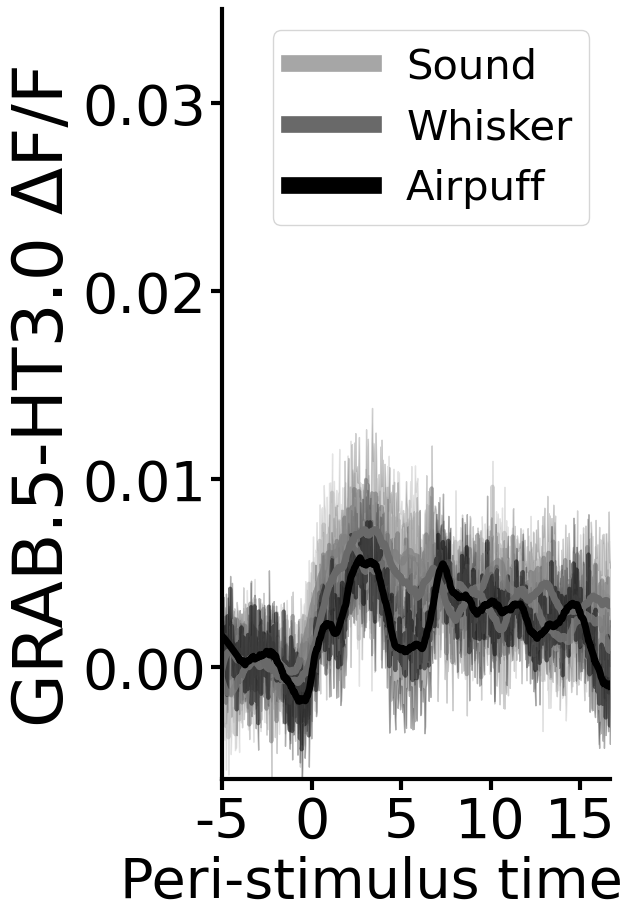

In [163]:
#Plot whisker, airruff and sound together
plt.figure(figsize=(5,10))
PeriStim_nor = PeriStim[:,[0,1,3,4]] - np.nanmean(PeriStim[:,[0,1,3,4],:,:150],axis=(3)).reshape(3,3+1,10,1)
plt.plot(np.nanmean(PeriStim_nor[0],(0,1)),color='darkgrey',lw=3, alpha=0.5)
plt.plot(np.nanmean(PeriStim_nor[1],(0,1)),color='dimgrey',lw=3, alpha=0.5)
plt.plot(np.nanmean(PeriStim_nor[2],(0,1)),color='k',lw=3, alpha=0.5)
#Plot shaded S.E.M
plt.fill_between(np.arange(1050),np.nanmean(PeriStim_nor[0],(0,1))-np.nanstd(np.nanmean(PeriStim_nor[0],1),0)/np.sqrt(len(animals)),np.nanmean(PeriStim_nor[0],(0,1))+np.nanstd(np.nanmean(PeriStim_nor[0],1),0)/np.sqrt(len(animals)),color='darkgrey',alpha=0.3)
plt.fill_between(np.arange(1050),np.nanmean(PeriStim_nor[1],(0,1))-np.nanstd(np.nanmean(PeriStim_nor[1],1),0)/np.sqrt(len(animals)),np.nanmean(PeriStim_nor[1],(0,1))+np.nanstd(np.nanmean(PeriStim_nor[1],1),0)/np.sqrt(len(animals)),color='dimgrey',alpha=0.3)
plt.fill_between(np.arange(1050),np.nanmean(PeriStim_nor[2],(0,1))-np.nanstd(np.nanmean(PeriStim_nor[2],1),0)/np.sqrt(len(animals)),np.nanmean(PeriStim_nor[2],(0,1))+np.nanstd(np.nanmean(PeriStim_nor[2],1),0)/np.sqrt(len(animals)),color='k',alpha=0.3)
#Plot savgol filtered signal
plt.plot(signal.savgol_filter(np.nanmean(PeriStim_nor[0],(0,1)),51,3),color='grey',alpha = 0.7, lw=5, label = 'Sound')
plt.plot(signal.savgol_filter(np.nanmean(PeriStim_nor[1],(0,1)),51,3),color='dimgrey',lw=5, label = 'Whisker')
plt.plot(signal.savgol_filter(np.nanmean(PeriStim_nor[2],(0,1)),51,3),color='k',lw=5, label = 'Airpuff')
#Vertical line in 60 from min to max
#plt.plot([60,60],[np.min(np.nanmean(PeriStim_nor,(0,1))),np.max(np.nanmean(PeriStim_nor,(0,1)))],'k--',lw=3)
#Remove top and right axis
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#make axis lines and ticks thicker
ax.spines['left'].set_linewidth(3.0)
ax.spines['bottom'].set_linewidth(3.0)
ax.tick_params(width=3.0,length=8.0)
#Set xticks from -2 s to 20 s, every 2 given a framerate of 30Hz
plt.xticks(np.arange(0,632,150),np.arange(-5,16,5),fontsize=40)#plt.xticks(np.arange(0,510,60),np.arange(-2,15,2),fontsize=20)
plt.xlim([0,650])
plt.ylim([-0.006,0.035])
plt.yticks(np.arange(0,0.031, 0.01),fontsize=40)
plt.ylabel('GRAB.5-HT3.0 ΔF/F',fontsize=50)
plt.xlabel('Peri-stimulus time (s)',fontsize=40)
leg = plt.legend(fontsize=30)
for line in leg.get_lines():
    line.set_linewidth(12.0)
plt.savefig(Save_path + 'Male_P_11_14_AllStims.svg',bbox_inches='tight',format='svg',dpi=300)

C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\3586037219.py:3: RuntimeWarning: Mean of empty slice
  PeriStim_nor = PeriStim[:,[2,5]] - np.nanmean(PeriStim[:,[2,5],:,:150],axis=(3)).reshape(3,1+1,10,1)


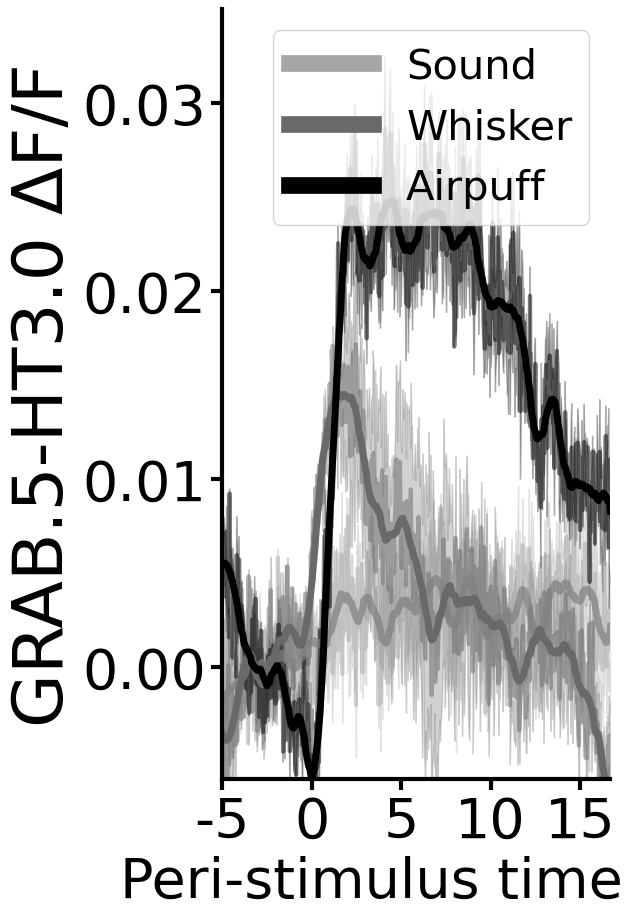

In [164]:
#Plot whisker, airruff and sound together
plt.figure(figsize=(5,10))
PeriStim_nor = PeriStim[:,[2,5]] - np.nanmean(PeriStim[:,[2,5],:,:150],axis=(3)).reshape(3,1+1,10,1)
plt.plot(np.nanmean(PeriStim_nor[0],(0,1)),color='darkgrey',lw=3, alpha=0.5)
plt.plot(np.nanmean(PeriStim_nor[1],(0,1)),color='dimgrey',lw=3, alpha=0.5)
plt.plot(np.nanmean(PeriStim_nor[2],(0,1)),color='k',lw=3, alpha=0.5)
#Plot shaded S.E.M
plt.fill_between(np.arange(1050),np.nanmean(PeriStim_nor[0],(0,1))-np.nanstd(np.nanmean(PeriStim_nor[0],1),0)/np.sqrt(len(animals)),np.nanmean(PeriStim_nor[0],(0,1))+np.nanstd(np.nanmean(PeriStim_nor[0],1),0)/np.sqrt(len(animals)),color='darkgrey',alpha=0.3)
plt.fill_between(np.arange(1050),np.nanmean(PeriStim_nor[1],(0,1))-np.nanstd(np.nanmean(PeriStim_nor[1],1),0)/np.sqrt(len(animals)),np.nanmean(PeriStim_nor[1],(0,1))+np.nanstd(np.nanmean(PeriStim_nor[1],1),0)/np.sqrt(len(animals)),color='dimgrey',alpha=0.3)
plt.fill_between(np.arange(1050),np.nanmean(PeriStim_nor[2],(0,1))-np.nanstd(np.nanmean(PeriStim_nor[2],1),0)/np.sqrt(len(animals)),np.nanmean(PeriStim_nor[2],(0,1))+np.nanstd(np.nanmean(PeriStim_nor[2],1),0)/np.sqrt(len(animals)),color='k',alpha=0.3)
#Plot savgol filtered signal
plt.plot(signal.savgol_filter(np.nanmean(PeriStim_nor[0],(0,1)),51,3),color='grey',alpha = 0.7, lw=5, label = 'Sound')
plt.plot(signal.savgol_filter(np.nanmean(PeriStim_nor[1],(0,1)),51,3),color='dimgrey',lw=5, label = 'Whisker')
plt.plot(signal.savgol_filter(np.nanmean(PeriStim_nor[2],(0,1)),51,3),color='k',lw=5, label = 'Airpuff')
#Vertical line in 60 from min to max
#plt.plot([60,60],[np.min(np.nanmean(PeriStim_nor,(0,1))),np.max(np.nanmean(PeriStim_nor,(0,1)))],'k--',lw=3)
#Remove top and right axis
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#make axis lines and ticks thicker
ax.spines['left'].set_linewidth(3.0)
ax.spines['bottom'].set_linewidth(3.0)
ax.tick_params(width=3.0,length=8.0)
#Set xticks from -2 s to 20 s, every 2 given a framerate of 30Hz
plt.xticks(np.arange(0,632,150),np.arange(-5,16,5),fontsize=40)#plt.xticks(np.arange(0,510,60),np.arange(-2,15,2),fontsize=20)
plt.xlim([0,650])
plt.ylim([-0.006,0.035])
plt.yticks(np.arange(0,0.031, 0.01),fontsize=40)
plt.ylabel('GRAB.5-HT3.0 ΔF/F',fontsize=50)
plt.xlabel('Peri-stimulus time (s)',fontsize=40)
leg = plt.legend(fontsize=30)
for line in leg.get_lines():
    line.set_linewidth(12.0)
plt.savefig(Save_path + 'Female_P_11_14_AllStims.svg',bbox_inches='tight',format='svg',dpi=300)

In [583]:
path = '//qnap-amp001.dpag.ox.ac.uk/gsantero/Data/'
dates = ['2023-07-29']
animals = ['440','441','442','443','444']
recordings = ['t-002']
channel = 'Sound_in'
plt.figure(figsize=(20,20))
PeriStim = np.zeros((3,len(animals)+1,10,1050))
for i in range(3):
    if i == 1:
        channel = 'Whisker_in'
    elif i == 2:
        recordings = ['t-003']
    for animal in animals:
        for date in dates:
            for recording in recordings:
                grab = GRAB.GRAB_dataload(path + date + '/' + date + '_' + 'GOS' + animal + '_' +recording , detrend_both=False, detrend_CH2=False, only_CH3=False)
                paq = CaaN.paq_read_function(path + date + '/' + date + '_' + 'GOS' + animal + '_' + recording.replace('-','_') + '.paq')
                Meta = CaaN.paq_extract(paq, channel_to_Extract = channel)#'Sound_in'
                PeriStim[i,animals.index(animal),:,:] = GRAB.PeriStimFrames(grab,Meta,minus_fr=5,plus_fr=30,hz=30) # 30.49
                #plt.plot(np.nanmean(PeriStim,0),label=animal,lw=3)
    #plt.legend(fontsize=20)
    #plt.plot([60,60],[-0.01,0.015],'k--',lw=3)
    #plt.ylabel('ΔF/F',fontsize=20)
    #plt.xlabel('# Frames (30Hz)',fontsize=20)
    #plt.ylim([-0.02,0.02])

    date = '2023-05-06'
    animal = '391'

    grab = GRAB.GRAB_dataload(path + date + '/' + date + '_' + 'GOS' + animal + '_' +recording , detrend_both=False, detrend_CH2=False, only_CH3=True)
    paq = CaaN.paq_read_function(path + date + '/' + date + '_' + 'GOS' + animal + '_' + recording.replace('-','_') + '.paq')
    Meta = CaaN.paq_extract(paq, channel_to_Extract = channel)#'Sound_in'
    PeriStim[i,-1,:,:] = GRAB.PeriStimFrames(grab,Meta,minus_fr=5,plus_fr=30,hz=30)

<Figure size 2000x2000 with 0 Axes>

C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\3237395361.py:3: RuntimeWarning: Mean of empty slice
  PeriStim_nor = PeriStim[:,[0,1,3,4]] - np.nanmean(PeriStim[:,[0,1,3,4],:,:150],axis=(3)).reshape(3,3+1,10,1)


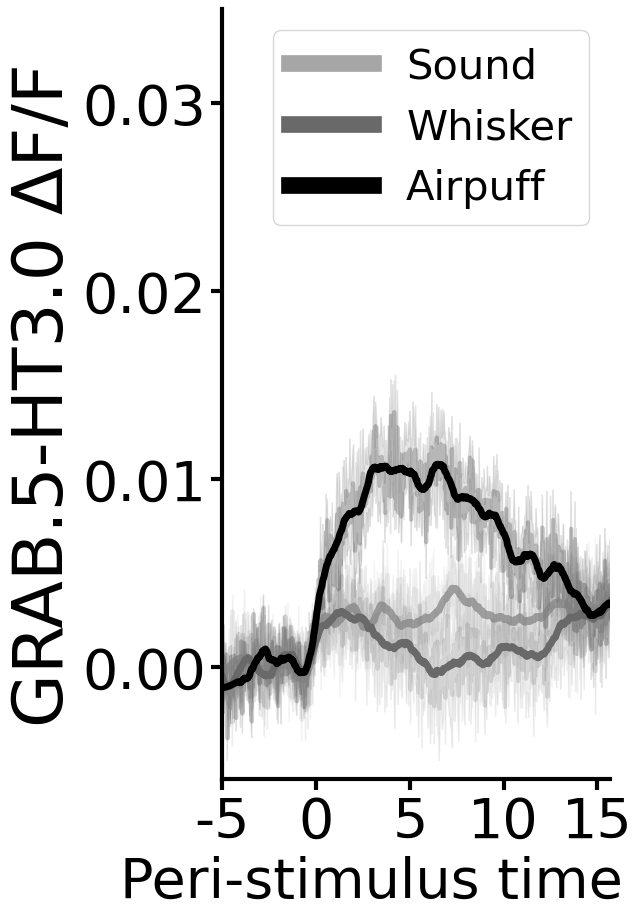

In [585]:
#Plot whisker, airruff and sound together
plt.figure(figsize=(5,10))
PeriStim_nor = PeriStim[:,[0,1,3,4]] - np.nanmean(PeriStim[:,[0,1,3,4],:,:150],axis=(3)).reshape(3,3+1,10,1)
plt.plot(np.nanmean(PeriStim_nor[0],(0,1)),color='darkgrey',lw=3, alpha=0.2)
plt.plot(np.nanmean(PeriStim_nor[1],(0,1)),color='dimgrey',lw=3, alpha=0.2)
plt.plot(np.nanmean(PeriStim_nor[2],(0,1)),color='k',lw=3, alpha=0.2)
#Plot shaded S.E.M
plt.fill_between(np.arange(1050),np.nanmean(PeriStim_nor[0],(0,1))-np.nanstd(np.nanmean(PeriStim_nor[0],1),0)/np.sqrt(len(animals)),np.nanmean(PeriStim_nor[0],(0,1))+np.nanstd(np.nanmean(PeriStim_nor[0],1),0)/np.sqrt(len(animals)),color='darkgrey',alpha=0.1)
plt.fill_between(np.arange(1050),np.nanmean(PeriStim_nor[1],(0,1))-np.nanstd(np.nanmean(PeriStim_nor[1],1),0)/np.sqrt(len(animals)),np.nanmean(PeriStim_nor[1],(0,1))+np.nanstd(np.nanmean(PeriStim_nor[1],1),0)/np.sqrt(len(animals)),color='dimgrey',alpha=0.1)
plt.fill_between(np.arange(1050),np.nanmean(PeriStim_nor[2],(0,1))-np.nanstd(np.nanmean(PeriStim_nor[2],1),0)/np.sqrt(len(animals)),np.nanmean(PeriStim_nor[2],(0,1))+np.nanstd(np.nanmean(PeriStim_nor[2],1),0)/np.sqrt(len(animals)),color='k',alpha=0.1)
#Plot savgol filtered signal
plt.plot(signal.savgol_filter(np.nanmean(PeriStim_nor[0],(0,1)),51,3),color='grey',alpha = 0.7, lw=5, label = 'Sound')
plt.plot(signal.savgol_filter(np.nanmean(PeriStim_nor[1],(0,1)),51,3),color='dimgrey',lw=5, label = 'Whisker')
plt.plot(signal.savgol_filter(np.nanmean(PeriStim_nor[2],(0,1)),51,3),color='k',lw=5, label = 'Airpuff')
#Vertical line in 60 from min to max
#plt.plot([60,60],[np.min(np.nanmean(PeriStim_nor,(0,1))),np.max(np.nanmean(PeriStim_nor,(0,1)))],'k--',lw=3)
#Remove top and right axis
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#make axis lines and ticks thicker
ax.spines['left'].set_linewidth(3.0)
ax.spines['bottom'].set_linewidth(3.0)
ax.tick_params(width=3.0,length=8.0)
#Set xticks from -2 s to 20 s, every 2 given a framerate of 30Hz
plt.xticks(np.arange(0,632,150),np.arange(-5,16,5),fontsize=40)#plt.xticks(np.arange(0,510,60),np.arange(-2,15,2),fontsize=20)
plt.xlim([0,620])
plt.ylim([-0.006,0.035])
plt.yticks(np.arange(0,0.031, 0.01),fontsize=40)
plt.ylabel('GRAB.5-HT3.0 ΔF/F',fontsize=50)
plt.xlabel('Peri-stimulus time (s)',fontsize=40)
leg = plt.legend(fontsize=30)
for line in leg.get_lines():
    line.set_linewidth(12.0)
plt.savefig(Save_path + 'Male_P_15_17_AllStims.svg',bbox_inches='tight',format='svg',dpi=300)

C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\2180640689.py:3: RuntimeWarning: Mean of empty slice
  PeriStim_nor = PeriStim[:,[2,5],:5] - np.nanmean(PeriStim[:,[2,5],:5,:150],axis=(3)).reshape(3,1+1,5,1)


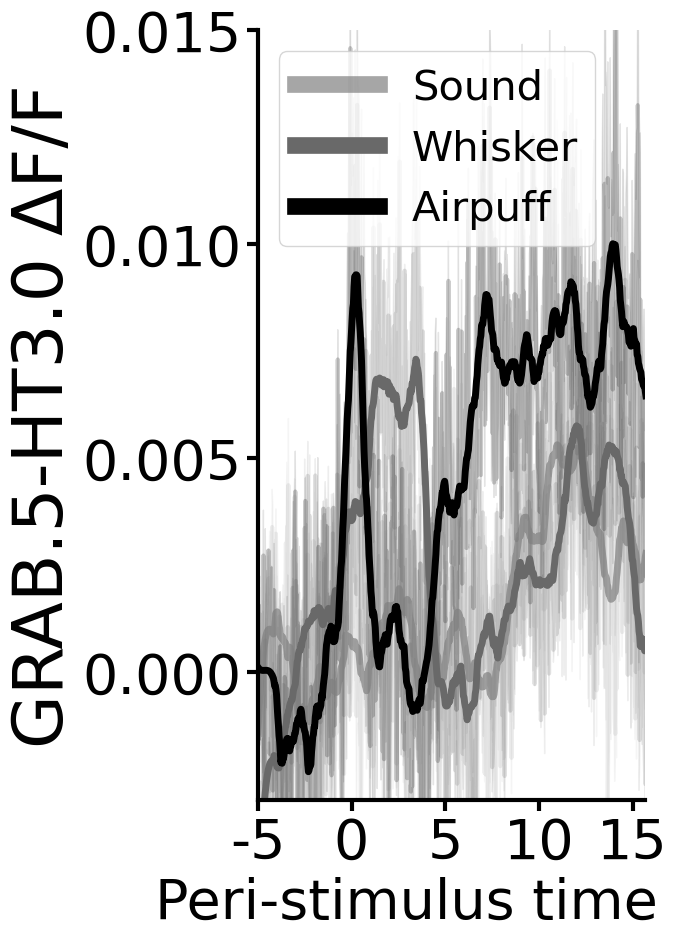

In [171]:
#Plot whisker, airruff and sound together
plt.figure(figsize=(5,10))
PeriStim_nor = PeriStim[:,[2,5],:5] - np.nanmean(PeriStim[:,[2,5],:5,:150],axis=(3)).reshape(3,1+1,5,1)
plt.plot(np.nanmean(PeriStim_nor[0],(0,1)),color='darkgrey',lw=3, alpha=0.2)
plt.plot(np.nanmean(PeriStim_nor[1],(0,1)),color='dimgrey',lw=3, alpha=0.2)
plt.plot(np.nanmean(PeriStim_nor[2],(0,1)),color='k',lw=3, alpha=0.2)
#Plot shaded S.E.M
plt.fill_between(np.arange(1050),np.nanmean(PeriStim_nor[0],(0,1))-np.nanstd(np.nanmean(PeriStim_nor[0],1),0)/np.sqrt(len(animals)),np.nanmean(PeriStim_nor[0],(0,1))+np.nanstd(np.nanmean(PeriStim_nor[0],1),0)/np.sqrt(len(animals)),color='darkgrey',alpha=0.1)
plt.fill_between(np.arange(1050),np.nanmean(PeriStim_nor[1],(0,1))-np.nanstd(np.nanmean(PeriStim_nor[1],1),0)/np.sqrt(len(animals)),np.nanmean(PeriStim_nor[1],(0,1))+np.nanstd(np.nanmean(PeriStim_nor[1],1),0)/np.sqrt(len(animals)),color='dimgrey',alpha=0.1)
plt.fill_between(np.arange(1050),np.nanmean(PeriStim_nor[2],(0,1))-np.nanstd(np.nanmean(PeriStim_nor[2],1),0)/np.sqrt(len(animals)),np.nanmean(PeriStim_nor[2],(0,1))+np.nanstd(np.nanmean(PeriStim_nor[2],1),0)/np.sqrt(len(animals)),color='k',alpha=0.1)
#Plot savgol filtered signal
plt.plot(signal.savgol_filter(np.nanmean(PeriStim_nor[0],(0,1)),51,3),color='grey',alpha = 0.7, lw=5, label = 'Sound')
plt.plot(signal.savgol_filter(np.nanmean(PeriStim_nor[1],(0,1)),51,3),color='dimgrey',lw=5, label = 'Whisker')
plt.plot(signal.savgol_filter(np.nanmean(PeriStim_nor[2],(0,1)),51,3),color='k',lw=5, label = 'Airpuff')
#Vertical line in 60 from min to max
#plt.plot([60,60],[np.min(np.nanmean(PeriStim_nor,(0,1))),np.max(np.nanmean(PeriStim_nor,(0,1)))],'k--',lw=3)
#Remove top and right axis
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#make axis lines and ticks thicker
ax.spines['left'].set_linewidth(3.0)
ax.spines['bottom'].set_linewidth(3.0)
ax.tick_params(width=3.0,length=8.0)
#Set xticks from -2 s to 20 s, every 2 given a framerate of 30Hz
plt.xticks(np.arange(0,632,150),np.arange(-5,16,5),fontsize=40) #plt.xticks(np.arange(0,510,60),np.arange(-2,15,2),fontsize=20)
plt.xlim([0,620])
plt.ylim([-0.003,0.015])
plt.yticks(np.arange(0,0.016, 0.005),fontsize=40)
plt.ylabel('GRAB.5-HT3.0 ΔF/F',fontsize=50)
plt.xlabel('Peri-stimulus time (s)',fontsize=40)
leg = plt.legend(fontsize=30)
for line in leg.get_lines():
    line.set_linewidth(12.0)
plt.savefig(Save_path + 'Female_P_15_17_AllStims.svg',bbox_inches='tight',format='svg',dpi=300)

# Raster plot

In [465]:
Order = ['WT','HET','KO','Control','SSRI']
Animals = ['301','327','225','419','449']
Dates = ['2023-01-28','2023-03-13','2022-08-14','2023-06-02','2023-07-18']
rows = [205,251,74,473,544]
ALL_spikes = []
for i in range(len(Animals)):
    date = Dates[i]
    animal = Animals[i]
    row = rows[i]
    path = '//qnap-amp001.dpag.ox.ac.uk/gsantero/Data/'+ date + '/' + date + '_GOS' + animal + '_t-001/suite2p/plane0/'
    iscell = np.load(path + 'iscell.npy')[:,0].astype(bool)
    #Load spikes
    Spikes = np.load(path + 'spks.npy')

    spikes = Spikes[iscell][:,:36000]
    #dF_F = CaaN.CaldF_F_percentile(data)
    ALL_spikes.append(spikes)
#'//qnap-amp001.dpag.ox.ac.uk/gsantero/Data/'+ date + '/' + date + '_GOS' + animal + '_t-001/suite2p/plane0/'
#CaaN.Peri_H_event(path,df,row)


In [578]:
Order = ['WT','HET','KO','Control','SSRI']
Animals = ['449','327','430','419','449'] #222 2022-08-14 wt example
Dates = ['2023-07-18','2023-03-13','2023-07-11','2023-06-02','2023-07-18']
rows = [282,251,74,473,544]
ALL_spikes = []
for i in range(len(Animals[:1])):
    date = Dates[i]
    animal = Animals[i]
    row = rows[i]
    path = '//qnap-amp001.dpag.ox.ac.uk/gsantero/Data/'+ date + '/' + date + '_GOS' + animal + '_t-001/suite2p/plane0/'
    iscell = np.load(path + 'iscell.npy')[:,0].astype(bool)
    #Load spikes
    Spikes = np.load(path + 'spks.npy')

    spikes = Spikes[iscell][:,:36000]
    #dF_F = CaaN.CaldF_F_percentile(data)
    ALL_spikes.append(spikes)
#'//qnap-amp001.dpag.ox.ac.uk/gsantero/Data/'+ date + '/' + date + '_GOS' + animal + '_t-001/suite2p/plane0/'
#CaaN.Peri_H_event(path,df,row)


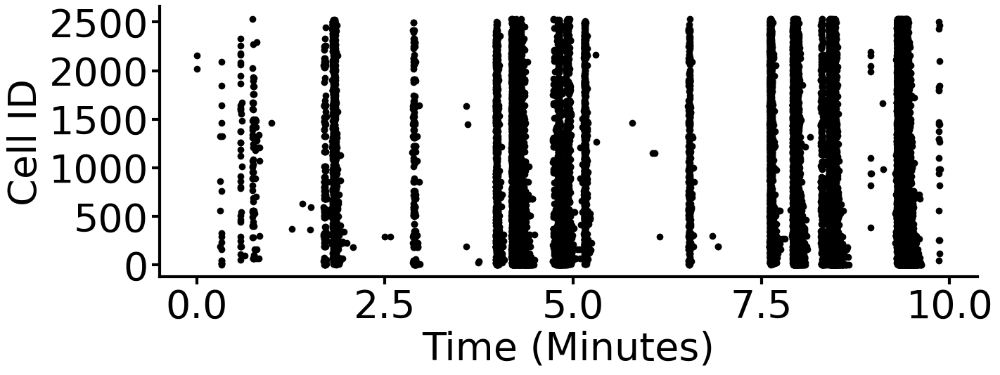

In [581]:
for count, spikes in enumerate(ALL_spikes):
    # Define the time axis (assuming each column represents a time point)
    time_points = np.arange(spikes[:,:18000].shape[1])  # Adjust if you have specific time intervals

    # Create the raster plot
    plt.figure(figsize=(15, 5))

    # Loop over each cell and plot spikes
    for cell_id in range(spikes.shape[0]):
        spike_times = time_points[spikes[cell_id,:18000] > 150]  # Get times where there's a spike
        plt.scatter(spike_times, [cell_id] * len(spike_times), color = 'k')  # Plot spikes

    # Labeling the plot
    plt.xlabel("Time (Minutes)", fontsize=40)
    plt.ylabel("Cell ID", fontsize=40)
    plt.xticks(np.arange(0,18001,4500),np.arange(0,10.1,2.5),fontsize=40)
    plt.yticks(np.arange(0,2501,500),fontsize=40)
    #remove top and right axis
    ax = plt.gca()
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    #make axis lines and ticks thicker
    ax.spines['left'].set_linewidth(3.0)
    ax.spines['bottom'].set_linewidth(3.0)
    ax.tick_params(width=3.0,length=8.0)
    #plt.savefig(Save_path + 'SSRI_10_min_Raster_plot_' + str(Order[count]) + '_cells.svg',bbox_inches='tight',format='svg',dpi=300)

    #plt.title("Spike Raster Plot of Calcium Imaging Data")
    #plt.show()

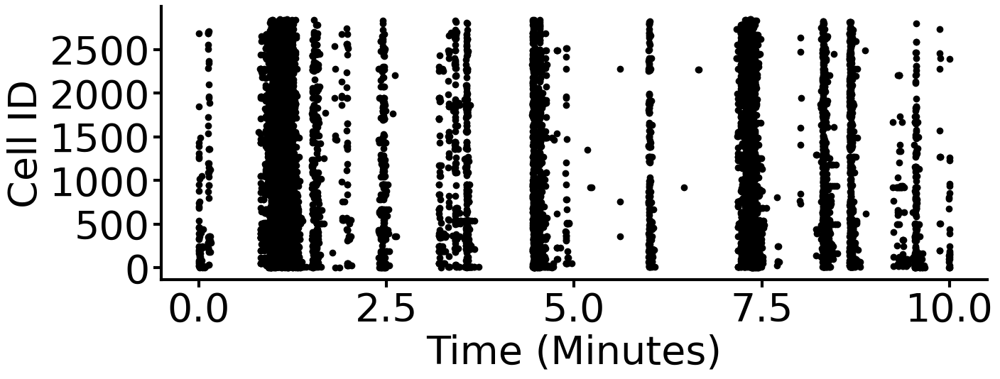

In [ ]:
for count, spikes in enumerate(ALL_spikes):
    # Define the time axis (assuming each column represents a time point)
    time_points = np.arange(spikes[:,:18000].shape[1])  # Adjust if you have specific time intervals

    # Create the raster plot
    plt.figure(figsize=(15, 5))

    # Loop over each cell and plot spikes
    for cell_id in range(spikes.shape[0]):
        spike_times = time_points[spikes[cell_id,:18000] > 300]  # Get times where there's a spike
        plt.scatter(spike_times, [cell_id] * len(spike_times), color = 'k')  # Plot spikes

    # Labeling the plot
    plt.xlabel("Time (Minutes)", fontsize=40)
    plt.ylabel("Cell ID", fontsize=40)
    plt.xticks(np.arange(0,18001,4500),np.arange(0,10.1,2.5),fontsize=40)
    plt.yticks(np.arange(0,2501,500),fontsize=40)
    #remove top and right axis
    ax = plt.gca()
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    #make axis lines and ticks thicker
    ax.spines['left'].set_linewidth(3.0)
    ax.spines['bottom'].set_linewidth(3.0)
    ax.tick_params(width=3.0,length=8.0)
    plt.savefig(Save_path + '10_min_Raster_plot_' + str(Order[count]) + '_cells.svg',bbox_inches='tight',format='svg',dpi=300)

    #plt.title("Spike Raster Plot of Calcium Imaging Data")
    #plt.show()

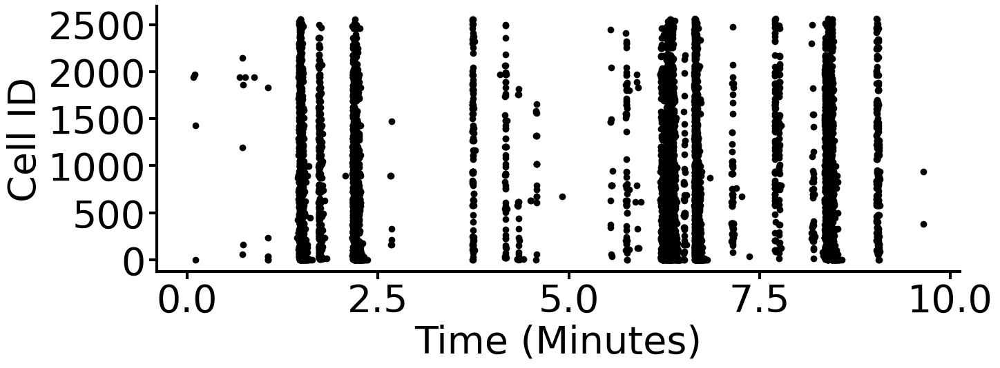

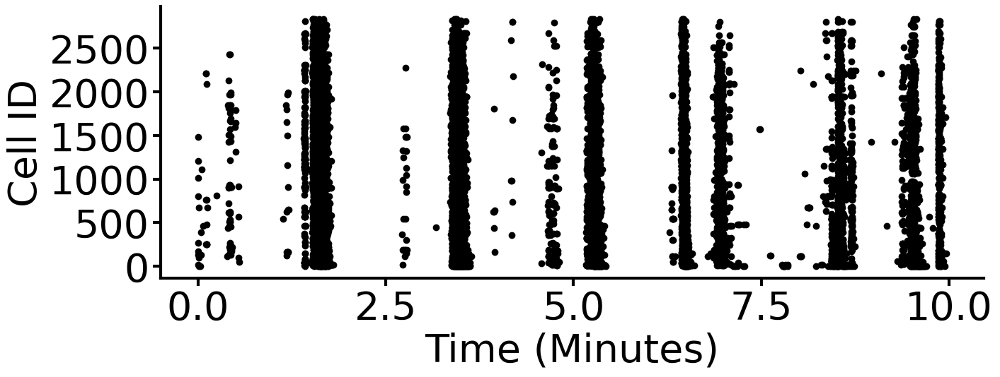

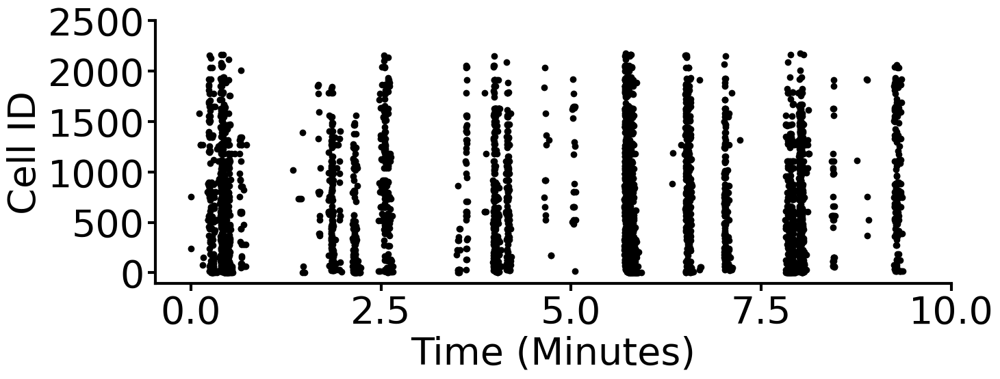

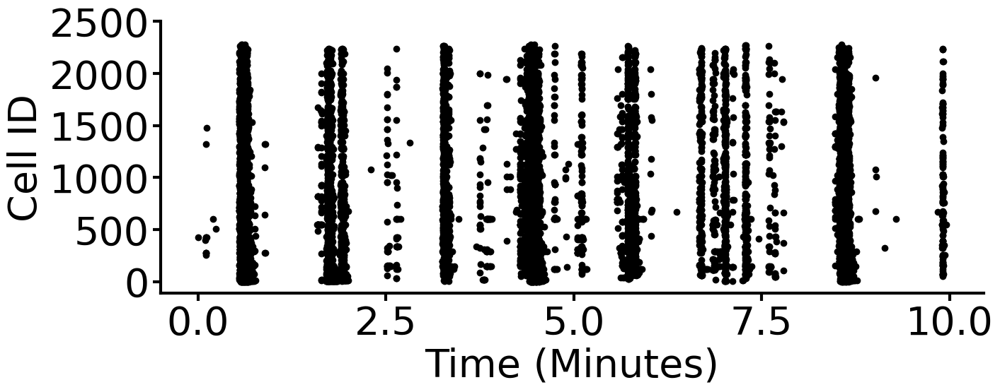

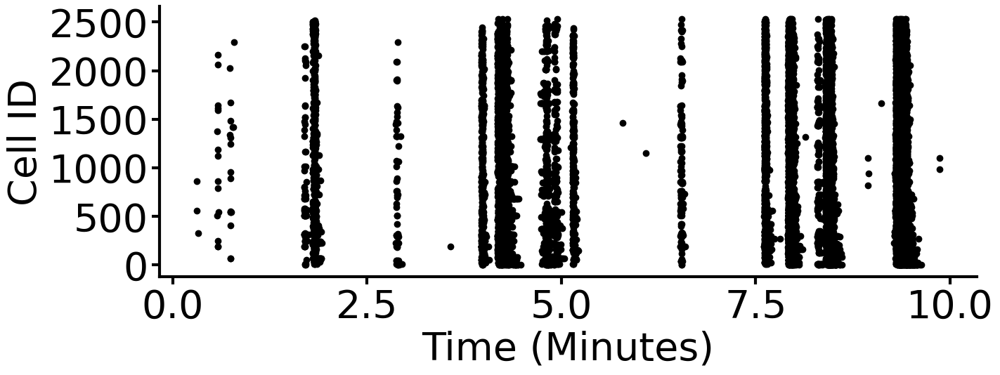

In [522]:
for count, spikes in enumerate(ALL_spikes):
    # Define the time axis (assuming each column represents a time point)
    time_points = np.arange(spikes[:,:18000].shape[1])  # Adjust if you have specific time intervals

    # Create the raster plot
    plt.figure(figsize=(15, 5))

    # Loop over each cell and plot spikes
    for cell_id in range(spikes.shape[0]):
        spike_times = time_points[spikes[cell_id,:18000] > 200]  # Get times where there's a spike
        plt.scatter(spike_times, [cell_id] * len(spike_times), color = 'k')  # Plot spikes

    # Labeling the plot
    plt.xlabel("Time (Minutes)", fontsize=40)
    plt.ylabel("Cell ID", fontsize=40)
    plt.xticks(np.arange(0,18001,4500),np.arange(0,10.1,2.5),fontsize=40)
    plt.yticks(np.arange(0,2501,500),fontsize=40)
    #remove top and right axis
    ax = plt.gca()
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    #make axis lines and ticks thicker
    ax.spines['left'].set_linewidth(3.0)
    ax.spines['bottom'].set_linewidth(3.0)
    ax.tick_params(width=3.0,length=8.0)
    plt.savefig(Save_path + '10_min_Raster_plot_' + str(Order[count]) + '_cells.svg',bbox_inches='tight',format='svg',dpi=300)

    #plt.title("Spike Raster Plot of Calcium Imaging Data")
    #plt.show()

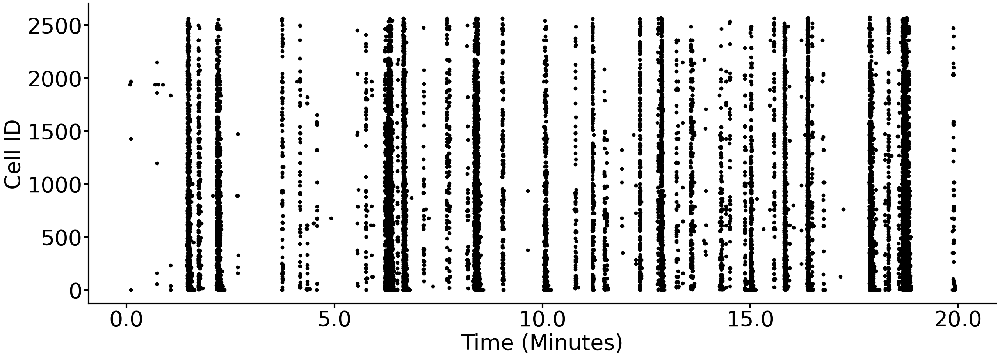

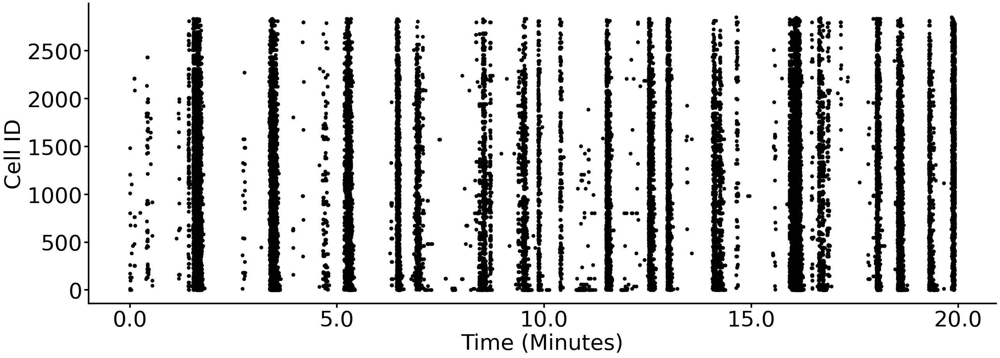

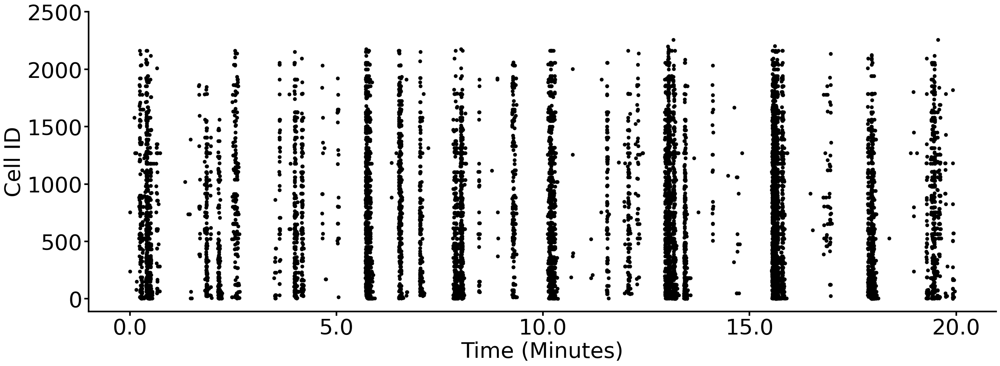

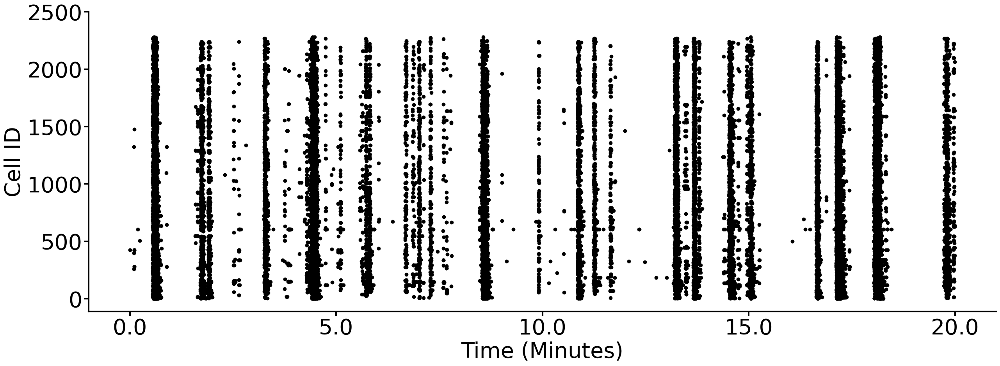

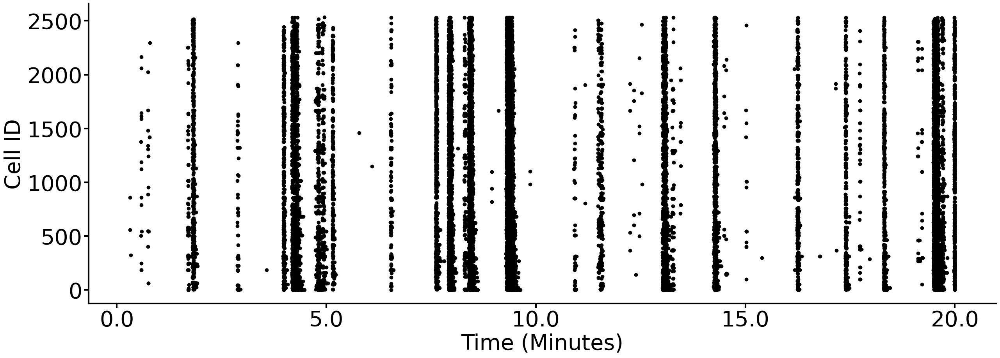

In [474]:
for count, spikes in enumerate(ALL_spikes):
    # Define the time axis (assuming each column represents a time point)
    time_points = np.arange(spikes.shape[1])  # Adjust if you have specific time intervals

    # Create the raster plot
    plt.figure(figsize=(30, 10))

    # Loop over each cell and plot spikes
    for cell_id in range(spikes.shape[0]):
        spike_times = time_points[spikes[cell_id] > 200]  # Get times where there's a spike
        plt.scatter(spike_times, [cell_id] * len(spike_times), color = 'k')  # Plot spikes

    # Labeling the plot
    plt.xlabel("Time (Minutes)", fontsize=40)
    plt.ylabel("Cell ID", fontsize=40)
    plt.xticks(np.arange(0,36001,9000),np.arange(0,20.1,5),fontsize=40)
    plt.yticks(np.arange(0,2501,500),fontsize=40)
    #remove top and right axis
    ax = plt.gca()
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    #make axis lines and ticks thicker
    ax.spines['left'].set_linewidth(3.0)
    ax.spines['bottom'].set_linewidth(3.0)
    ax.tick_params(width=3.0,length=8.0)
    #plt.savefig(Save_path + 'Raster_plot_' + str(Order[count]) + '_cells.svg',bbox_inches='tight',format='svg',dpi=300)

    #plt.title("Spike Raster Plot of Calcium Imaging Data")
    #plt.show()

# Numbers

In [174]:
# Number of female and male mice for each genotype
#WT
print('WT')
wt= df[df['genotype']=='WT']
male = wt[wt['sex']=='Male']
female = wt[wt['sex']=='Female']
print('Male: ' + str(len(male['animal'].unique())))
print('Female: ' + str(len(female['animal'].unique())))

#HET
print('HET')
wt= df[df['genotype']=='HET']
male = wt[wt['sex']=='Male']
female = wt[wt['sex']=='Female']
print('Male: ' + str(len(male['animal'].unique())))
print('Female: ' + str(len(female['animal'].unique())))
#KO
print('KO')
wt= df[df['genotype']=='KO']
male = wt[wt['sex']=='Male']
female = wt[wt['sex']=='Female']
print('Male: ' + str(len(male['animal'].unique())))
print('Female: ' + str(len(female['animal'].unique())))
#Control
print('Control')
wt = df[df['genotype']=='Control']
male = wt[wt['sex']=='Male']
female = wt[wt['sex']=='Female']
print('Male: ' + str(len(male['animal'].unique())))
print('Female: ' + str(len(female['animal'].unique())))
#SSRI
print('SSRI')
wt = df[df['genotype']=='SSRI']
male = wt[wt['sex']=='Male']
female = wt[wt['sex']=='Female']
print('Male: ' + str(len(male['animal'].unique())))
print('Female: ' + str(len(female['animal'].unique())))

WT
Male: 10
Female: 9
HET
Male: 14
Female: 9
KO
Male: 4
Female: 6
Control
Male: 6
Female: 6
SSRI
Male: 7
Female: 5


In [182]:
# Number of neurons in total
for geno in df['genotype'].unique():
    df_g = df[df['genotype'] == geno]
    print(geno)
    print('Total: ' +str(df_g['num_neurons'].sum()))
    #Average and std of neurons per animal/day
    print('Mean per animal: ' +str(df_g.groupby(['animal','date']).sum()['num_neurons'].mean()))
    print('SD per animal: ' +str(df_g.groupby(['animal','date']).sum()['num_neurons'].std()))

WT
Total: 182264.0
Mean per animal: 1380.7878787878788
SD per animal: 443.03359220427103
HET
Total: 201188.0
Mean per animal: 1241.9012345679012
SD per animal: 407.5715721908162
KO
Total: 118126.0
Mean per animal: 1458.3456790123457
SD per animal: 419.6852737615959
Control
Total: 132990.0
Mean per animal: 1329.9
SD per animal: 446.4564294915502
SSRI
Total: 114783.0
Mean per animal: 1195.65625
SD per animal: 377.35954732923653


# Interneuron events

In [ ]:
Path_df = '//qnap-amp001.dpag.ox.ac.uk/gsantero/Analysis/Data_frames/With_data/'
file_name = '2023_10_23_df_data_interneuron' 
#import 2023_03_18_df_cumsum as df_cumsum using pickle
with open(Path_df + file_name,'rb') as handle:
    df = pickle.load(handle)
    
df['interneuron'] = df['interneuron'].replace('NKx2.1','Nkx2.1')
df['genotype'] = df['genotype'].replace('KO ','KO')
df['genotype'] = df['genotype'].replace('HET ','HET')
df['genotype'] = df['genotype'].replace('WT ','WT')
df['genotype'] = df['genotype'].replace('WT?','WT')

#extract_to_separate_coloumn number of neurons to separate coloumn
df = PdA.extract_to_separate_coloumn(df,'Number_of_neurons',0,'Neurons')

#Remove rows with less than 500 neuorns and print how many where removed
print('Number of rows removed: ' + str(len(df[df['Neurons'] < 500])))
df = df[df['Neurons'] >= 500]

#remove runt 351 (died at P10 very underweighted)
df = df[df['animal'] != 'GOS351']
df.head(n=10)

#remove GOS464 ONWARDS (WT dams)
df = df[df['animal'] != 'GOS466']
df = df[df['animal'] != 'GOS470']
df = df[df['animal'] != 'GOS471']


Number of rows removed: 54


## Duration

### SERTKO

2
2
6
5
12
12
2
WT: 41
HET: 166
KO: 81
ShapiroResult(statistic=0.9585264325141907, pvalue=0.1396496444940567)
KruskalResult(statistic=15.667728042279748, pvalue=0.00039609201161359975)
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
   1.0    2.0   0.5623 0.0002  0.2392 0.8854   True
   1.0    3.0   0.3723 0.0374  0.0172 0.7274   True
   2.0    3.0    -0.19 0.1771 -0.4411 0.0611  False
---------------------------------------------------


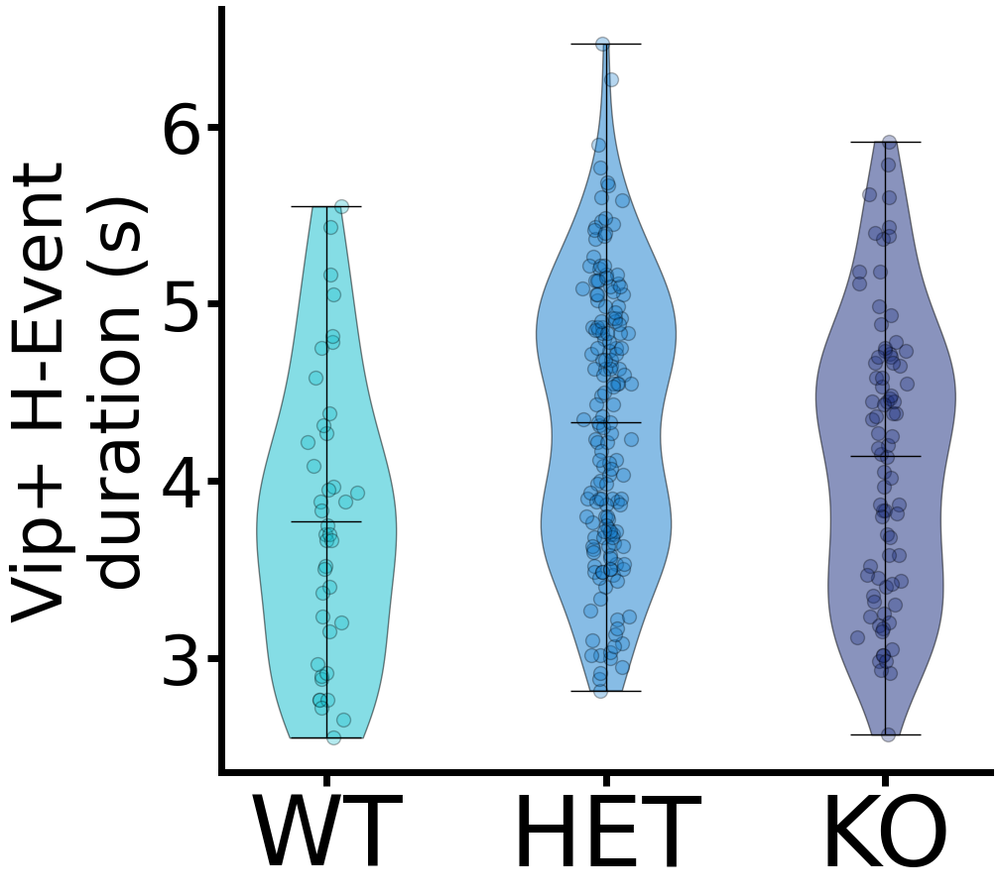

In [395]:
WT = []
HET = []
KO = []

for age in range(7,11):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Vip'].iterrows():
        try:
            tmp = row['Interneurons_events_single_neuron_t001']['Peri_H']
            tmp2 = np.nanmean(row['Interneurons_events_single_neuron_t001']['Peri_H'],2)[:,0]
    
            if row['genotype'] == 'WT':
                WT.append(np.nanmean(tmp[:,0]>tmp2[:,None],1))
                print(tmp.shape[0])
            if row['genotype'] == 'HET':
                HET.append(np.nanmean(tmp[:,0]>tmp2[:,None],1))
            if row['genotype'] == 'KO':
                KO.append(np.nanmean(tmp[:,0]>tmp2[:,None],1))

        except:
            pass
try:
    WT = (np.hstack(WT)).astype(float)
    HET = (np.hstack(HET)).astype(float)
    KO = (np.hstack(KO)).astype(float)
except:
    pass



#Violin plot of WT,HET,KO
plt.figure(figsize=(10,10))
#Make 0 nans in WT,HET,KO
WT[WT==0] = np.nan
HET[HET==0] = np.nan
KO[KO==0] = np.nan

WT = WT*10 #SEC
HET = HET*10 #SEC
KO = KO*10 #SEC

violin = plt.violinplot([WT[~np.isnan(WT)]],positions=[1],showmeans=True,showextrema=True)
violin2 = plt.violinplot([HET[~np.isnan(HET)]],positions=[2],showmeans=True,showextrema=True)
violin3 = plt.violinplot([KO[~np.isnan(KO)]],positions=[3],showmeans=True,showextrema=True)

#set all edges black
for partname in ('cbars','cmins','cmaxes','cmeans'):
    vp = violin[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin2[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin3[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
#color violin plot faces
for pc in violin['bodies']:
    pc.set_facecolor(color1)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin2['bodies']:
    pc.set_facecolor(color2)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin3['bodies']:
    pc.set_facecolor(color3)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)

    
#scatter points on top
plt.scatter(np.ones(WT.shape[0])+np.random.normal(1,0.035,WT.shape[0])-1,WT,color=color1,edgecolors='black',s=100, alpha=0.3)
plt.scatter(np.ones(HET.shape[0])+np.random.normal(1,0.035,HET.shape[0]),HET,color=color2,edgecolors='black',s=100, alpha=0.3)
plt.scatter(np.ones(KO.shape[0])+np.random.normal(1,0.035,KO.shape[0])+1,KO,color=color3,edgecolors='black',s=100, alpha=0.3)


#Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(fontsize=70)
plt.yticks(fontsize=50)
#Set x and y labels
plt.xticks([1,2,3],['WT','HET','KO'])
plt.ylabel('Vip+ H-Event\nduration (s)',fontsize=50)

#Make axis thicker
ax.spines['left'].set_linewidth(5)
ax.spines['bottom'].set_linewidth(5)
#make ticks longer and wider
ax.tick_params(width=5,length=10)

plt.savefig(Save_path + 'VIP_H_event_duration_KO.svg',dpi=300,bbox_inches='tight', format='svg')

#Print lengths of each genotype
print('WT: ' + str(WT.shape[0]))
print('HET: ' + str(HET.shape[0]))
print('KO: ' + str(KO.shape[0]))
#Shapiro test
print(stats.shapiro(WT[~np.isnan(WT)]))
#Krustal wallis
print(stats.kruskal(WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)]))
#Tukey
print(tukey.MultiComparison(np.hstack((WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)])),np.hstack((np.ones(WT[~np.isnan(WT)].shape[0]),np.ones(HET[~np.isnan(HET)].shape[0])+1,np.ones(KO[~np.isnan(KO)].shape[0])+2))).tukeyhsd().summary())




5
3
7
7
5
8
11
2
9
3
5
18
4
0
5
13
WT: 105
HET: 139
ShapiroResult(statistic=0.9600109457969666, pvalue=0.003002739744260907)
MannwhitneyuResult(statistic=8427.0, pvalue=0.03860976421772852)


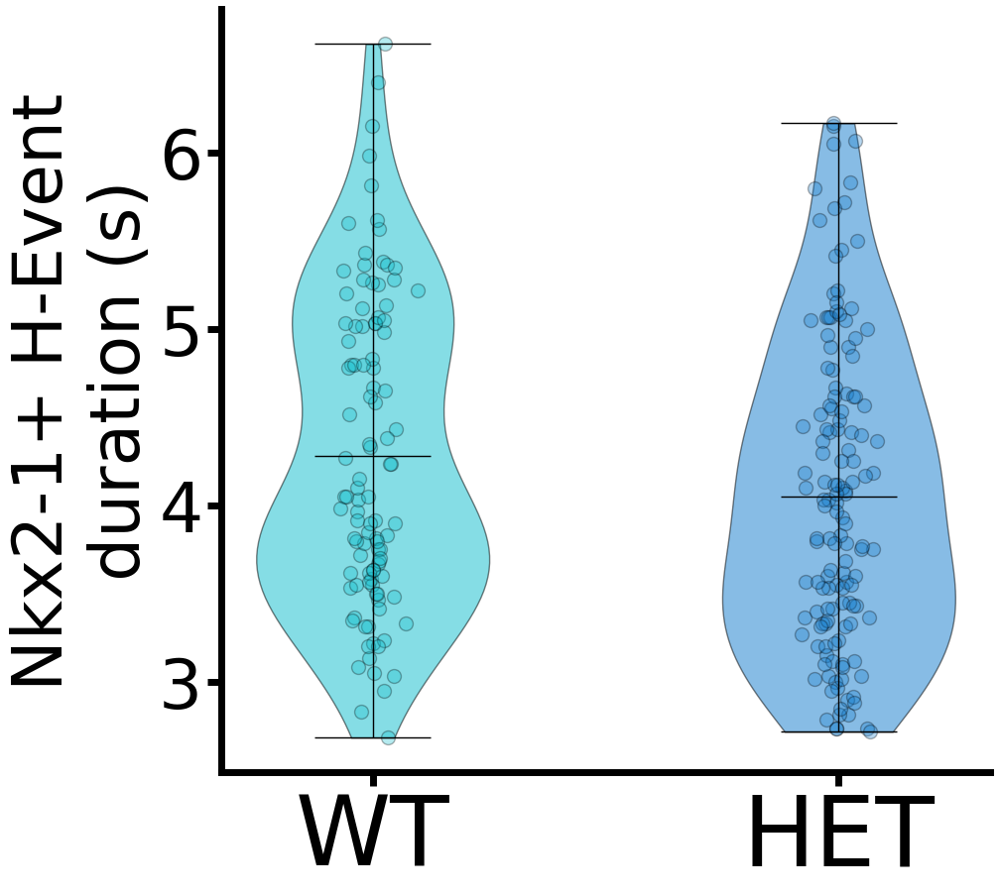

In [394]:
WT = []
HET = []
KO = []

for age in range(7,11):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Nkx2.1'].iterrows():
        try:
            tmp = row['Interneurons_events_single_neuron_t001']['Peri_H']
            tmp2 = np.nanmean(row['Interneurons_events_single_neuron_t001']['Peri_H'],2)[:,0]
    
            if row['genotype'] == 'WT':
                WT.append(np.nanmean(tmp[:,0]>tmp2[:,None],1))
                print(tmp.shape[0])
            if row['genotype'] == 'HET':
                HET.append(np.nanmean(tmp[:,0]>tmp2[:,None],1))
            if row['genotype'] == 'KO':
                KO.append(np.nanmean(tmp[:,0]>tmp2[:,None],1))

        except:
            pass
try:
    WT = (np.hstack(WT)).astype(float)
    HET = (np.hstack(HET)).astype(float)
    KO = (np.hstack(KO)).astype(float)
except:
    pass



#Violin plot of WT,HET,KO
plt.figure(figsize=(10,10))
#Make 0 nans in WT,HET,KO
WT[WT==0] = np.nan
HET[HET==0] = np.nan
#KO[KO==0] = np.nan

WT = WT*10 #SEC
HET = HET*10 #SEC
KO = KO*10 #SEC

violin = plt.violinplot([WT[~np.isnan(WT)]],positions=[1],showmeans=True,showextrema=True)
violin2 = plt.violinplot([HET[~np.isnan(HET)]],positions=[2],showmeans=True,showextrema=True)
#violin3 = plt.violinplot([KO[~np.isnan(KO)]],positions=[3],showmeans=True,showextrema=True)

#set all edges black
for partname in ('cbars','cmins','cmaxes','cmeans'):
    vp = violin[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin2[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin3[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
#color violin plot faces
for pc in violin['bodies']:
    pc.set_facecolor(color1)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin2['bodies']:
    pc.set_facecolor(color2)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin3['bodies']:
    pc.set_facecolor(color3)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)

    
#scatter points on top
plt.scatter(np.ones(WT.shape[0])+np.random.normal(1,0.035,WT.shape[0])-1,WT,color=color1,edgecolors='black',s=100, alpha=0.3)
plt.scatter(np.ones(HET.shape[0])+np.random.normal(1,0.035,HET.shape[0]),HET,color=color2,edgecolors='black',s=100, alpha=0.3)
#plt.scatter(np.ones(KO.shape[0])+np.random.normal(1,0.035,KO.shape[0])+1,KO,color=color3,edgecolors='black',s=100, alpha=0.3)


#Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(fontsize=70)
plt.yticks(fontsize=50)
#Set x and y labels
plt.xticks([1,2],['WT','HET'])
plt.ylabel('Nkx2-1+ H-Event\n duration (s)',fontsize=50)

#Make axis thicker
ax.spines['left'].set_linewidth(5)
ax.spines['bottom'].set_linewidth(5)
#make ticks longer and wider
ax.tick_params(width=5,length=10)

plt.savefig(Save_path + 'Nkx2.1_H_event_duration_SERTKO.svg',dpi=300,bbox_inches='tight', format='svg')

#Print lengths of each genotype
print('WT: ' + str(WT.shape[0]))
print('HET: ' + str(HET.shape[0]))
#print('KO: ' + str(KO.shape[0]))
#Shapiro test
print(stats.shapiro(WT[~np.isnan(WT)]))
#Krustal wallis
print(stats.mannwhitneyu(WT[~np.isnan(WT)],HET[~np.isnan(HET)]))
#Tukey
#print(tukey.MultiComparison(np.hstack((WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)])),np.hstack((np.ones(WT[~np.isnan(WT)].shape[0]),np.ones(HET[~np.isnan(HET)].shape[0])+1,np.ones(KO[~np.isnan(KO)].shape[0])+2))).tukeyhsd().summary())




### SSRI

WT: 108
HET: 63
ShapiroResult(statistic=0.9774653911590576, pvalue=0.06343010812997818)
MannwhitneyuResult(statistic=3685.0, pvalue=0.36564181802101214)


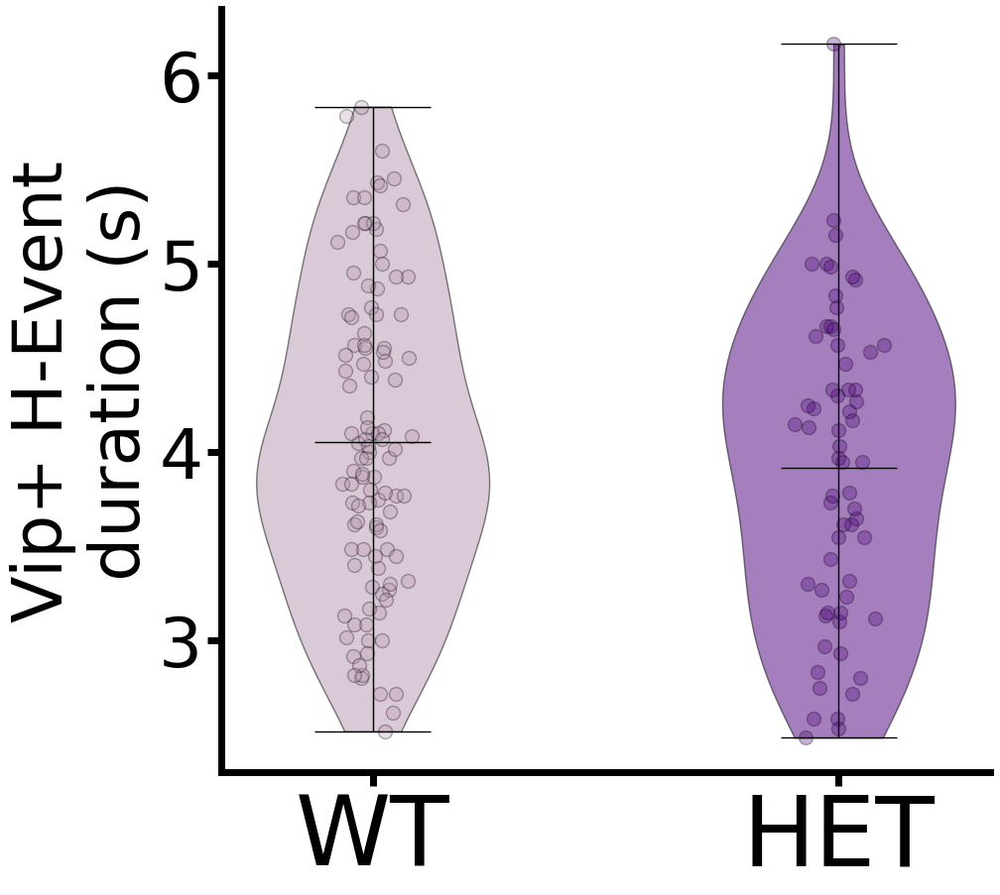

In [399]:
WT = []
HET = []
KO = []

for age in range(7,11):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Vip'].iterrows():
        try:
            tmp = row['Interneurons_events_single_neuron_t001']['Peri_H']
            tmp2 = np.nanmean(row['Interneurons_events_single_neuron_t001']['Peri_H'],2)[:,0]
    
            if row['genotype'] == 'Control':
                WT.append(np.nanmean(tmp[:,0]>tmp2[:,None],1))
  
            if row['genotype'] == 'SSRI':
                HET.append(np.nanmean(tmp[:,0]>tmp2[:,None],1))


        except:
            pass
try:
    WT = (np.hstack(WT)).astype(float)
    HET = (np.hstack(HET)).astype(float)

except:
    pass



#Violin plot of WT,HET,KO
plt.figure(figsize=(10,10))
#Make 0 nans in WT,HET,KO
WT[WT==0] = np.nan
HET[HET==0] = np.nan
#KO[KO==0] = np.nan

WT = WT*10 #SEC
HET = HET*10 #SEC
KO = KO*10 #SEC

violin = plt.violinplot([WT[~np.isnan(WT)]],positions=[1],showmeans=True,showextrema=True)
violin2 = plt.violinplot([HET[~np.isnan(HET)]],positions=[2],showmeans=True,showextrema=True)
#violin3 = plt.violinplot([KO[~np.isnan(KO)]],positions=[3],showmeans=True,showextrema=True)

#set all edges black
for partname in ('cbars','cmins','cmaxes','cmeans'):
    vp = violin[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin2[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)

#color violin plot faces
for pc in violin['bodies']:
    pc.set_facecolor(color4)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin2['bodies']:
    pc.set_facecolor(color5)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)


    
#scatter points on top
plt.scatter(np.ones(WT.shape[0])+np.random.normal(1,0.035,WT.shape[0])-1,WT,color=color4,edgecolors='black',s=100, alpha=0.3)
plt.scatter(np.ones(HET.shape[0])+np.random.normal(1,0.035,HET.shape[0]),HET,color=color5,edgecolors='black',s=100, alpha=0.3)
#plt.scatter(np.ones(KO.shape[0])+np.random.normal(1,0.035,KO.shape[0])+1,KO,color=color3,edgecolors='black',s=100, alpha=0.3)


#Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(fontsize=70)
plt.yticks(fontsize=50)
#Set x and y labels
plt.xticks([1,2],['WT','HET'])
plt.ylabel('Vip+ H-Event\n duration (s)',fontsize=50)

#Make axis thicker
ax.spines['left'].set_linewidth(5)
ax.spines['bottom'].set_linewidth(5)
#make ticks longer and wider
ax.tick_params(width=5,length=10)

plt.savefig(Save_path + 'SSRI_Vip_H_event_duration_SERTKO.svg',dpi=300,bbox_inches='tight', format='svg')

#Print lengths of each genotype
print('WT: ' + str(WT.shape[0]))
print('HET: ' + str(HET.shape[0]))
#print('KO: ' + str(KO.shape[0]))
#Shapiro test
print(stats.shapiro(WT[~np.isnan(WT)]))
#Krustal wallis
print(stats.mannwhitneyu(WT[~np.isnan(WT)],HET[~np.isnan(HET)]))
#Tukey
#print(tukey.MultiComparison(np.hstack((WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)])),np.hstack((np.ones(WT[~np.isnan(WT)].shape[0]),np.ones(HET[~np.isnan(HET)].shape[0])+1,np.ones(KO[~np.isnan(KO)].shape[0])+2))).tukeyhsd().summary())




WT: 126
HET: 128
ShapiroResult(statistic=0.9771999716758728, pvalue=0.03160492703318596)
MannwhitneyuResult(statistic=8152.0, pvalue=0.8811825107702781)


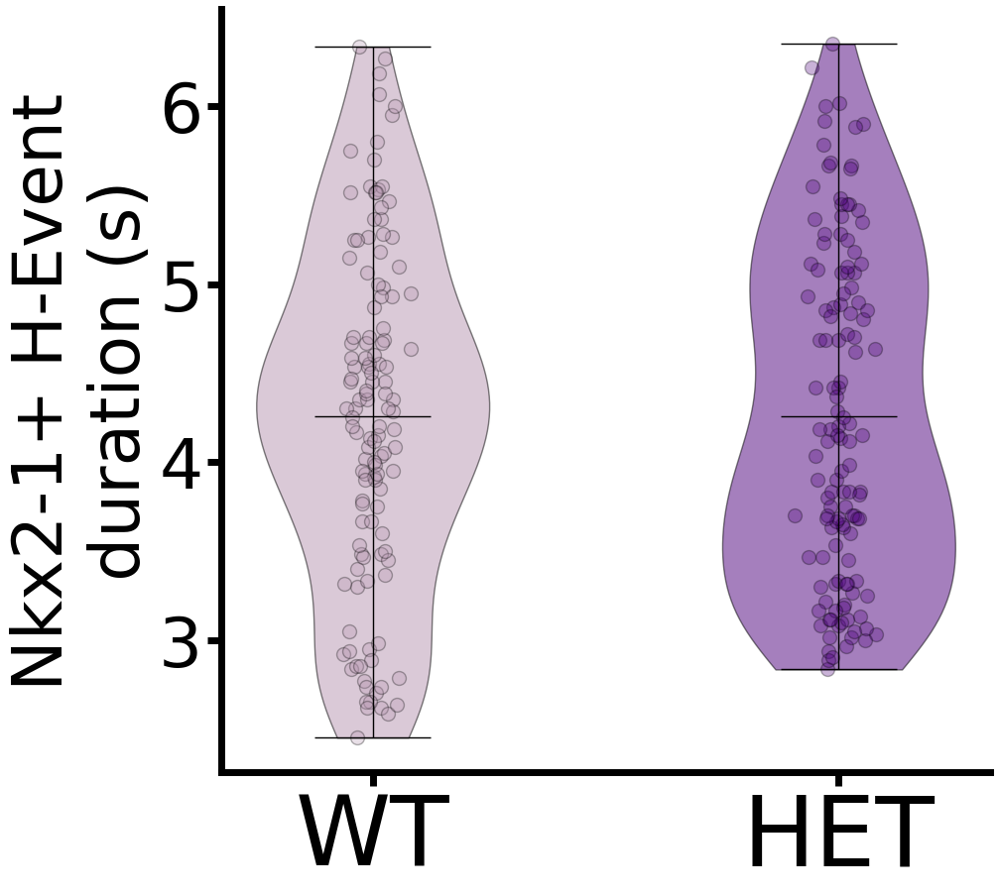

In [ ]:
WT = []
HET = []
KO = []

for age in range(7,11):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Nkx2.1'].iterrows():
        try:
            tmp = row['Interneurons_events_single_neuron_t001']['Peri_H']
            tmp2 = np.nanmean(row['Interneurons_events_single_neuron_t001']['Peri_H'],2)[:,0]
    
            if row['genotype'] == 'Control':
                WT.append(np.nanmean(tmp[:,0]>tmp2[:,None],1))
  
            if row['genotype'] == 'SSRI':
                HET.append(np.nanmean(tmp[:,0]>tmp2[:,None],1))


        except:
            pass
try:
    WT = (np.hstack(WT)).astype(float)
    HET = (np.hstack(HET)).astype(float)

except:
    pass



#Violin plot of WT,HET,KO
plt.figure(figsize=(10,10))
#Make 0 nans in WT,HET,KO
WT[WT==0] = np.nan
HET[HET==0] = np.nan
#KO[KO==0] = np.nan

WT = WT*10 #SEC
HET = HET*10 #SEC
KO = KO*10 #SEC

violin = plt.violinplot([WT[~np.isnan(WT)]],positions=[1],showmeans=True,showextrema=True)
violin2 = plt.violinplot([HET[~np.isnan(HET)]],positions=[2],showmeans=True,showextrema=True)
#violin3 = plt.violinplot([KO[~np.isnan(KO)]],positions=[3],showmeans=True,showextrema=True)

#set all edges black
for partname in ('cbars','cmins','cmaxes','cmeans'):
    vp = violin[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin2[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)

#color violin plot faces
for pc in violin['bodies']:
    pc.set_facecolor(color4)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin2['bodies']:
    pc.set_facecolor(color5)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)


    
#scatter points on top
plt.scatter(np.ones(WT.shape[0])+np.random.normal(1,0.035,WT.shape[0])-1,WT,color=color4,edgecolors='black',s=100, alpha=0.3)
plt.scatter(np.ones(HET.shape[0])+np.random.normal(1,0.035,HET.shape[0]),HET,color=color5,edgecolors='black',s=100, alpha=0.3)
#plt.scatter(np.ones(KO.shape[0])+np.random.normal(1,0.035,KO.shape[0])+1,KO,color=color3,edgecolors='black',s=100, alpha=0.3)


#Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(fontsize=70)
plt.yticks(fontsize=50)
#Set x and y labels
plt.xticks([1,2],['WT','HET'])
plt.ylabel('Nkx2-1+ H-Event\n duration (s)',fontsize=50)

#Make axis thicker
ax.spines['left'].set_linewidth(5)
ax.spines['bottom'].set_linewidth(5)
#make ticks longer and wider
ax.tick_params(width=5,length=10)

plt.savefig(Save_path + 'SSRI_Nkx2.1_H_event_duration_SERTKO.svg',dpi=300,bbox_inches='tight', format='svg')

#Print lengths of each genotype
print('WT: ' + str(WT.shape[0]))
print('HET: ' + str(HET.shape[0]))
#print('KO: ' + str(KO.shape[0]))
#Shapiro test
print(stats.shapiro(WT[~np.isnan(WT)]))
#Krustal wallis
print(stats.mannwhitneyu(WT[~np.isnan(WT)],HET[~np.isnan(HET)]))
#Tukey
#print(tukey.MultiComparison(np.hstack((WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)])),np.hstack((np.ones(WT[~np.isnan(WT)].shape[0]),np.ones(HET[~np.isnan(HET)].shape[0])+1,np.ones(KO[~np.isnan(KO)].shape[0])+2))).tukeyhsd().summary())




## Whisker responses VIP/Nkx2-1

### SERTKO

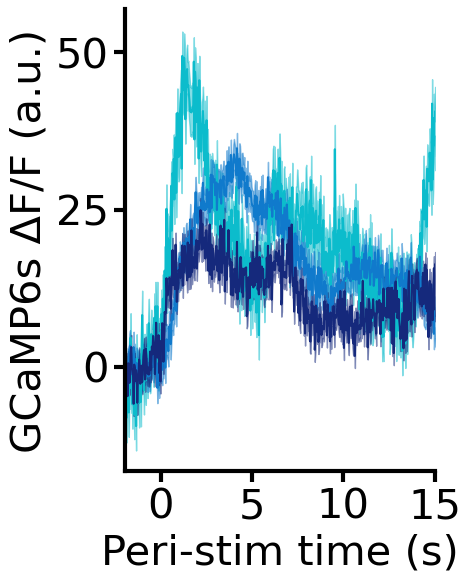

In [381]:
#Airpuff P11-13
WT = []
HET = []
KO = []
df['Whisker_response_trace_cropped'] = None
for age in range(7,11):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Vip'].iterrows():
        try:
            tmp = np.nanmean(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],1)

    
            if row['genotype'] == 'WT':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'HET':
                HET.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'KO':
                KO.append(tmp)#/tmp[:,1])

        except:
            pass
#try:
WT = np.vstack(WT)
HET = np.vstack(HET)
KO = np.vstack(KO)
#except:
#    pass

WT = WT - np.nanmean(WT[:,0:60],1)[:,None]
HET = HET - np.nanmean(HET[:,0:60],1)[:,None]
KO = KO - np.nanmean(KO[:,0:60],1)[:,None]

plt.figure(figsize=(4,6))
plt.plot(np.nanmean(WT,0),color=color1)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(WT,0)-np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),np.nanmean(WT,0)+np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),color=color1,alpha=0.5)
plt.plot(np.nanmean(HET,0),color=color2)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(HET,0)-np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),np.nanmean(HET,0)+np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),color=color2,alpha=0.5)
plt.plot(np.nanmean(KO,0),color=color3)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(KO,0)-np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),np.nanmean(KO,0)+np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),color=color3,alpha=0.5)

# REMOVE TOP AND RIGHT SPINES
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(np.arange(60,661,150), np.arange(0,21,5),fontsize=30)
plt.yticks(fontsize=30)
#Set x and y labels
plt.xlabel('Peri-stim time (s)',fontsize=30)
plt.ylabel('GCaMP6s ΔF/F (a.u.)',fontsize=30)
#Make axis thicker
ax.spines['left'].set_linewidth(3.0)
ax.spines['bottom'].set_linewidth(3.0)
#make ticks longer and wider
ax.tick_params(width=3.0,length=8.0)
plt.xlim([0,510])




#save figure
plt.savefig(Save_path + 'VIP_th_SERT_Whisker_response_trace.svg',dpi=300,bbox_inches='tight', format='svg')


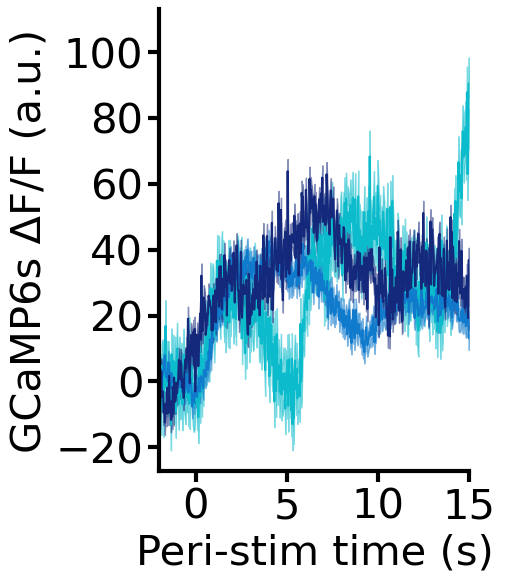

In [36]:
#Airpuff P11-13
WT = []
HET = []
KO = []
df['Whisker_response_trace_cropped'] = None
for age in range(7,9):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Vip'].iterrows():
        try:
            tmp = np.nanmean(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],1)

    
            if row['genotype'] == 'WT':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'HET':
                HET.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'KO':
                KO.append(tmp)#/tmp[:,1])

        except:
            pass
#try:
WT = np.vstack(WT)
HET = np.vstack(HET)
KO = np.vstack(KO)
#except:
#    pass

WT = WT - np.nanmean(WT[:,0:60],1)[:,None]
HET = HET - np.nanmean(HET[:,0:60],1)[:,None]
KO = KO - np.nanmean(KO[:,0:60],1)[:,None]

plt.figure(figsize=(4,6))
plt.plot(np.nanmean(WT,0),color=color1)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(WT,0)-np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),np.nanmean(WT,0)+np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),color=color1,alpha=0.5)
plt.plot(np.nanmean(HET,0),color=color2)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(HET,0)-np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),np.nanmean(HET,0)+np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),color=color2,alpha=0.5)
plt.plot(np.nanmean(KO,0),color=color3)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(KO,0)-np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),np.nanmean(KO,0)+np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),color=color3,alpha=0.5)

# REMOVE TOP AND RIGHT SPINES
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(np.arange(60,661,150), np.arange(0,21,5),fontsize=30)
plt.yticks(fontsize=30)
#Set x and y labels
plt.xlabel('Peri-stim time (s)',fontsize=30)
plt.ylabel('GCaMP6s ΔF/F (a.u.)',fontsize=30)
#Make axis thicker
ax.spines['left'].set_linewidth(3.0)
ax.spines['bottom'].set_linewidth(3.0)
#make ticks longer and wider
ax.tick_params(width=3.0,length=8.0)
plt.xlim([0,510])




#save figure
plt.savefig(Save_path + 'VIP_th_SERT_Whisker_response_trace222.svg',dpi=300,bbox_inches='tight', format='svg')


(0.0, 510.0)

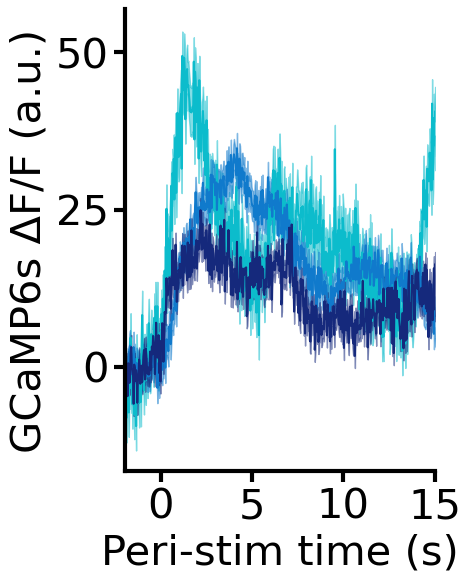

In [519]:
#Airpuff P11-13
WT = []
HET = []
KO = []
df['Whisker_response_trace_cropped'] = None
for age in range(7,11):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Vip'].iterrows():
        try:
            tmp = row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660]

            tmp = np.nanmean(tmp - np.nanmean(tmp[:,:,:60],2)[:,:,None],1)


    
            if row['genotype'] == 'WT':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'HET':
                HET.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'KO':
                KO.append(tmp)#/tmp[:,1])

        except:
            pass
#try:
WT = np.vstack(WT)
HET = np.vstack(HET)
KO = np.vstack(KO)
#except:
#    pass

WT = WT# - np.nanmean(WT[:,0:60],1)[:,None]
HET = HET# - np.nanmean(HET[:,0:60],1)[:,None]
KO = KO# - np.nanmean(KO[:,0:60],1)[:,None]

plt.figure(figsize=(4,6))
plt.plot(np.nanmean(WT,0),color=color1)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(WT,0)-np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),np.nanmean(WT,0)+np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),color=color1,alpha=0.5)
plt.plot(np.nanmean(HET,0),color=color2)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(HET,0)-np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),np.nanmean(HET,0)+np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),color=color2,alpha=0.5)
plt.plot(np.nanmean(KO,0),color=color3)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(KO,0)-np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),np.nanmean(KO,0)+np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),color=color3,alpha=0.5)

# REMOVE TOP AND RIGHT SPINES
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(np.arange(60,661,150), np.arange(0,21,5),fontsize=30)
plt.yticks(fontsize=30)
#Set x and y labels
plt.xlabel('Peri-stim time (s)',fontsize=30)
plt.ylabel('GCaMP6s ΔF/F (a.u.)',fontsize=30)
#Make axis thicker
ax.spines['left'].set_linewidth(3.0)
ax.spines['bottom'].set_linewidth(3.0)
#make ticks longer and wider
ax.tick_params(width=3.0,length=8.0)
plt.xlim([0,510])




#save figure
#plt.savefig(Save_path + 'VIP_th_SERT_Whisker_response_trace.svg',dpi=300,bbox_inches='tight', format='svg')


WT: 125
HET: 435
KO: 272
ShapiroResult(statistic=0.7883848547935486, pvalue=3.841863459308481e-12)
KruskalResult(statistic=24.995328556220628, pvalue=3.735367770945688e-06)
 Multiple Comparison of Means - Tukey HSD, FWER=0.05  
group1 group2 meandiff p-adj   lower    upper   reject
------------------------------------------------------
   1.0    2.0  12.4619 0.9612 -96.7655 121.6894  False
   1.0    3.0 126.6592 0.0289  10.3556 242.9628   True
   2.0    3.0 114.1973 0.0038  30.9983 197.3963   True
------------------------------------------------------


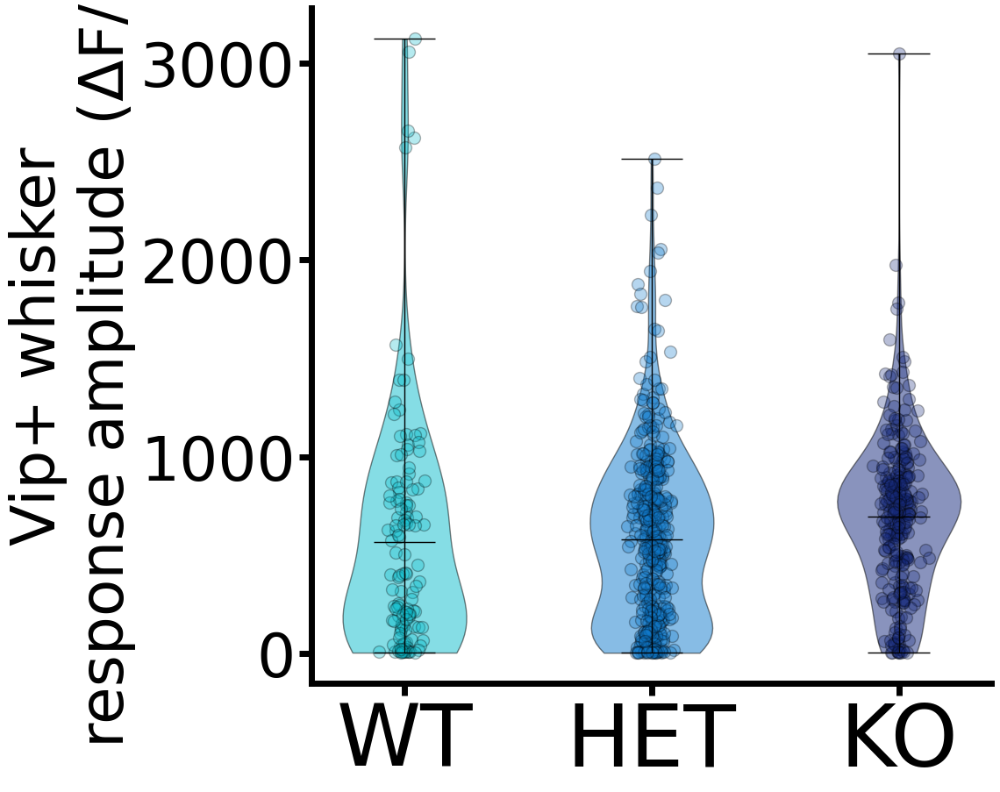

In [380]:
WT = []
HET = []
KO = []

for age in range(7,12):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Vip'].iterrows():
        try:
            tmp = np.nanmean(np.nanmax(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],2),1)
            
    
            if row['genotype'] == 'WT':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'HET':
                HET.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'KO':
                KO.append(tmp)#/tmp[:,1])

        except:
            pass
try:
    WT = (np.hstack(WT)).astype(float)
    HET = (np.hstack(HET)).astype(float)
    KO = (np.hstack(KO)).astype(float)
except:
    pass



#Violin plot of WT,HET,KO
plt.figure(figsize=(10,10))
#Make 0 nans in WT,HET,KO
WT[WT==0] = np.nan
HET[HET==0] = np.nan
KO[KO==0] = np.nan

violin = plt.violinplot([WT[~np.isnan(WT)]],positions=[1],showmeans=True,showextrema=True)
violin2 = plt.violinplot([HET[~np.isnan(HET)]],positions=[2],showmeans=True,showextrema=True)
violin3 = plt.violinplot([KO[~np.isnan(KO)]],positions=[3],showmeans=True,showextrema=True)

#set all edges black
for partname in ('cbars','cmins','cmaxes','cmeans'):
    vp = violin[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin2[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin3[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
#color violin plot faces
for pc in violin['bodies']:
    pc.set_facecolor(color1)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin2['bodies']:
    pc.set_facecolor(color2)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin3['bodies']:
    pc.set_facecolor(color3)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)

    
#scatter points on top
plt.scatter(np.ones(WT.shape[0])+np.random.normal(1,0.035,WT.shape[0])-1,WT,color=color1,edgecolors='black',s=100, alpha=0.3)
plt.scatter(np.ones(HET.shape[0])+np.random.normal(1,0.035,HET.shape[0]),HET,color=color2,edgecolors='black',s=100, alpha=0.3)
plt.scatter(np.ones(KO.shape[0])+np.random.normal(1,0.035,KO.shape[0])+1,KO,color=color3,edgecolors='black',s=100, alpha=0.3)


#Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(fontsize=70)
plt.yticks(fontsize=50)
#Set x and y labels
plt.xticks([1,2,3],['WT','HET','KO'])
plt.ylabel('Vip+ whisker\nresponse amplitude (ΔF/F)',fontsize=50)

#Make axis thicker
ax.spines['left'].set_linewidth(5)
ax.spines['bottom'].set_linewidth(5)
#make ticks longer and wider
ax.tick_params(width=5,length=10)

plt.savefig(Save_path + 'VIP_whisker_response_th_SERT_SERTKO_amplitude.svg',dpi=300,bbox_inches='tight', format='svg')

#Print lengths of each genotype
print('WT: ' + str(WT.shape[0]))
print('HET: ' + str(HET.shape[0]))
print('KO: ' + str(KO.shape[0]))
#Shapiro test
print(stats.shapiro(WT[~np.isnan(WT)]))
#Krustal wallis
print(stats.kruskal(WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)]))
#Tukey
print(tukey.MultiComparison(np.hstack((WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)])),np.hstack((np.ones(WT[~np.isnan(WT)].shape[0]),np.ones(HET[~np.isnan(HET)].shape[0])+1,np.ones(KO[~np.isnan(KO)].shape[0])+2))).tukeyhsd().summary())




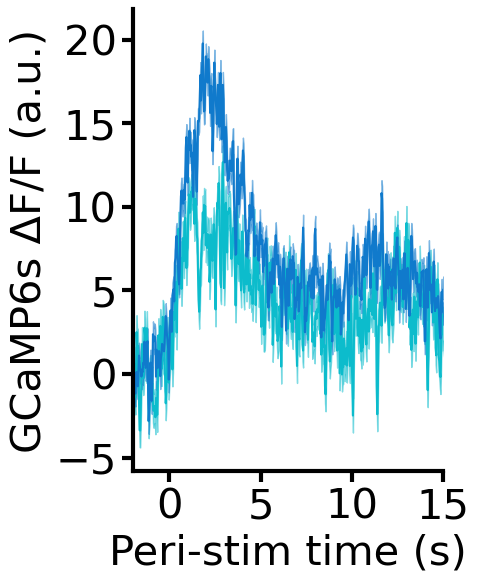

In [66]:
#Airpuff P11-13
WT = []
HET = []
KO = []
df['Whisker_response_trace_cropped'] = None
for age in range(7,11):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Nkx2.1'].iterrows():
        try:
            tmp = np.nanmedian(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],1)

    
            if row['genotype'] == 'WT':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'HET':
                HET.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'KO':
                KO.append(tmp)#/tmp[:,1])

        except:
            pass
#try:
WT = np.vstack(WT)
HET = np.vstack(HET)
#KO = np.vstack(KO)
#except:
#    pass

WT = WT - np.nanmean(WT[:,0:30],1)[:,None]
HET = HET - np.nanmean(HET[:,0:30],1)[:,None]

#savgol
import scipy.signal as signal

WT = signal.savgol_filter(WT, 5, 3, axis=1)
HET = signal.savgol_filter(HET, 5, 3, axis=1)
#KO = KO - np.nanmean(KO[:,0:60],1)[:,None]

plt.figure(figsize=(4,6))
plt.plot(np.nanmean(WT,0),color=color1)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(WT,0)-np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),np.nanmean(WT,0)+np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),color=color1,alpha=0.5)
plt.plot(np.nanmean(HET,0),color=color2)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(HET,0)-np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),np.nanmean(HET,0)+np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),color=color2,alpha=0.5)
#plt.plot(np.nanmean(KO,0),color=color3)
#sem shade
#plt.fill_between(np.arange(660),np.nanmean(KO,0)-np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),np.nanmean(KO,0)+np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),color=color3,alpha=0.5)

# REMOVE TOP AND RIGHT SPINES
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(np.arange(60,661,150), np.arange(0,21,5),fontsize=30)
plt.yticks(fontsize=30)
#Set x and y labels
plt.xlabel('Peri-stim time (s)',fontsize=30)
plt.ylabel('GCaMP6s ΔF/F (a.u.)',fontsize=30)
#Make axis thicker
ax.spines['left'].set_linewidth(3.0)
ax.spines['bottom'].set_linewidth(3.0)
#make ticks longer and wider
ax.tick_params(width=3.0,length=8.0)
plt.xlim([0,510])




plt.savefig(Save_path + 'Nkx2-1_th_SERT_Whisker_response_trace22.svg',dpi=300,bbox_inches='tight', format='svg')


WT: 254
HET: 322
ShapiroResult(statistic=0.9292267560958862, pvalue=1.1490458584617613e-09)
MannwhitneyuResult(statistic=47184.0, pvalue=0.001516183040558594)


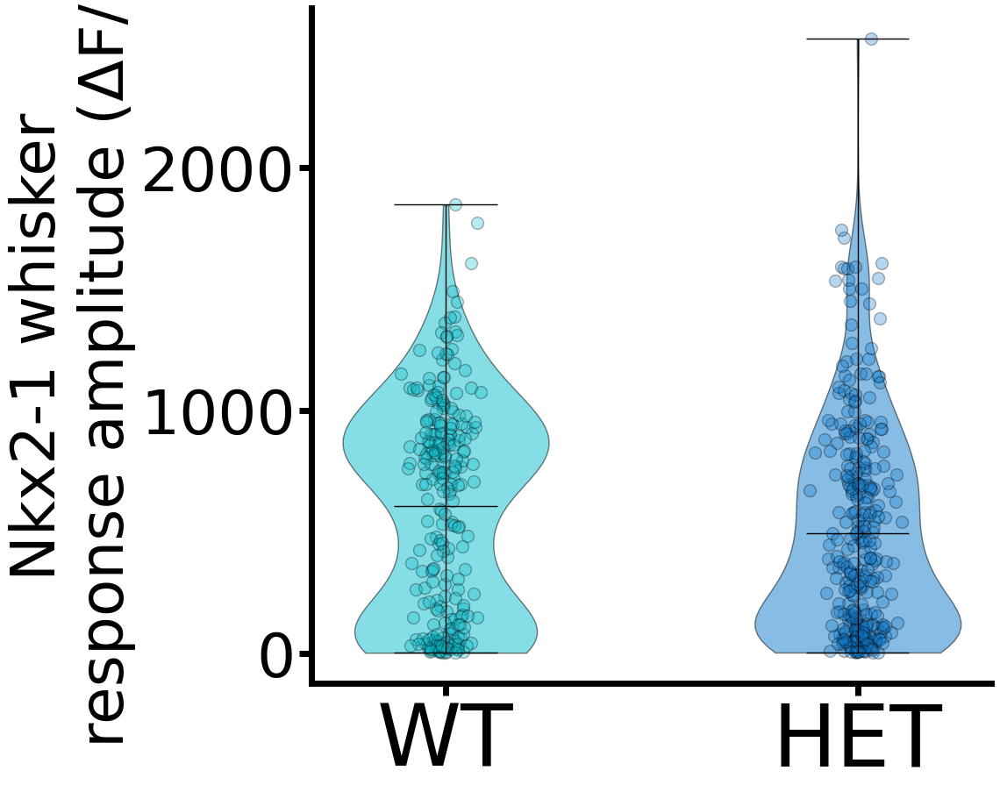

In [378]:
WT = []
HET = []
KO = []

for age in range(7,12):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Nkx2.1'].iterrows():
        try:
            tmp = np.nanmean(np.nanmax(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],2),1)
            
    
            if row['genotype'] == 'WT':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'HET':
                HET.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'KO':
                KO.append(tmp)#/tmp[:,1])

        except:
            pass
try:
    WT = (np.hstack(WT)).astype(float)
    HET = (np.hstack(HET)).astype(float)
    #KO = (np.hstack(KO)).astype(float)
except:
    pass



#Violin plot of WT,HET,KO
plt.figure(figsize=(10,10))
#Make 0 nans in WT,HET,KO
WT[WT==0] = np.nan
HET[HET==0] = np.nan
#KO[KO==0] = np.nan

violin = plt.violinplot([WT[~np.isnan(WT)]],positions=[1],showmeans=True,showextrema=True)
violin2 = plt.violinplot([HET[~np.isnan(HET)]],positions=[2],showmeans=True,showextrema=True)
#violin3 = plt.violinplot([KO[~np.isnan(KO)]],positions=[3],showmeans=True,showextrema=True)

#set all edges black
for partname in ('cbars','cmins','cmaxes','cmeans'):
    vp = violin[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin2[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin3[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
#color violin plot faces
for pc in violin['bodies']:
    pc.set_facecolor(color1)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin2['bodies']:
    pc.set_facecolor(color2)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin3['bodies']:
    pc.set_facecolor(color3)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)

    
#scatter points on top
plt.scatter(np.ones(WT.shape[0])+np.random.normal(1,0.035,WT.shape[0])-1,WT,color=color1,edgecolors='black',s=100, alpha=0.3)
plt.scatter(np.ones(HET.shape[0])+np.random.normal(1,0.035,HET.shape[0]),HET,color=color2,edgecolors='black',s=100, alpha=0.3)
#plt.scatter(np.ones(KO.shape[0])+np.random.normal(1,0.035,KO.shape[0])+1,KO,color=color3,edgecolors='black',s=100, alpha=0.3)


#Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(fontsize=70)
plt.yticks(fontsize=50)
#Set x and y labels
plt.xticks([1,2],['WT','HET'])
plt.ylabel('Nkx2-1 whisker\nresponse amplitude (ΔF/F)',fontsize=50)

#Make axis thicker
ax.spines['left'].set_linewidth(5)
ax.spines['bottom'].set_linewidth(5)
#make ticks longer and wider
ax.tick_params(width=5,length=10)

plt.savefig(Save_path + 'Nkx2-1_th_SERT_Whisker_response_amplitude.svg',dpi=300,bbox_inches='tight', format='svg')

#Print lengths of each genotype
print('WT: ' + str(WT.shape[0]))
print('HET: ' + str(HET.shape[0]))
#print('KO: ' + str(KO.shape[0]))
#Shapiro test
print(stats.shapiro(WT[~np.isnan(WT)]))
#Krustal wallis
#mannwhitneyu
print(stats.mannwhitneyu(WT[~np.isnan(WT)],HET[~np.isnan(HET)]))
#print(stats.kruskal(WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)]))
#Tukey
#print(tukey.MultiComparison(np.hstack((WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)])),np.hstack((np.ones(WT[~np.isnan(WT)].shape[0]),np.ones(HET[~np.isnan(HET)].shape[0])+1,np.ones(KO[~np.isnan(KO)].shape[0])+2))).tukeyhsd().summary())




C:\Users\gabrielos\AppData\Local\Temp\ipykernel_7316\1000560680.py:10: RuntimeWarning: Mean of empty slice
  tmp = np.nanmean(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:180],1)
C:\Users\gabrielos\AppData\Local\Temp\ipykernel_7316\1000560680.py:30: RuntimeWarning: Mean of empty slice
  HET = HET - np.nanmean(HET[:,0:50],1)[:,None]


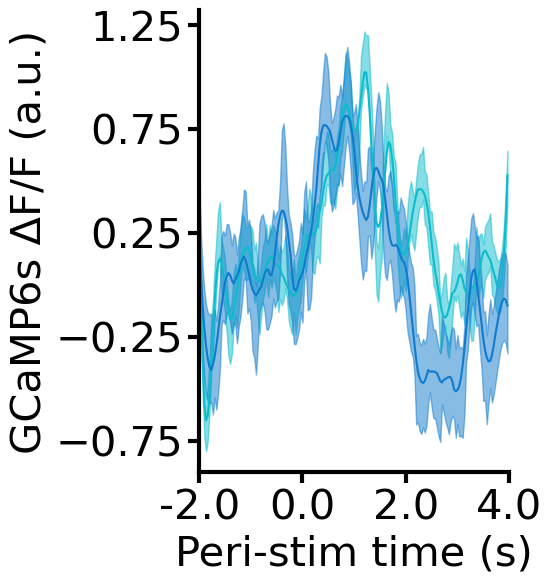

In [81]:
#Airpuff P11-13
WT = []
HET = []
KO = []
df['Whisker_response_trace_cropped'] = None
for age in range(11,20):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Nkx2.1'].iterrows():
        try:
            tmp = np.nanmean(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:180],1)

    
            if row['genotype'] == 'WT':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'HET':
                HET.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'KO':
                KO.append(tmp)#/tmp[:,1])

        except:
            pass
#try:
WT = np.vstack(WT)
HET = np.vstack(HET)
#KO = np.vstack(KO)
#except:
#    pass

WT = WT - np.nanmean(WT[:,0:50],1)[:,None]
HET = HET - np.nanmean(HET[:,0:50],1)[:,None]
#KO = KO - np.nanmean(KO[:,0:60],1)[:,None]

#remove rows that have any nans
WT = WT[~np.isnan(WT).any(1)]
HET = HET[~np.isnan(HET).any(1)]

#savgol
import scipy.signal as signal

WT = signal.savgol_filter(WT, 15, 3, axis=1)
HET = signal.savgol_filter(HET, 15, 3, axis=1)


plt.figure(figsize=(4,6))
plt.plot(signal.savgol_filter(np.nanmean(WT,0),15,3),color=color1)
#sem shade
plt.fill_between(np.arange(180),np.nanmean(WT,0)-np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),np.nanmean(WT,0)+np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),color=color1,alpha=0.5)
plt.plot(signal.savgol_filter(np.nanmean(HET,0),15,3),color=color2)
#sem shade
plt.fill_between(np.arange(180),np.nanmean(HET,0)-np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),np.nanmean(HET,0)+np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),color=color2,alpha=0.5)
#plt.plot(np.nanmean(KO,0),color=color3)
#sem shade
#plt.fill_between(np.arange(660),np.nanmean(KO,0)-np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),np.nanmean(KO,0)+np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),color=color3,alpha=0.5)

# REMOVE TOP AND RIGHT SPINES
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(np.arange(0,211,60), np.arange(-2,4.1,2),fontsize=30)
plt.yticks(np.arange(-0.75,1.30, 0.5),fontsize=30)

#Set x and y labels
plt.xlabel('Peri-stim time (s)',fontsize=30)
plt.ylabel('GCaMP6s ΔF/F (a.u.)',fontsize=30)
#Make axis thicker
ax.spines['left'].set_linewidth(3.0)
ax.spines['bottom'].set_linewidth(3.0)
#make ticks longer and wider
ax.tick_params(width=3.0,length=8.0)
plt.xlim([0,180])




#save figure
plt.savefig(Save_path + 'Nkx2-1_adult_SERT_SERTKO_whisker_response_22s_p11-13222.svg',dpi=300)


C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\4063133580.py:9: RuntimeWarning: Mean of empty slice
  tmp = np.nanmean(np.nanmax(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],2),1)


WT: 149
HET: 373
ShapiroResult(statistic=0.6270739436149597, pvalue=7.226932255268606e-18)
MannwhitneyuResult(statistic=22807.0, pvalue=0.033513171991910985)


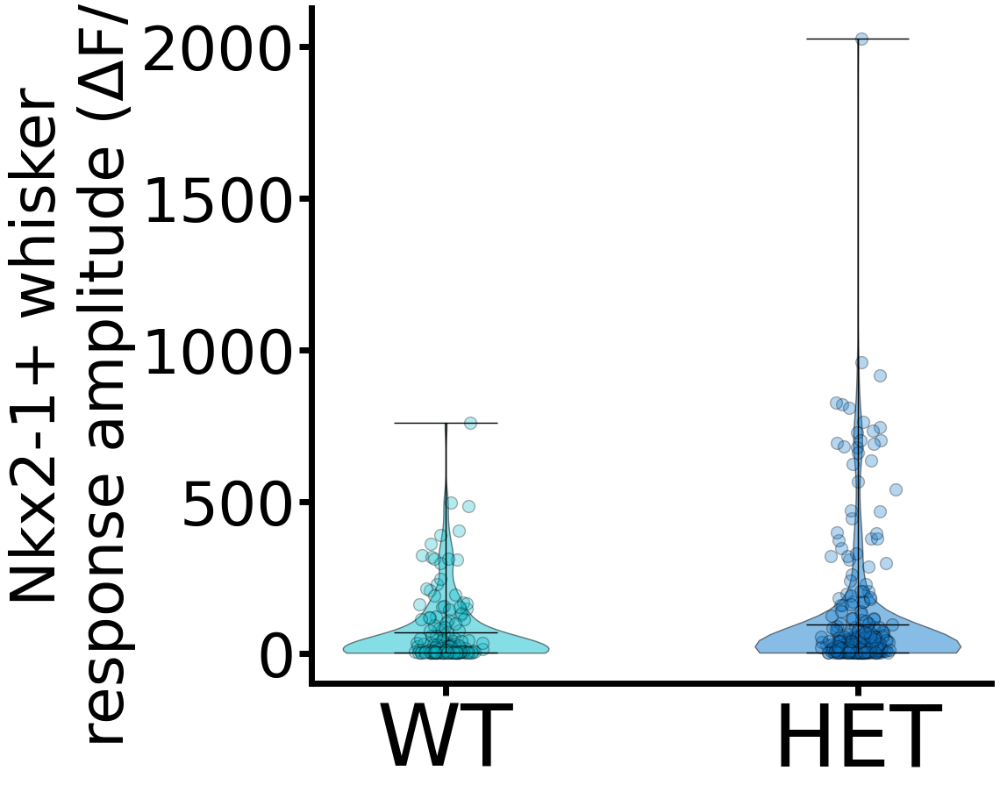

In [375]:
WT = []
HET = []
KO = []

for age in range(11,20):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Nkx2.1'].iterrows():
        try:
            tmp = np.nanmean(np.nanmax(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],2),1)
            
    
            if row['genotype'] == 'WT':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'HET':
                HET.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'KO':
                KO.append(tmp)#/tmp[:,1])

        except:
            pass
try:
    WT = (np.hstack(WT)).astype(float)
    HET = (np.hstack(HET)).astype(float)
    #KO = (np.hstack(KO)).astype(float)
except:
    pass



#Violin plot of WT,HET,KO
plt.figure(figsize=(10,10))
#Make 0 nans in WT,HET,KO
WT[WT==0] = np.nan
HET[HET==0] = np.nan
#KO[KO==0] = np.nan

violin = plt.violinplot([WT[~np.isnan(WT)]],positions=[1],showmeans=True,showextrema=True)
violin2 = plt.violinplot([HET[~np.isnan(HET)]],positions=[2],showmeans=True,showextrema=True)
#violin3 = plt.violinplot([KO[~np.isnan(KO)]],positions=[3],showmeans=True,showextrema=True)

#set all edges black
for partname in ('cbars','cmins','cmaxes','cmeans'):
    vp = violin[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin2[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin3[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
#color violin plot faces
for pc in violin['bodies']:
    pc.set_facecolor(color1)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin2['bodies']:
    pc.set_facecolor(color2)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin3['bodies']:
    pc.set_facecolor(color3)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)

    
#scatter points on top
plt.scatter(np.ones(WT.shape[0])+np.random.normal(1,0.035,WT.shape[0])-1,WT,color=color1,edgecolors='black',s=100, alpha=0.3)
plt.scatter(np.ones(HET.shape[0])+np.random.normal(1,0.035,HET.shape[0]),HET,color=color2,edgecolors='black',s=100, alpha=0.3)
#plt.scatter(np.ones(KO.shape[0])+np.random.normal(1,0.035,KO.shape[0])+1,KO,color=color3,edgecolors='black',s=100, alpha=0.3)


#Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(fontsize=70)
plt.yticks(fontsize=50)
#Set x and y labels
plt.xticks([1,2],['WT','HET'])
plt.ylabel('Nkx2-1+ whisker\nresponse amplitude (ΔF/F)',fontsize=50)

#Make axis thicker
ax.spines['left'].set_linewidth(5)
ax.spines['bottom'].set_linewidth(5)
#make ticks longer and wider
ax.tick_params(width=5,length=10)

plt.savefig(Save_path + 'SERTKO_Adult_SERT_Nkx2-1VIP_H_event_amplitude.svg',dpi=300,bbox_inches='tight', format='svg')

#Print lengths of each genotype
print('WT: ' + str(WT.shape[0]))
print('HET: ' + str(HET.shape[0]))
#print('KO: ' + str(KO.shape[0]))
#Shapiro test
print(stats.shapiro(WT[~np.isnan(WT)]))
#Krustal wallis
#mannwhitneyu
print(stats.mannwhitneyu(WT[~np.isnan(WT)],HET[~np.isnan(HET)]))
#print(stats.kruskal(WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)]))
#Tukey
#print(tukey.MultiComparison(np.hstack((WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)])),np.hstack((np.ones(WT[~np.isnan(WT)].shape[0]),np.ones(HET[~np.isnan(HET)].shape[0])+1,np.ones(KO[~np.isnan(KO)].shape[0])+2))).tukeyhsd().summary())




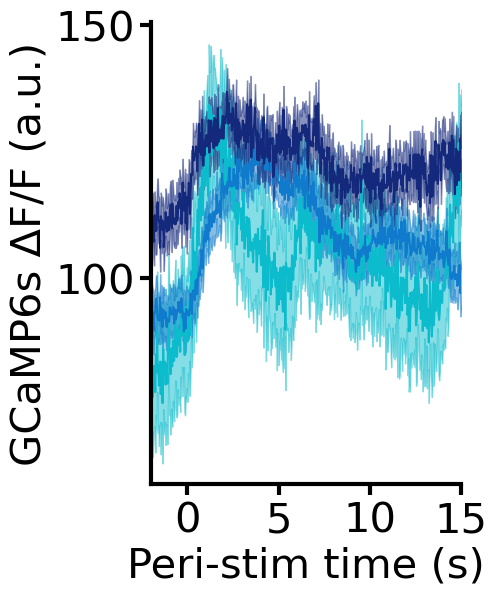

In [509]:
#Airpuff P11-13
WT = []
HET = []
KO = []
df['Whisker_response_trace_cropped'] = None
for age in range(7,11):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Vip'].iterrows():
        try:
            tmp = np.nanmean(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:10,:660],1)

    
            if row['genotype'] == 'WT':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'HET':
                HET.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'KO':
                KO.append(tmp)#/tmp[:,1])

        except:
            pass
#try:
WT = np.vstack(WT)
HET = np.vstack(HET)
KO = np.vstack(KO)
#except:
#    pass

WT = WT #- np.nanmean(WT[:,0:60],1)[:,None]
HET = HET# - np.nanmean(HET[:,0:60],1)[:,None]
KO = KO #- np.nanmean(KO[:,0:60],1)[:,None]

plt.figure(figsize=(4,6))
plt.plot(np.nanmean(WT,0),color=color1)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(WT,0)-np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),np.nanmean(WT,0)+np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),color=color1,alpha=0.5)
plt.plot(np.nanmean(HET,0),color=color2)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(HET,0)-np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),np.nanmean(HET,0)+np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),color=color2,alpha=0.5)
plt.plot(np.nanmean(KO,0),color=color3)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(KO,0)-np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),np.nanmean(KO,0)+np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),color=color3,alpha=0.5)

# REMOVE TOP AND RIGHT SPINES
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(np.arange(60,661,150), np.arange(0,21,5),fontsize=30)
plt.yticks(fontsize=30)
#Set x and y labels
plt.xlabel('Peri-stim time (s)',fontsize=30)
plt.ylabel('GCaMP6s ΔF/F (a.u.)',fontsize=30)
#Make axis thicker
ax.spines['left'].set_linewidth(3.0)
ax.spines['bottom'].set_linewidth(3.0)
#make ticks longer and wider
ax.tick_params(width=3.0,length=8.0)
plt.xlim([0,510])




#save figure
plt.savefig(Save_path + 'SERTKO_Th_SERT_VIP_whisker_response_22s_p11-13_2.svg',dpi=300)


C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\2457698304.py:10: RuntimeWarning: Mean of empty slice
  tmp = np.nanmean(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],1)
C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\2457698304.py:30: RuntimeWarning: Mean of empty slice
  HET = HET - np.nanmean(HET[:,0:60],1)[:,None]
C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\2457698304.py:39: RuntimeWarning: Mean of empty slice
  plt.fill_between(np.arange(660),np.nanmean(HET,0)-np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),np.nanmean(HET,0)+np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),color=color2,alpha=0.5)


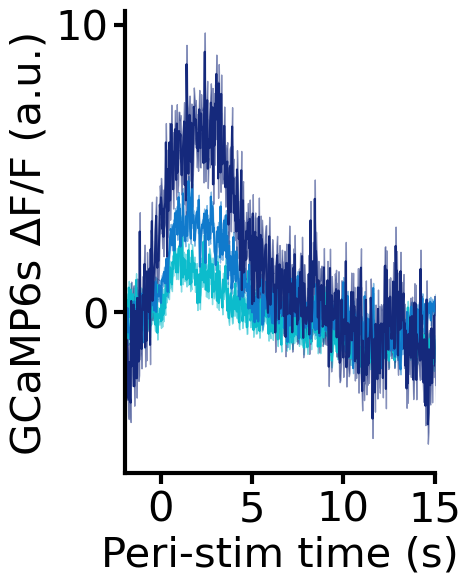

In [ ]:
#Airpuff P11-13
WT = []
HET = []
KO = []
df['Whisker_response_trace_cropped'] = None
for age in range(11,20):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Vip'].iterrows():
        try:
            tmp = np.nanmean(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],1)

    
            if row['genotype'] == 'WT':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'HET':
                HET.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'KO':
                KO.append(tmp)#/tmp[:,1])

        except:
            pass
#try:
WT = np.vstack(WT)
HET = np.vstack(HET)
KO = np.vstack(KO)
#except:
#    pass

WT = WT - np.nanmean(WT[:,0:60],1)[:,None]
HET = HET - np.nanmean(HET[:,0:60],1)[:,None]
KO = KO - np.nanmean(KO[:,0:60],1)[:,None]

plt.figure(figsize=(4,6))
plt.plot(np.nanmean(WT,0),color=color1)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(WT,0)-np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),np.nanmean(WT,0)+np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),color=color1,alpha=0.5)
plt.plot(np.nanmean(HET,0),color=color2)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(HET,0)-np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),np.nanmean(HET,0)+np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),color=color2,alpha=0.5)
plt.plot(np.nanmean(KO,0),color=color3)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(KO,0)-np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),np.nanmean(KO,0)+np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),color=color3,alpha=0.5)

# REMOVE TOP AND RIGHT SPINES
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(np.arange(60,661,150), np.arange(0,21,5),fontsize=30)
plt.yticks(fontsize=30)
#Set x and y labels
plt.xlabel('Peri-stim time (s)',fontsize=30)
plt.ylabel('GCaMP6s ΔF/F (a.u.)',fontsize=30)
#Make axis thicker
ax.spines['left'].set_linewidth(3.0)
ax.spines['bottom'].set_linewidth(3.0)
#make ticks longer and wider
ax.tick_params(width=3.0,length=8.0)
plt.xlim([0,510])




#save figure
#plt.savefig(Save_path + 'SERTKO_Adult_SERT_VIP_whisker_response_22s_p11-13.svg',dpi=300)


C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\1232517901.py:9: RuntimeWarning: Mean of empty slice
  tmp = np.nanmean(np.nanmax(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],2),1)


WT: 160
HET: 442
KO: 304
ShapiroResult(statistic=0.5818082094192505, pvalue=1.5819012374221758e-19)
KruskalResult(statistic=6.120063155527934, pvalue=0.04688621463479278)
 Multiple Comparison of Means - Tukey HSD, FWER=0.05  
group1 group2 meandiff p-adj   lower    upper   reject
------------------------------------------------------
   1.0    2.0  41.4298 0.1593 -11.6193   94.479  False
   1.0    3.0 165.1657    0.0 109.1271 221.2043   True
   2.0    3.0 123.7359    0.0  80.8449 166.6268   True
------------------------------------------------------


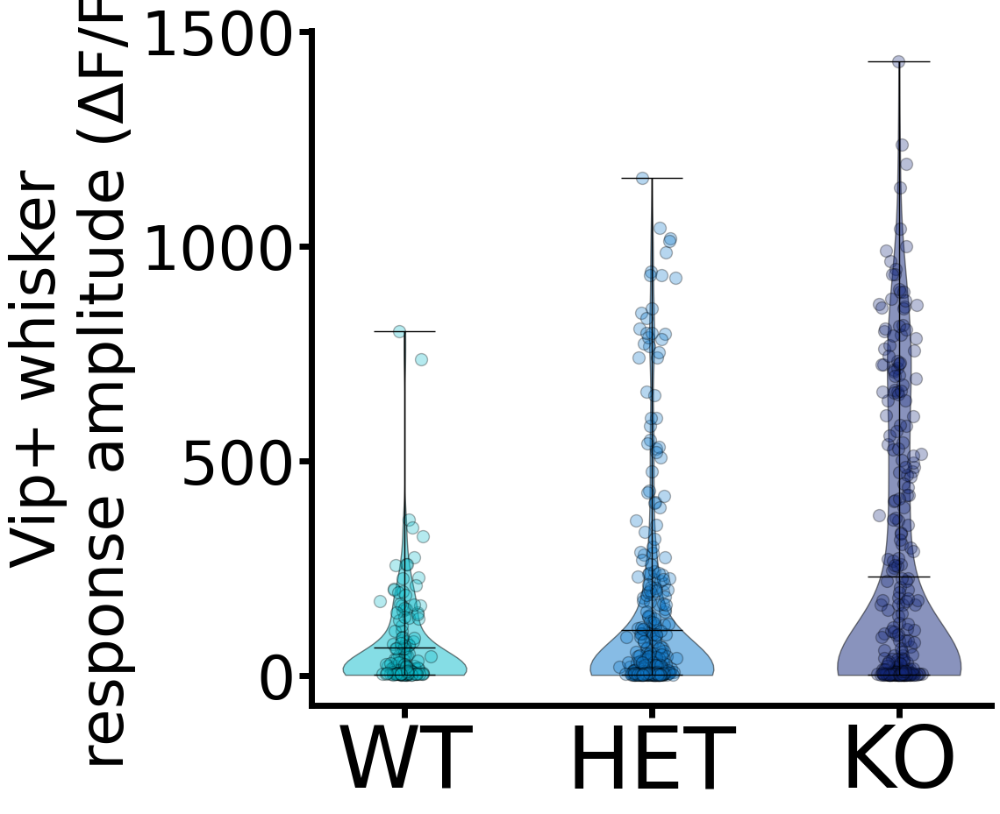

In [373]:
WT = []
HET = []
KO = []

for age in range(11,20):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Vip'].iterrows():
        try:
            tmp = np.nanmean(np.nanmax(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],2),1)
            
    
            if row['genotype'] == 'WT':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'HET':
                HET.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'KO':
                KO.append(tmp)#/tmp[:,1])

        except:
            pass
try:
    WT = (np.hstack(WT)).astype(float)
    HET = (np.hstack(HET)).astype(float)
    KO = (np.hstack(KO)).astype(float)
except:
    pass



#Violin plot of WT,HET,KO
plt.figure(figsize=(10,10))
#Make 0 nans in WT,HET,KO
WT[WT==0] = np.nan
HET[HET==0] = np.nan
KO[KO==0] = np.nan

violin = plt.violinplot([WT[~np.isnan(WT)]],positions=[1],showmeans=True,showextrema=True)
violin2 = plt.violinplot([HET[~np.isnan(HET)]],positions=[2],showmeans=True,showextrema=True)
violin3 = plt.violinplot([KO[~np.isnan(KO)]],positions=[3],showmeans=True,showextrema=True)

#set all edges black
for partname in ('cbars','cmins','cmaxes','cmeans'):
    vp = violin[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin2[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin3[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
#color violin plot faces
for pc in violin['bodies']:
    pc.set_facecolor(color1)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin2['bodies']:
    pc.set_facecolor(color2)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin3['bodies']:
    pc.set_facecolor(color3)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)

    
#scatter points on top
plt.scatter(np.ones(WT.shape[0])+np.random.normal(1,0.035,WT.shape[0])-1,WT,color=color1,edgecolors='black',s=100, alpha=0.3)
plt.scatter(np.ones(HET.shape[0])+np.random.normal(1,0.035,HET.shape[0]),HET,color=color2,edgecolors='black',s=100, alpha=0.3)
plt.scatter(np.ones(KO.shape[0])+np.random.normal(1,0.035,KO.shape[0])+1,KO,color=color3,edgecolors='black',s=100, alpha=0.3)


#Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(fontsize=70)
plt.yticks(fontsize=50)
#Set x and y labels
plt.xticks([1,2,3],['WT','HET','KO'])
plt.ylabel('Vip+ whisker\nresponse amplitude (ΔF/F)',fontsize=50)

#Make axis thicker
ax.spines['left'].set_linewidth(5)
ax.spines['bottom'].set_linewidth(5)
#make ticks longer and wider
ax.tick_params(width=5,length=10)

plt.savefig(Save_path + 'Adult_SERT_VIP_whisker_response.svg',dpi=300,bbox_inches='tight', format='svg')

#Print lengths of each genotype
print('WT: ' + str(WT.shape[0]))
print('HET: ' + str(HET.shape[0]))
print('KO: ' + str(KO.shape[0]))
#Shapiro test
print(stats.shapiro(WT[~np.isnan(WT)]))
#Krustal wallis
print(stats.kruskal(WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)]))
#Tukey
print(tukey.MultiComparison(np.hstack((WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)])),np.hstack((np.ones(WT[~np.isnan(WT)].shape[0]),np.ones(HET[~np.isnan(HET)].shape[0])+1,np.ones(KO[~np.isnan(KO)].shape[0])+2))).tukeyhsd().summary())




### SSRI

#### Nkx.21

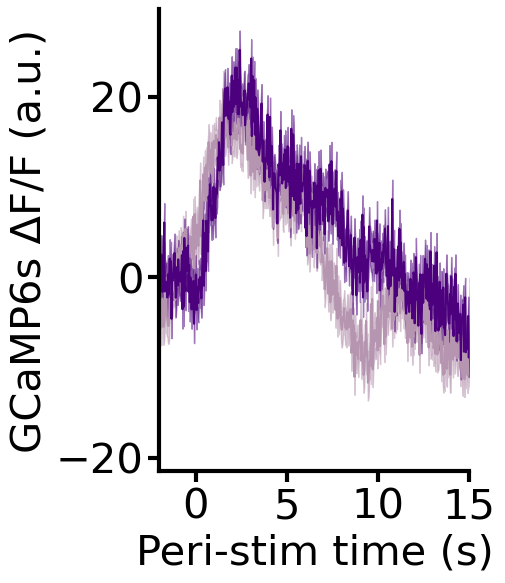

In [382]:
#Airpuff P11-13
WT = []
HET = []
KO = []
df['Whisker_response_trace_cropped'] = None
for age in range(7,11):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Nkx2.1'].iterrows():
        try:
            tmp = np.nanmean(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],1)

    
            if row['genotype'] == 'Control':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'SSRI':
                HET.append(tmp)#/tmp[:,1])

        except:
            pass
#try:
WT = np.vstack(WT)
HET = np.vstack(HET)
#KO = np.vstack(KO)
#except:
#    pass

WT = WT - np.nanmean(WT[:,0:60],1)[:,None]
HET = HET - np.nanmean(HET[:,0:60],1)[:,None]
#KO = KO - np.nanmean(KO[:,0:60],1)[:,None]

plt.figure(figsize=(4,6))
plt.plot(np.nanmean(WT,0),color=color4)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(WT,0)-np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),np.nanmean(WT,0)+np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),color=color4,alpha=0.5)
plt.plot(np.nanmean(HET,0),color=color5)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(HET,0)-np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),np.nanmean(HET,0)+np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),color=color5,alpha=0.5)
#plt.plot(np.nanmean(KO,0),color=color3)
#sem shade
#plt.fill_between(np.arange(660),np.nanmean(KO,0)-np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),np.nanmean(KO,0)+np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),color=color3,alpha=0.5)

# REMOVE TOP AND RIGHT SPINES
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(np.arange(60,661,150), np.arange(0,21,5),fontsize=30)
plt.yticks(fontsize=30)
#Set x and y labels
plt.xlabel('Peri-stim time (s)',fontsize=30)
plt.ylabel('GCaMP6s ΔF/F (a.u.)',fontsize=30)
#Make axis thicker
ax.spines['left'].set_linewidth(3.0)
ax.spines['bottom'].set_linewidth(3.0)
#make ticks longer and wider
ax.tick_params(width=3.0,length=8.0)
plt.xlim([0,510])




plt.savefig(Save_path + 'SSRI_Nkx2-1_th_SERT_Whisker_response_trace.svg',dpi=300,bbox_inches='tight', format='svg')


WT: 274
HET: 198
ShapiroResult(statistic=0.9228466749191284, pvalue=1.04011445289931e-10)
MannwhitneyuResult(statistic=23502.5, pvalue=0.013229187533166075)


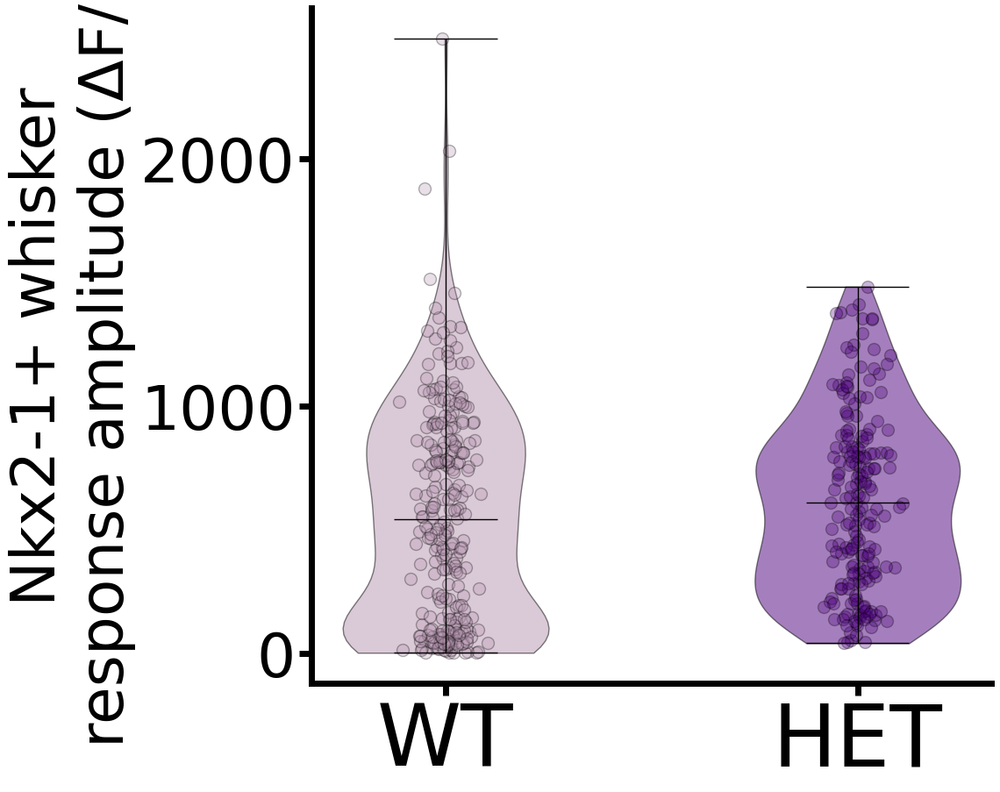

In [383]:
WT = []
HET = []
KO = []

for age in range(7,11):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Nkx2.1'].iterrows():
        try:
            tmp = np.nanmean(np.nanmax(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],2),1)
            
    
            if row['genotype'] == 'Control':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'SSRI':
                HET.append(tmp)#/tmp[:,1])
      

        except:
            pass
try:
    WT = (np.hstack(WT)).astype(float)
    HET = (np.hstack(HET)).astype(float)
    #KO = (np.hstack(KO)).astype(float)
except:
    pass



#Violin plot of WT,HET,KO
plt.figure(figsize=(10,10))
#Make 0 nans in WT,HET,KO
WT[WT==0] = np.nan
HET[HET==0] = np.nan
#KO[KO==0] = np.nan

violin = plt.violinplot([WT[~np.isnan(WT)]],positions=[1],showmeans=True,showextrema=True)
violin2 = plt.violinplot([HET[~np.isnan(HET)]],positions=[2],showmeans=True,showextrema=True)
#violin3 = plt.violinplot([KO[~np.isnan(KO)]],positions=[3],showmeans=True,showextrema=True)

#set all edges black
for partname in ('cbars','cmins','cmaxes','cmeans'):
    vp = violin[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin2[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)

#color violin plot faces
for pc in violin['bodies']:
    pc.set_facecolor(color4)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin2['bodies']:
    pc.set_facecolor(color5)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)


    
#scatter points on top
plt.scatter(np.ones(WT.shape[0])+np.random.normal(1,0.035,WT.shape[0])-1,WT,color=color4,edgecolors='black',s=100, alpha=0.3)
plt.scatter(np.ones(HET.shape[0])+np.random.normal(1,0.035,HET.shape[0]),HET,color=color5,edgecolors='black',s=100, alpha=0.3)
#plt.scatter(np.ones(KO.shape[0])+np.random.normal(1,0.035,KO.shape[0])+1,KO,color=color3,edgecolors='black',s=100, alpha=0.3)


#Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(fontsize=70)
plt.yticks(fontsize=50)
#Set x and y labels
plt.xticks([1,2],['WT','HET'])
plt.ylabel('Nkx2-1+ whisker\nresponse amplitude (ΔF/F)',fontsize=50)

#Make axis thicker
ax.spines['left'].set_linewidth(5)
ax.spines['bottom'].set_linewidth(5)
#make ticks longer and wider
ax.tick_params(width=5,length=10)

plt.savefig(Save_path + 'SSRI_Th_SERT_Nkx2-1_whisker_response_amplitude.svg',dpi=300,bbox_inches='tight', format='svg')

#Print lengths of each genotype
print('WT: ' + str(WT.shape[0]))
print('HET: ' + str(HET.shape[0]))
#print('KO: ' + str(KO.shape[0]))
#Shapiro test
print(stats.shapiro(WT[~np.isnan(WT)]))
#Krustal wallis
#mannwhitneyu
print(stats.mannwhitneyu(WT[~np.isnan(WT)],HET[~np.isnan(HET)]))
#print(stats.kruskal(WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)]))
#Tukey
#print(tukey.MultiComparison(np.hstack((WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)])),np.hstack((np.ones(WT[~np.isnan(WT)].shape[0]),np.ones(HET[~np.isnan(HET)].shape[0])+1,np.ones(KO[~np.isnan(KO)].shape[0])+2))).tukeyhsd().summary())




C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\1823370570.py:10: RuntimeWarning: Mean of empty slice
  tmp = np.nanmean(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],1)


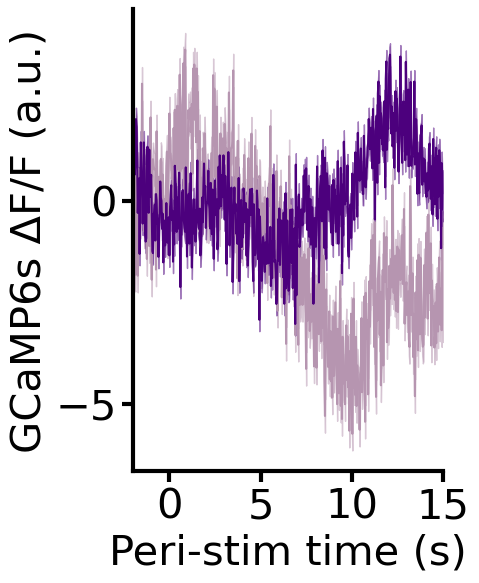

In [384]:
#Airpuff P11-13
WT = []
HET = []
KO = []
df['Whisker_response_trace_cropped'] = None
for age in range(11,20):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Nkx2.1'].iterrows():
        try:
            tmp = np.nanmean(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],1)

    
            if row['genotype'] == 'Control':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'SSRI':
                HET.append(tmp)#/tmp[:,1])

        except:
            pass
#try:
WT = np.vstack(WT)
HET = np.vstack(HET)
#KO = np.vstack(KO)
#except:
#    pass

WT = WT - np.nanmean(WT[:,0:60],1)[:,None]
HET = HET - np.nanmean(HET[:,0:60],1)[:,None]
#KO = KO - np.nanmean(KO[:,0:60],1)[:,None]

plt.figure(figsize=(4,6))
plt.plot(np.nanmean(WT,0),color=color4)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(WT,0)-np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),np.nanmean(WT,0)+np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),color=color4,alpha=0.5)
plt.plot(np.nanmean(HET,0),color=color5)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(HET,0)-np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),np.nanmean(HET,0)+np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),color=color5,alpha=0.5)
#plt.plot(np.nanmean(KO,0),color=color3)
#sem shade
#plt.fill_between(np.arange(660),np.nanmean(KO,0)-np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),np.nanmean(KO,0)+np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),color=color3,alpha=0.5)

# REMOVE TOP AND RIGHT SPINES
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(np.arange(60,661,150), np.arange(0,21,5),fontsize=30)
plt.yticks(fontsize=30)
#Set x and y labels
plt.xlabel('Peri-stim time (s)',fontsize=30)
plt.ylabel('GCaMP6s ΔF/F (a.u.)',fontsize=30)
#Make axis thicker
ax.spines['left'].set_linewidth(3.0)
ax.spines['bottom'].set_linewidth(3.0)
#make ticks longer and wider
ax.tick_params(width=3.0,length=8.0)
plt.xlim([0,510])




plt.savefig(Save_path + 'SSRI_Nkx2-1_adult_SERT_Whisker_response_trace.svg',dpi=300,bbox_inches='tight', format='svg')


C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\1903574535.py:9: RuntimeWarning: Mean of empty slice
  tmp = np.nanmean(np.nanmax(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],2),1)


WT: 260
HET: 243
ShapiroResult(statistic=0.6407655477523804, pvalue=4.764576610394523e-23)
MannwhitneyuResult(statistic=29374.0, pvalue=0.17381170032806081)


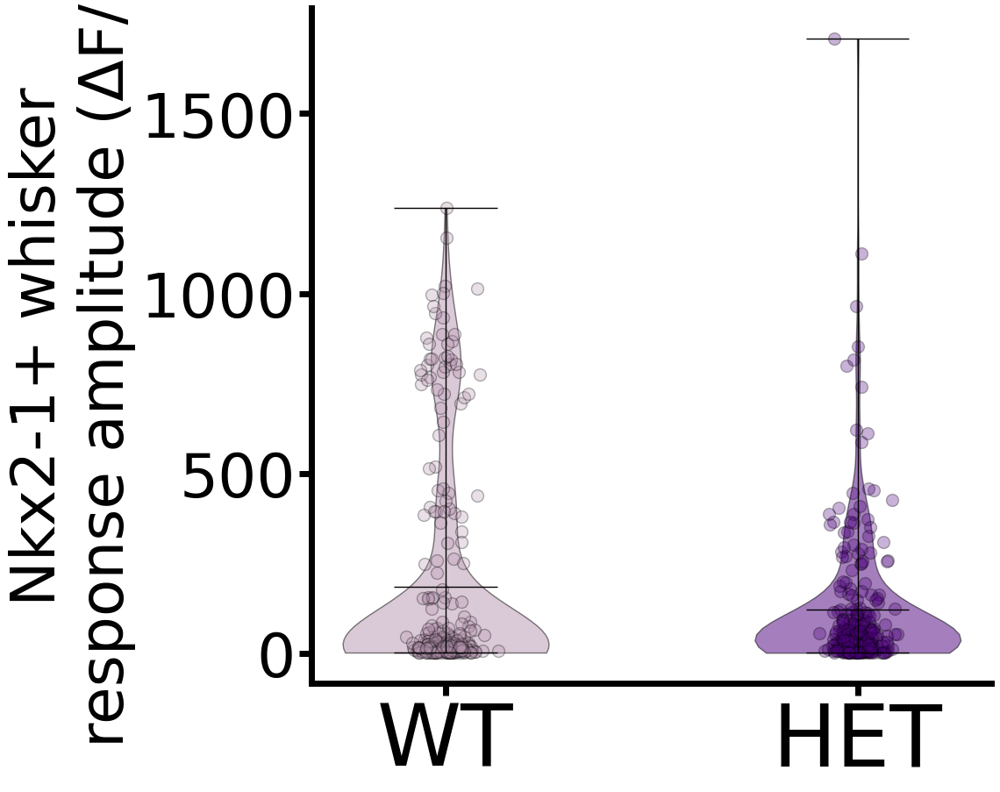

In [385]:
WT = []
HET = []
KO = []

for age in range(11,20):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Nkx2.1'].iterrows():
        try:
            tmp = np.nanmean(np.nanmax(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],2),1)
            
    
            if row['genotype'] == 'Control':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'SSRI':
                HET.append(tmp)#/tmp[:,1])
      

        except:
            pass
try:
    WT = (np.hstack(WT)).astype(float)
    HET = (np.hstack(HET)).astype(float)
    #KO = (np.hstack(KO)).astype(float)
except:
    pass



#Violin plot of WT,HET,KO
plt.figure(figsize=(10,10))
#Make 0 nans in WT,HET,KO
WT[WT==0] = np.nan
HET[HET==0] = np.nan
#KO[KO==0] = np.nan

violin = plt.violinplot([WT[~np.isnan(WT)]],positions=[1],showmeans=True,showextrema=True)
violin2 = plt.violinplot([HET[~np.isnan(HET)]],positions=[2],showmeans=True,showextrema=True)
#violin3 = plt.violinplot([KO[~np.isnan(KO)]],positions=[3],showmeans=True,showextrema=True)

#set all edges black
for partname in ('cbars','cmins','cmaxes','cmeans'):
    vp = violin[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin2[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)

#color violin plot faces
for pc in violin['bodies']:
    pc.set_facecolor(color4)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin2['bodies']:
    pc.set_facecolor(color5)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)


    
#scatter points on top
plt.scatter(np.ones(WT.shape[0])+np.random.normal(1,0.035,WT.shape[0])-1,WT,color=color4,edgecolors='black',s=100, alpha=0.3)
plt.scatter(np.ones(HET.shape[0])+np.random.normal(1,0.035,HET.shape[0]),HET,color=color5,edgecolors='black',s=100, alpha=0.3)
#plt.scatter(np.ones(KO.shape[0])+np.random.normal(1,0.035,KO.shape[0])+1,KO,color=color3,edgecolors='black',s=100, alpha=0.3)


#Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(fontsize=70)
plt.yticks(fontsize=50)
#Set x and y labels
plt.xticks([1,2],['WT','HET'])
plt.ylabel('Nkx2-1+ whisker\nresponse amplitude (ΔF/F)',fontsize=50)

#Make axis thicker
ax.spines['left'].set_linewidth(5)
ax.spines['bottom'].set_linewidth(5)
#make ticks longer and wider
ax.tick_params(width=5,length=10)

plt.savefig(Save_path + 'SSRI_Aduklt_SERT_Nkx2-1_whisker_response_amplitude.svg',dpi=300,bbox_inches='tight', format='svg')

#Print lengths of each genotype
print('WT: ' + str(WT.shape[0]))
print('HET: ' + str(HET.shape[0]))
#print('KO: ' + str(KO.shape[0]))
#Shapiro test
print(stats.shapiro(WT[~np.isnan(WT)]))
#Krustal wallis
#mannwhitneyu
print(stats.mannwhitneyu(WT[~np.isnan(WT)],HET[~np.isnan(HET)]))
#print(stats.kruskal(WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)]))
#Tukey
#print(tukey.MultiComparison(np.hstack((WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)])),np.hstack((np.ones(WT[~np.isnan(WT)].shape[0]),np.ones(HET[~np.isnan(HET)].shape[0])+1,np.ones(KO[~np.isnan(KO)].shape[0])+2))).tukeyhsd().summary())




#### VIP

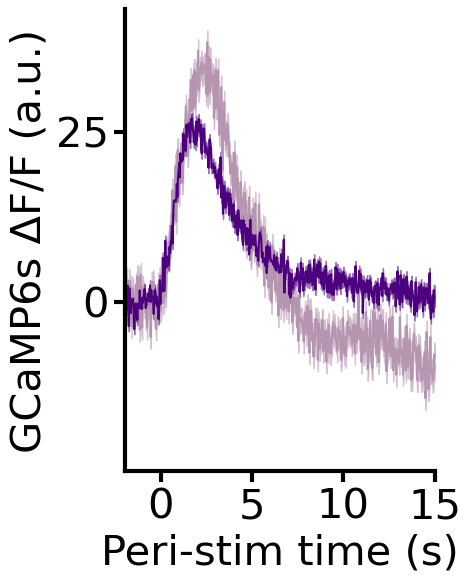

In [386]:
#Airpuff P11-13
WT = []
HET = []
KO = []
df['Whisker_response_trace_cropped'] = None
for age in range(7,11):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Vip'].iterrows():
        try:
            tmp = np.nanmean(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],1)

    
            if row['genotype'] == 'Control':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'SSRI':
                HET.append(tmp)#/tmp[:,1])

        except:
            pass
#try:
WT = np.vstack(WT)
HET = np.vstack(HET)
#KO = np.vstack(KO)
#except:
#    pass

WT = WT - np.nanmean(WT[:,0:60],1)[:,None]
HET = HET - np.nanmean(HET[:,0:60],1)[:,None]
#KO = KO - np.nanmean(KO[:,0:60],1)[:,None]

plt.figure(figsize=(4,6))
plt.plot(np.nanmean(WT,0),color=color4)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(WT,0)-np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),np.nanmean(WT,0)+np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),color=color4,alpha=0.5)
plt.plot(np.nanmean(HET,0),color=color5)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(HET,0)-np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),np.nanmean(HET,0)+np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),color=color5,alpha=0.5)
#plt.plot(np.nanmean(KO,0),color=color3)
#sem shade
#plt.fill_between(np.arange(660),np.nanmean(KO,0)-np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),np.nanmean(KO,0)+np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),color=color3,alpha=0.5)

# REMOVE TOP AND RIGHT SPINES
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(np.arange(60,661,150), np.arange(0,21,5),fontsize=30)
plt.yticks(fontsize=30)
#Set x and y labels
plt.xlabel('Peri-stim time (s)',fontsize=30)
plt.ylabel('GCaMP6s ΔF/F (a.u.)',fontsize=30)
#Make axis thicker
ax.spines['left'].set_linewidth(3.0)
ax.spines['bottom'].set_linewidth(3.0)
#make ticks longer and wider
ax.tick_params(width=3.0,length=8.0)
plt.xlim([0,510])




plt.savefig(Save_path + 'SSRI_Vip_th_SERT_Whisker_response_trace.svg',dpi=300,bbox_inches='tight', format='svg')


C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\582079546.py:10: RuntimeWarning: Mean of empty slice
  tmp = np.nanmean(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],1)


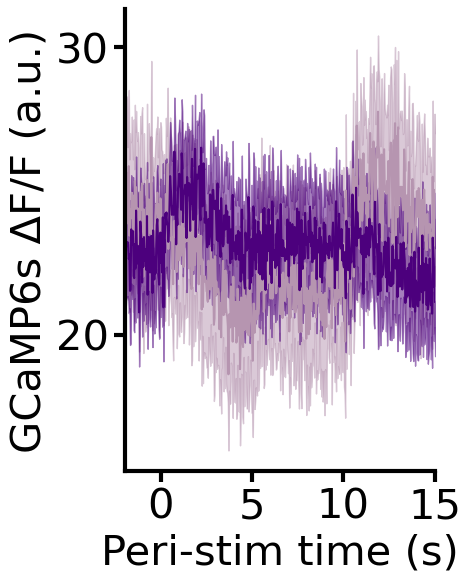

In [515]:
#Airpuff P11-13
WT = []
HET = []
KO = []
df['Whisker_response_trace_cropped'] = None
for age in range(11,20):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Vip'].iterrows():
        try:
            tmp = np.nanmean(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],1)

    
            if row['genotype'] == 'Control':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'SSRI':
                HET.append(tmp)#/tmp[:,1])

        except:
            pass
#try:
WT = np.vstack(WT)
HET = np.vstack(HET)
#KO = np.vstack(KO)
#except:
#    pass

WT = WT #- np.nanmean(WT[:,0:60],1)[:,None]
HET = HET #- np.nanmean(HET[:,0:60],1)[:,None]
#KO = KO - np.nanmean(KO[:,0:60],1)[:,None]

plt.figure(figsize=(4,6))
plt.plot(np.nanmean(WT,0),color=color4)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(WT,0)-np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),np.nanmean(WT,0)+np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),color=color4,alpha=0.5)
plt.plot(np.nanmean(HET,0),color=color5)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(HET,0)-np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),np.nanmean(HET,0)+np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),color=color5,alpha=0.5)
#plt.plot(np.nanmean(KO,0),color=color3)
#sem shade
#plt.fill_between(np.arange(660),np.nanmean(KO,0)-np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),np.nanmean(KO,0)+np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),color=color3,alpha=0.5)

# REMOVE TOP AND RIGHT SPINES
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(np.arange(60,661,150), np.arange(0,21,5),fontsize=30)
plt.yticks(fontsize=30)
#Set x and y labels
plt.xlabel('Peri-stim time (s)',fontsize=30)
plt.ylabel('GCaMP6s ΔF/F (a.u.)',fontsize=30)
#Make axis thicker
ax.spines['left'].set_linewidth(3.0)
ax.spines['bottom'].set_linewidth(3.0)
#make ticks longer and wider
ax.tick_params(width=3.0,length=8.0)
plt.xlim([0,510])




plt.savefig(Save_path + 'Non_normalized_SSRI_Vip_adult_SERT_Whisker_response_trace_2.svg',dpi=300,bbox_inches='tight', format='svg')


WT: 145
HET: 192
ShapiroResult(statistic=0.9453305006027222, pvalue=1.883076583908405e-05)
MannwhitneyuResult(statistic=19781.0, pvalue=3.638797260808317e-11)


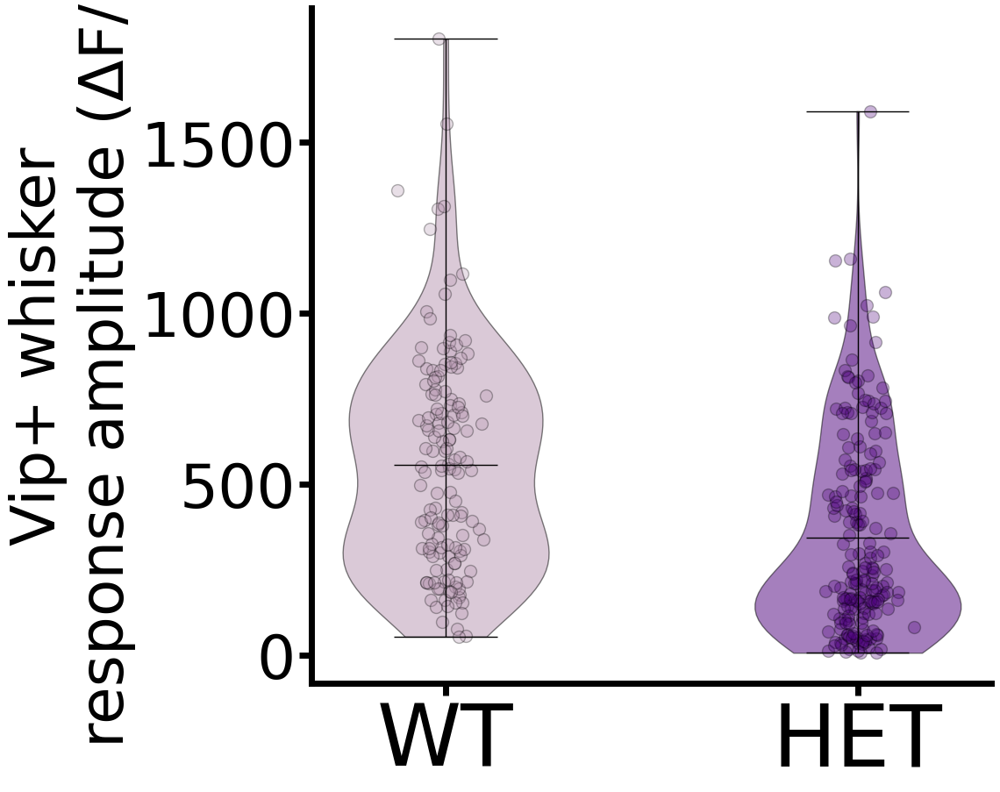

In [388]:
WT = []
HET = []
KO = []

for age in range(7,11):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Vip'].iterrows():
        try:
            tmp = np.nanmean(np.nanmax(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],2),1)
            
    
            if row['genotype'] == 'Control':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'SSRI':
                HET.append(tmp)#/tmp[:,1])
      

        except:
            pass
try:
    WT = (np.hstack(WT)).astype(float)
    HET = (np.hstack(HET)).astype(float)
    #KO = (np.hstack(KO)).astype(float)
except:
    pass



#Violin plot of WT,HET,KO
plt.figure(figsize=(10,10))
#Make 0 nans in WT,HET,KO
WT[WT==0] = np.nan
HET[HET==0] = np.nan
#KO[KO==0] = np.nan

violin = plt.violinplot([WT[~np.isnan(WT)]],positions=[1],showmeans=True,showextrema=True)
violin2 = plt.violinplot([HET[~np.isnan(HET)]],positions=[2],showmeans=True,showextrema=True)
#violin3 = plt.violinplot([KO[~np.isnan(KO)]],positions=[3],showmeans=True,showextrema=True)

#set all edges black
for partname in ('cbars','cmins','cmaxes','cmeans'):
    vp = violin[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin2[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)

#color violin plot faces
for pc in violin['bodies']:
    pc.set_facecolor(color4)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin2['bodies']:
    pc.set_facecolor(color5)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)


    
#scatter points on top
plt.scatter(np.ones(WT.shape[0])+np.random.normal(1,0.035,WT.shape[0])-1,WT,color=color4,edgecolors='black',s=100, alpha=0.3)
plt.scatter(np.ones(HET.shape[0])+np.random.normal(1,0.035,HET.shape[0]),HET,color=color5,edgecolors='black',s=100, alpha=0.3)
#plt.scatter(np.ones(KO.shape[0])+np.random.normal(1,0.035,KO.shape[0])+1,KO,color=color3,edgecolors='black',s=100, alpha=0.3)


#Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(fontsize=70)
plt.yticks(fontsize=50)
#Set x and y labels
plt.xticks([1,2],['WT','HET'])
plt.ylabel('Vip+ whisker\nresponse amplitude (ΔF/F)',fontsize=50)

#Make axis thicker
ax.spines['left'].set_linewidth(5)
ax.spines['bottom'].set_linewidth(5)
#make ticks longer and wider
ax.tick_params(width=5,length=10)

plt.savefig(Save_path + 'SSRI_Th_SERT_Vip_whisker_response_amplitude.svg',dpi=300,bbox_inches='tight', format='svg')

#Print lengths of each genotype
print('WT: ' + str(WT.shape[0]))
print('HET: ' + str(HET.shape[0]))
#print('KO: ' + str(KO.shape[0]))
#Shapiro test
print(stats.shapiro(WT[~np.isnan(WT)]))
#Krustal wallis
#mannwhitneyu
print(stats.mannwhitneyu(WT[~np.isnan(WT)],HET[~np.isnan(HET)]))
#print(stats.kruskal(WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)]))
#Tukey
#print(tukey.MultiComparison(np.hstack((WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)])),np.hstack((np.ones(WT[~np.isnan(WT)].shape[0]),np.ones(HET[~np.isnan(HET)].shape[0])+1,np.ones(KO[~np.isnan(KO)].shape[0])+2))).tukeyhsd().summary())




C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\1452312355.py:10: RuntimeWarning: Mean of empty slice
  tmp = np.nanmean(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],1)


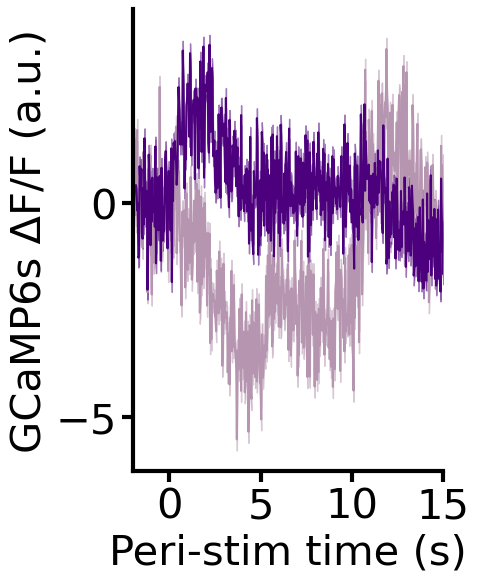

In [389]:
#Airpuff P11-13
WT = []
HET = []
KO = []
df['Whisker_response_trace_cropped'] = None
for age in range(11,20):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Vip'].iterrows():
        try:
            tmp = np.nanmean(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],1)

    
            if row['genotype'] == 'Control':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'SSRI':
                HET.append(tmp)#/tmp[:,1])

        except:
            pass
#try:
WT = np.vstack(WT)
HET = np.vstack(HET)
#KO = np.vstack(KO)
#except:
#    pass

WT = WT - np.nanmean(WT[:,0:60],1)[:,None]
HET = HET - np.nanmean(HET[:,0:60],1)[:,None]
#KO = KO - np.nanmean(KO[:,0:60],1)[:,None]

plt.figure(figsize=(4,6))
plt.plot(np.nanmean(WT,0),color=color4)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(WT,0)-np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),np.nanmean(WT,0)+np.nanstd(np.nanmean(WT,1),0)/np.sqrt(WT.shape[0]),color=color4,alpha=0.5)
plt.plot(np.nanmean(HET,0),color=color5)
#sem shade
plt.fill_between(np.arange(660),np.nanmean(HET,0)-np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),np.nanmean(HET,0)+np.nanstd(np.nanmean(HET,1),0)/np.sqrt(HET.shape[0]),color=color5,alpha=0.5)
#plt.plot(np.nanmean(KO,0),color=color3)
#sem shade
#plt.fill_between(np.arange(660),np.nanmean(KO,0)-np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),np.nanmean(KO,0)+np.nanstd(np.nanmean(KO,1),0)/np.sqrt(KO.shape[0]),color=color3,alpha=0.5)

# REMOVE TOP AND RIGHT SPINES
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(np.arange(60,661,150), np.arange(0,21,5),fontsize=30)
plt.yticks(fontsize=30)
#Set x and y labels
plt.xlabel('Peri-stim time (s)',fontsize=30)
plt.ylabel('GCaMP6s ΔF/F (a.u.)',fontsize=30)
#Make axis thicker
ax.spines['left'].set_linewidth(3.0)
ax.spines['bottom'].set_linewidth(3.0)
#make ticks longer and wider
ax.tick_params(width=3.0,length=8.0)
plt.xlim([0,510])




plt.savefig(Save_path + 'SSRI_Vip_adult_SERT_Whisker_response_trace.svg',dpi=300,bbox_inches='tight', format='svg')


C:\Users\gabrielos\AppData\Local\Temp\ipykernel_128032\2906085988.py:9: RuntimeWarning: Mean of empty slice
  tmp = np.nanmean(np.nanmax(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],2),1)


WT: 112
HET: 147
ShapiroResult(statistic=0.5322107076644897, pvalue=2.937958262097672e-17)
MannwhitneyuResult(statistic=6384.0, pvalue=0.001979502155506666)


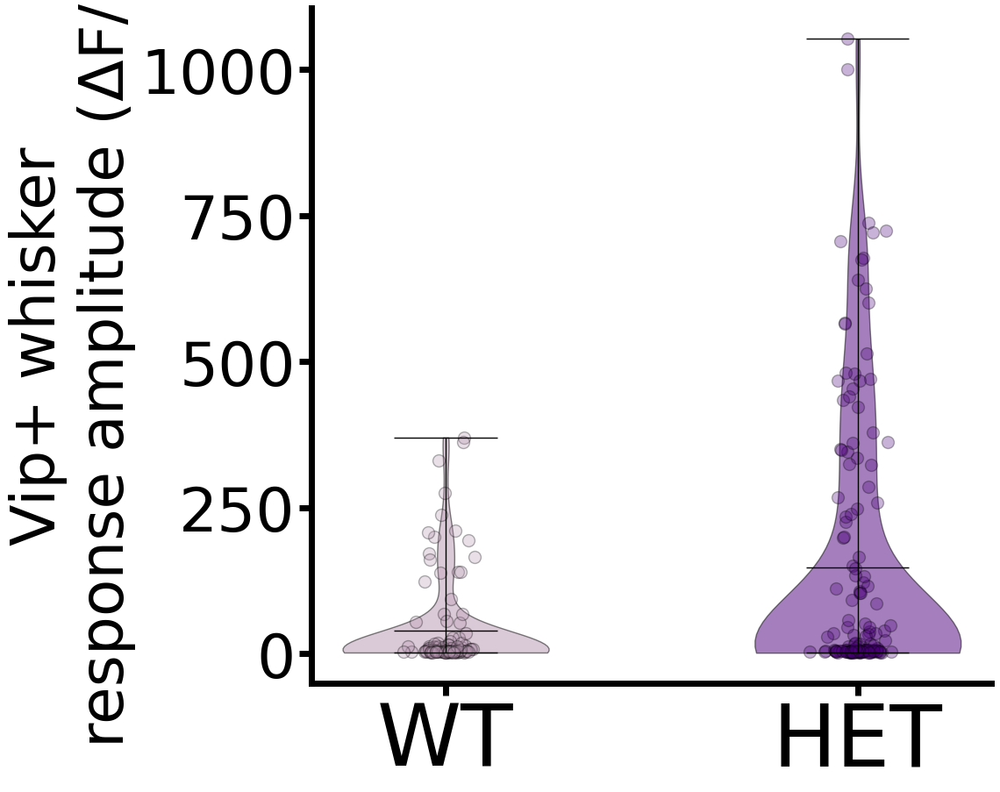

In [521]:
WT = []
HET = []
KO = []

for age in range(14,20):
    df_a = df[df['age']==age]
    for i,row in df_a[df_a['interneuron']=='Vip'].iterrows():
        try:
            tmp = np.nanmean(np.nanmax(row['Whisker_response_trace_interneurons_single']['interneurons'][:,:,:660],2),1)
            
    
            if row['genotype'] == 'Control':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'SSRI':
                HET.append(tmp)#/tmp[:,1])
      

        except:
            pass
try:
    WT = (np.hstack(WT)).astype(float)
    HET = (np.hstack(HET)).astype(float)
    #KO = (np.hstack(KO)).astype(float)
except:
    pass



#Violin plot of WT,HET,KO
plt.figure(figsize=(10,10))
#Make 0 nans in WT,HET,KO
WT[WT==0] = np.nan
HET[HET==0] = np.nan
#KO[KO==0] = np.nan

violin = plt.violinplot([WT[~np.isnan(WT)]],positions=[1],showmeans=True,showextrema=True)
violin2 = plt.violinplot([HET[~np.isnan(HET)]],positions=[2],showmeans=True,showextrema=True)
#violin3 = plt.violinplot([KO[~np.isnan(KO)]],positions=[3],showmeans=True,showextrema=True)

#set all edges black
for partname in ('cbars','cmins','cmaxes','cmeans'):
    vp = violin[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin2[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)

#color violin plot faces
for pc in violin['bodies']:
    pc.set_facecolor(color4)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin2['bodies']:
    pc.set_facecolor(color5)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)


    
#scatter points on top
plt.scatter(np.ones(WT.shape[0])+np.random.normal(1,0.035,WT.shape[0])-1,WT,color=color4,edgecolors='black',s=100, alpha=0.3)
plt.scatter(np.ones(HET.shape[0])+np.random.normal(1,0.035,HET.shape[0]),HET,color=color5,edgecolors='black',s=100, alpha=0.3)
#plt.scatter(np.ones(KO.shape[0])+np.random.normal(1,0.035,KO.shape[0])+1,KO,color=color3,edgecolors='black',s=100, alpha=0.3)


#Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(fontsize=70)
plt.yticks(fontsize=50)
#Set x and y labels
plt.xticks([1,2],['WT','HET'])
plt.ylabel('Vip+ whisker\nresponse amplitude (ΔF/F)',fontsize=50)

#Make axis thicker
ax.spines['left'].set_linewidth(5)
ax.spines['bottom'].set_linewidth(5)
#make ticks longer and wider
ax.tick_params(width=5,length=10)

plt.savefig(Save_path + 'SSRI_Aduklt_SERT_Vip_whisker_response_amplitude.svg',dpi=300,bbox_inches='tight', format='svg')

#Print lengths of each genotype
print('WT: ' + str(WT.shape[0]))
print('HET: ' + str(HET.shape[0]))
#print('KO: ' + str(KO.shape[0]))
#Shapiro test
print(stats.shapiro(WT[~np.isnan(WT)]))
#Krustal wallis
#mannwhitneyu
print(stats.mannwhitneyu(WT[~np.isnan(WT)],HET[~np.isnan(HET)]))
#print(stats.kruskal(WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)]))
#Tukey
#print(tukey.MultiComparison(np.hstack((WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)])),np.hstack((np.ones(WT[~np.isnan(WT)].shape[0]),np.ones(HET[~np.isnan(HET)].shape[0])+1,np.ones(KO[~np.isnan(KO)].shape[0])+2))).tukeyhsd().summary())




## Frequency

In [342]:
Path_df = '//qnap-amp001.dpag.ox.ac.uk/gsantero/Analysis/Data_frames/With_data/'
file_name = '2024_11_13_df_data'

#import 2023_03_18_df_cumsum as df_cumsum using pickle
with open(Path_df + file_name,'rb') as handle:
    df = pickle.load(handle)



df['interneuron'] = df['interneuron'].replace('NKx2.1','Nkx2.1')
df['genotype'] = df['genotype'].replace('KO ','KO')
df['genotype'] = df['genotype'].replace('HET ','HET')
df['genotype'] = df['genotype'].replace('WT ','WT')
df['genotype'] = df['genotype'].replace('WT?','WT')

#extract_to_separate_coloumn number of neurons to separate coloumn
df = PdA.extract_to_separate_coloumn(df,'Number_of_neurons',0,'Neurons')
#df = PdA.extract_to_separate_coloumn(df, 'Whisker_responses',-3,'Proportion_resp')
#for n in range(0,10):
  #  df = PdA.extract_to_separate_coloumn(df, 'Whisker_responses',n,'Resp' + str((n+1)*10) + '%')
#for n in range(0,10):
 #   df = PdA.extract_to_separate_coloumn(df, 'Airpuff_responses',n,'AResp' + str((n+1)*10) + '%')
#df = PdA.extract_to_separate_coloumn(df, 'Whisker_responses',-3,'Whisker_responsive')
#df = PdA.extract_to_separate_coloumn(df, 'Airpuff_responses',-3,'Airpuff_responsive')
#df = PdA.extract_to_separate_coloumn(df,'Correlations',0,'Mean_correlation')
#df = PdA.extract_to_separate_coloumn(df,'Correlations',1,'Positive_correlation')
#df = PdA.extract_to_separate_coloumn(df,'Correlations',2,'Negative_correlation')

#Remove rows with less than 500 neuorns and print how many where removed
print('Number of rows removed: ' + str(len(df[df['Neurons'] < 500])))
df = df[df['Neurons'] >= 500]

#remove runt 351 (died at P10 very underweighted)
df = df[df['animal'] != 'GOS351']
df.head(n=10)

#remove GOS464 ONWARDS (WT dams)
df = df[df['animal'] != 'GOS466']
df = df[df['animal'] != 'GOS470']
df = df[df['animal'] != 'GOS471']

#Remove 268 to 284 (microscope artefact)
#for stringo in ['GOS268','GOS269','GOS270','GOS271','GOS272','GOS273','GOS274','GOS275','GOS276','GOS277','GOS278','GOS279','GOS280','GOS281','GOS282','GOS283','GOS284']:
 #   df = df[df['animal'] != stringo]

Number of rows removed: 54


In [343]:
df2 = df.copy()

WT: 114
HET: 354
KO: 204
ShapiroResult(statistic=0.8777843117713928, pvalue=4.342971848814159e-08)
KruskalResult(statistic=164.61640012970403, pvalue=1.7947455965130115e-36)
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj lower  upper  reject
-------------------------------------------------
   1.0    2.0   0.3402   0.0 0.2574  0.423   True
   1.0    3.0   0.5415   0.0 0.4494 0.6335   True
   2.0    3.0   0.2013   0.0 0.1306  0.272   True
-------------------------------------------------


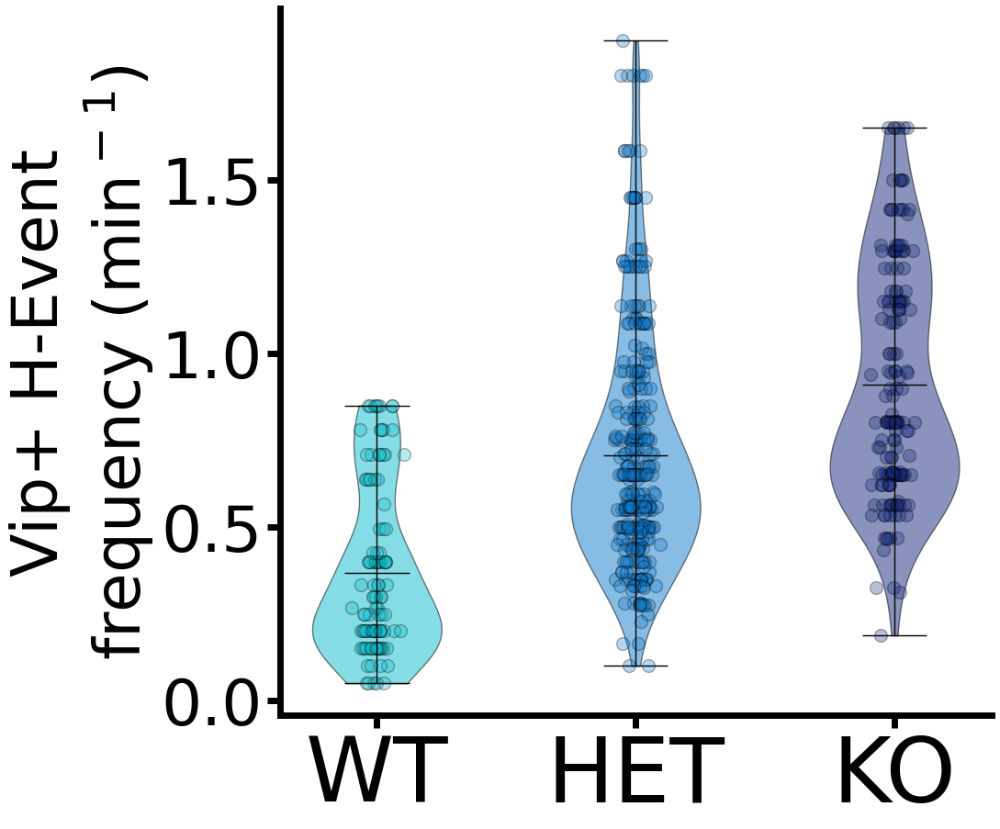

In [372]:
WT = []
HET = []
KO = []

for age in range(7,11):
    df_a = df2[df2['age']==age]
    
    for i,row in df_a[df_a['interneuron']=='Vip'].iterrows():
        try:
            #find df the same row
            total = df.loc[i]['H_events']
            tmp = (row['Interneurons_H_freq'])*total
            
            
    
            if row['genotype'] == 'WT':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'HET':
                HET.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'KO':
                KO.append(tmp)#/tmp[:,1])

        except:
            pass
try:
    WT = (np.hstack(WT)).astype(float)
    HET = (np.hstack(HET)).astype(float)
    KO = (np.hstack(KO)).astype(float)
except:
    pass



#Violin plot of WT,HET,KO
plt.figure(figsize=(10,10))
#Make 0 nans in WT,HET,KO
WT[WT==0] = np.nan
HET[HET==0] = np.nan
KO[KO==0] = np.nan

violin = plt.violinplot([WT[~np.isnan(WT)]],positions=[1],showmeans=True,showextrema=True)
violin2 = plt.violinplot([HET[~np.isnan(HET)]],positions=[2],showmeans=True,showextrema=True)
violin3 = plt.violinplot([KO[~np.isnan(KO)]],positions=[3],showmeans=True,showextrema=True)

#set all edges black
for partname in ('cbars','cmins','cmaxes','cmeans'):
    vp = violin[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin2[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin3[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
#color violin plot faces
for pc in violin['bodies']:
    pc.set_facecolor(color1)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin2['bodies']:
    pc.set_facecolor(color2)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin3['bodies']:
    pc.set_facecolor(color3)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)

    
#scatter points on top
plt.scatter(np.ones(WT.shape[0])+np.random.normal(1,0.035,WT.shape[0])-1,WT,color=color1,edgecolors='black',s=100, alpha=0.3)
plt.scatter(np.ones(HET.shape[0])+np.random.normal(1,0.035,HET.shape[0]),HET,color=color2,edgecolors='black',s=100, alpha=0.3)
plt.scatter(np.ones(KO.shape[0])+np.random.normal(1,0.035,KO.shape[0])+1,KO,color=color3,edgecolors='black',s=100, alpha=0.3)


#Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(fontsize=70)
plt.yticks(fontsize=50)
#Set x and y labels
plt.xticks([1,2,3],['WT','HET','KO'])
plt.ylabel('Vip+ H-Event\nfrequency (min$^-$$^1$)',fontsize=50)

#Make axis thicker
ax.spines['left'].set_linewidth(5)
ax.spines['bottom'].set_linewidth(5)
#make ticks longer and wider
ax.tick_params(width=5,length=10)

plt.savefig(Save_path + 'KO_VIP_H_event_frequency.svg',dpi=300,bbox_inches='tight', format='svg')

#Print lengths of each genotype
print('WT: ' + str(WT.shape[0]))
print('HET: ' + str(HET.shape[0]))
print('KO: ' + str(KO.shape[0]))
#Shapiro test
print(stats.shapiro(WT[~np.isnan(WT)]))
#Krustal wallis
print(stats.kruskal(WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)]))
#Tukey
print(tukey.MultiComparison(np.hstack((WT[~np.isnan(WT)],HET[~np.isnan(HET)],KO[~np.isnan(KO)])),np.hstack((np.ones(WT[~np.isnan(WT)].shape[0]),np.ones(HET[~np.isnan(HET)].shape[0])+1,np.ones(KO[~np.isnan(KO)].shape[0])+2))).tukeyhsd().summary())




WT: 262
HET: 286
ShapiroResult(statistic=0.9610015749931335, pvalue=4.698673365055583e-06)
MannwhitneyuResult(statistic=23516.0, pvalue=0.01909466306630532)


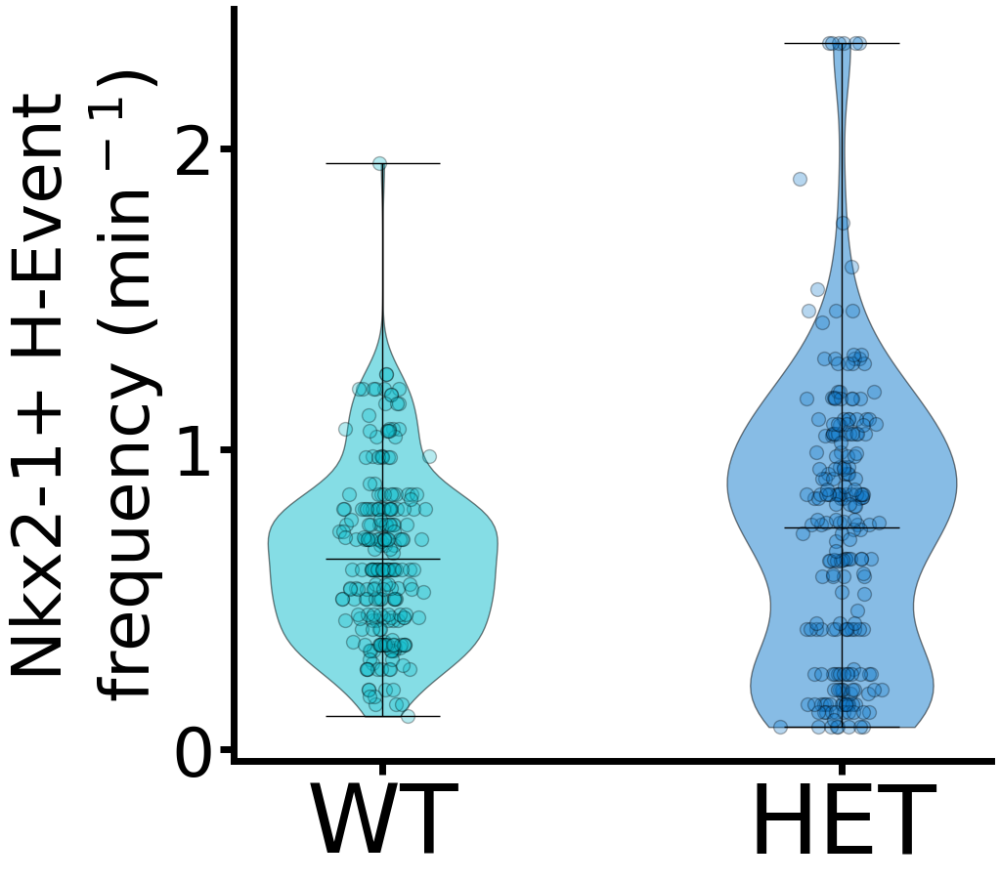

In [371]:
WT = []
HET = []
KO = []

for age in range(7,11):
    df_a = df2[df2['age']==age]
    
    for i,row in df_a[df_a['interneuron']=='Nkx2.1'].iterrows():
        try:
            #find df the same row
            total = df.loc[i]['H_events']
            tmp = (row['Interneurons_H_freq'])*total
            
            
    
            if row['genotype'] == 'WT':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'HET':
                HET.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'KO':
                KO.append(tmp)#/tmp[:,1])

        except:
            pass
try:
    WT = (np.hstack(WT)).astype(float)
    HET = (np.hstack(HET)).astype(float)
    KO = (np.hstack(KO)).astype(float)
except:
    pass



#Violin plot of WT,HET,KO
plt.figure(figsize=(10,10))
#Make 0 nans in WT,HET,KO
WT[WT==0] = np.nan
HET[HET==0] = np.nan
#KO[KO==0] = np.nan

violin = plt.violinplot([WT[~np.isnan(WT)]],positions=[1],showmeans=True,showextrema=True)
violin2 = plt.violinplot([HET[~np.isnan(HET)]],positions=[2],showmeans=True,showextrema=True)
#violin3 = plt.violinplot([KO[~np.isnan(KO)]],positions=[3],showmeans=True,showextrema=True)

#set all edges black
for partname in ('cbars','cmins','cmaxes','cmeans'):
    vp = violin[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin2[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin3[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
#color violin plot faces
for pc in violin['bodies']:
    pc.set_facecolor(color1)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin2['bodies']:
    pc.set_facecolor(color2)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin3['bodies']:
    pc.set_facecolor(color3)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)

    
#scatter points on top
plt.scatter(np.ones(WT.shape[0])+np.random.normal(1,0.035,WT.shape[0])-1,WT,color=color1,edgecolors='black',s=100, alpha=0.3)
plt.scatter(np.ones(HET.shape[0])+np.random.normal(1,0.035,HET.shape[0]),HET,color=color2,edgecolors='black',s=100, alpha=0.3)
#plt.scatter(np.ones(KO.shape[0])+np.random.normal(1,0.035,KO.shape[0])+1,KO,color=color3,edgecolors='black',s=100, alpha=0.3)


#Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(fontsize=70)
plt.yticks(fontsize=50)
#Set x and y labels
plt.xticks([1,2],['WT','HET'])
plt.ylabel('Nkx2-1+ H-Event\nfrequency (min$^-$$^1$)',fontsize=50)

#Make axis thicker
ax.spines['left'].set_linewidth(5)
ax.spines['bottom'].set_linewidth(5)
#make ticks longer and wider
ax.tick_params(width=5,length=10)

plt.savefig(Save_path + 'KO_Nkx2-1_H_event_frequency.svg',dpi=300,bbox_inches='tight', format='svg')

#Print lengths of each genotype
print('WT: ' + str(WT.shape[0]))
print('HET: ' + str(HET.shape[0]))

#Shapiro test
print(stats.shapiro(WT[~np.isnan(WT)]))
#Krustal wallis
print(stats.mannwhitneyu(WT[~np.isnan(WT)],HET[~np.isnan(HET)]))



### SSRI

WT: 193
HET: 214
ShapiroResult(statistic=0.9612860679626465, pvalue=4.185147554380819e-05)
MannwhitneyuResult(statistic=11317.0, pvalue=0.00023166503600177246)


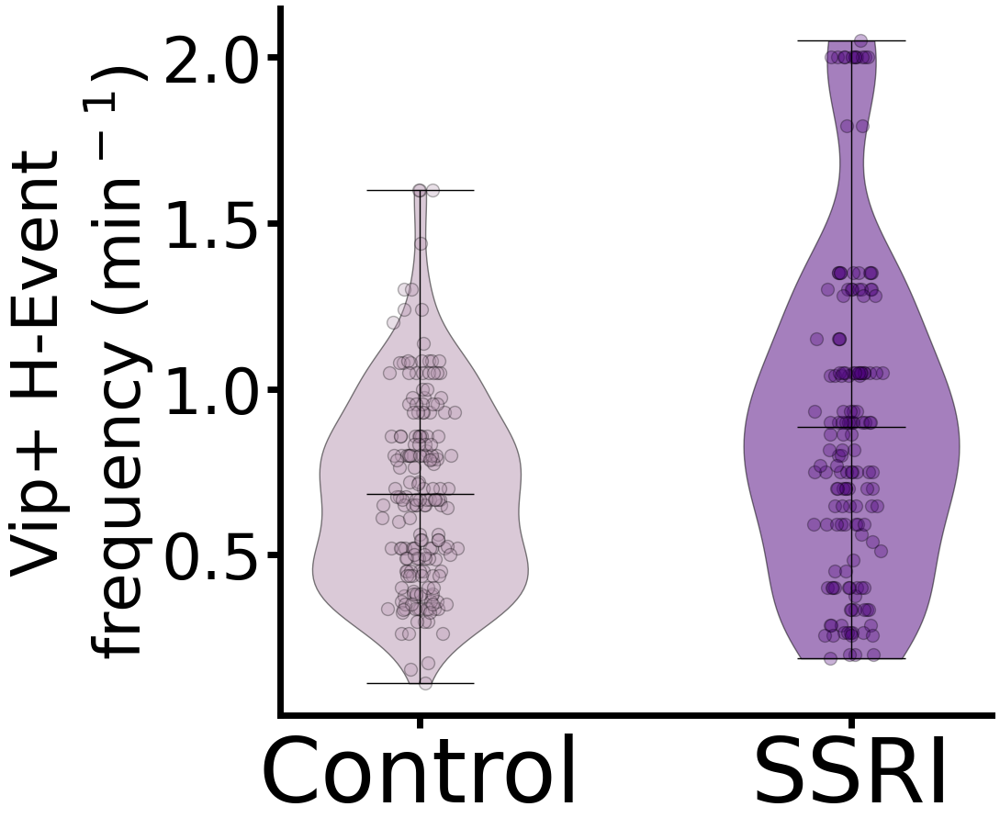

In [370]:
WT = []
HET = []
KO = []

for age in range(7,11):
    df_a = df2[df2['age']==age]
    
    for i,row in df_a[df_a['interneuron']=='Vip'].iterrows():
        try:
            #find df the same row
            total = df.loc[i]['H_events']
            tmp = (row['Interneurons_H_freq'])*total
            
            
    
            if row['genotype'] == 'Control':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'SSRI':
                HET.append(tmp)#/tmp[:,1])


        except:
            pass
try:
    WT = (np.hstack(WT)).astype(float)
    HET = (np.hstack(HET)).astype(float)

except:
    pass



#Violin plot of WT,HET,KO
plt.figure(figsize=(10,10))
#Make 0 nans in WT,HET,KO
WT[WT==0] = np.nan
HET[HET==0] = np.nan


violin = plt.violinplot([WT[~np.isnan(WT)]],positions=[1],showmeans=True,showextrema=True)
violin2 = plt.violinplot([HET[~np.isnan(HET)]],positions=[2],showmeans=True,showextrema=True)


#set all edges black
for partname in ('cbars','cmins','cmaxes','cmeans'):
    vp = violin[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin2[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)

#color violin plot faces
for pc in violin['bodies']:
    pc.set_facecolor(color4)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin2['bodies']:
    pc.set_facecolor(color5)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)


    
#scatter points on top
plt.scatter(np.ones(WT.shape[0])+np.random.normal(1,0.035,WT.shape[0])-1,WT,color=color4,edgecolors='black',s=100, alpha=0.3)
plt.scatter(np.ones(HET.shape[0])+np.random.normal(1,0.035,HET.shape[0]),HET,color=color5,edgecolors='black',s=100, alpha=0.3)


#Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(fontsize=70)
plt.yticks(fontsize=50)
#Set x and y labels
plt.xticks([1,2],['Control','SSRI'])
plt.ylabel('Vip+ H-Event\nfrequency (min$^-$$^1$)',fontsize=50)

#Make axis thicker
ax.spines['left'].set_linewidth(5)
ax.spines['bottom'].set_linewidth(5)
#make ticks longer and wider
ax.tick_params(width=5,length=10)

plt.savefig(Save_path + 'VIP_H_event_frequency.svg',dpi=300,bbox_inches='tight', format='svg')

#Print lengths of each genotype
print('WT: ' + str(WT.shape[0]))
print('HET: ' + str(HET.shape[0]))

#Shapiro test
print(stats.shapiro(WT[~np.isnan(WT)]))
#Krustal wallis
print(stats.mannwhitneyu(WT[~np.isnan(WT)],HET[~np.isnan(HET)]))




WT: 274
HET: 212
ShapiroResult(statistic=0.9433817863464355, pvalue=4.098706440913702e-08)
MannwhitneyuResult(statistic=21978.0, pvalue=0.005618882459765934)


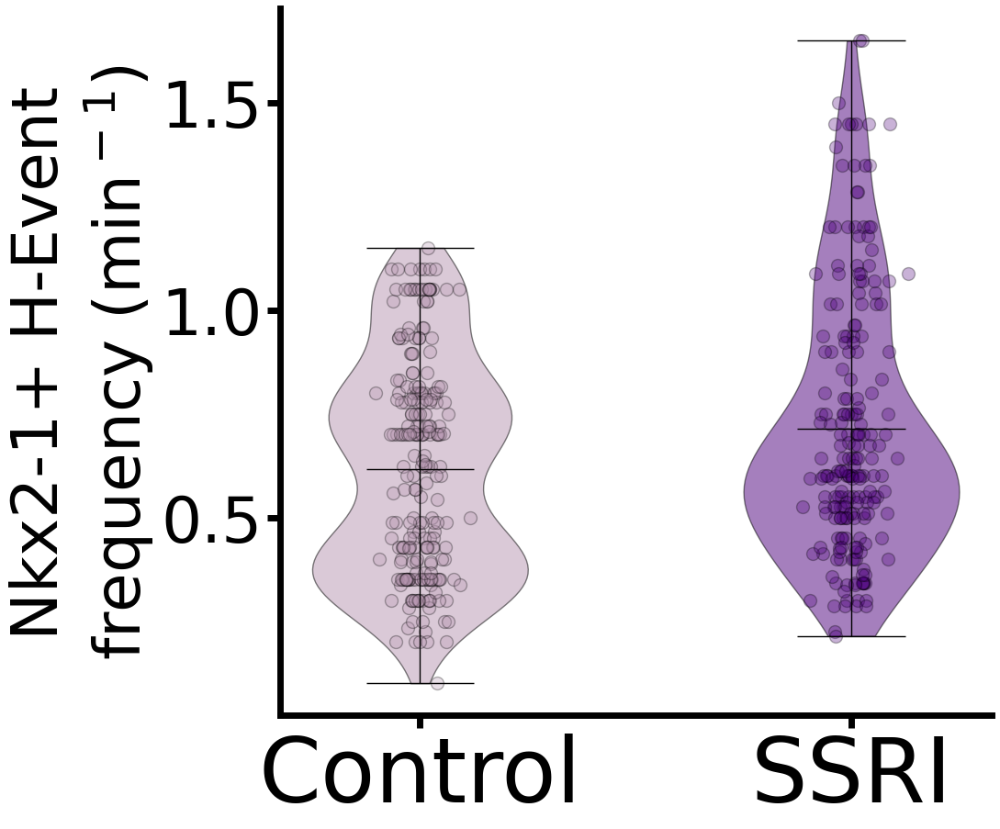

In [369]:
WT = []
HET = []
KO = []

for age in range(7,11):
    df_a = df2[df2['age']==age]
    
    for i,row in df_a[df_a['interneuron']=='Nkx2.1'].iterrows():
        try:
            #find df the same row
            total = df.loc[i]['H_events']
            tmp = (row['Interneurons_H_freq'])*total
            
            
    
            if row['genotype'] == 'Control':
                WT.append(tmp)#/tmp[:,1])
            if row['genotype'] == 'SSRI':
                HET.append(tmp)#/tmp[:,1])


        except:
            pass
try:
    WT = (np.hstack(WT)).astype(float)
    HET = (np.hstack(HET)).astype(float)

except:
    pass



#Violin plot of WT,HET,KO
plt.figure(figsize=(10,10))
#Make 0 nans in WT,HET,KO
WT[WT==0] = np.nan
HET[HET==0] = np.nan


violin = plt.violinplot([WT[~np.isnan(WT)]],positions=[1],showmeans=True,showextrema=True)
violin2 = plt.violinplot([HET[~np.isnan(HET)]],positions=[2],showmeans=True,showextrema=True)


#set all edges black
for partname in ('cbars','cmins','cmaxes','cmeans'):
    vp = violin[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)
    vp = violin2[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1)

#color violin plot faces
for pc in violin['bodies']:
    pc.set_facecolor(color4)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
for pc in violin2['bodies']:
    pc.set_facecolor(color5)
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)


    
#scatter points on top
plt.scatter(np.ones(WT.shape[0])+np.random.normal(1,0.035,WT.shape[0])-1,WT,color=color4,edgecolors='black',s=100, alpha=0.3)
plt.scatter(np.ones(HET.shape[0])+np.random.normal(1,0.035,HET.shape[0]),HET,color=color5,edgecolors='black',s=100, alpha=0.3)


#Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#Set x and y ticks size
plt.xticks(fontsize=70)
plt.yticks(fontsize=50)
#Set x and y labels
plt.xticks([1,2],['Control','SSRI'])
plt.ylabel('Nkx2-1+ H-Event\nfrequency (min$^-$$^1$)',fontsize=50)

#Make axis thicker
ax.spines['left'].set_linewidth(5)
ax.spines['bottom'].set_linewidth(5)
#make ticks longer and wider
ax.tick_params(width=5,length=10)

plt.savefig(Save_path + 'Nkx2.1_H_event_frequency.svg',dpi=300,bbox_inches='tight', format='svg')

#Print lengths of each genotype
print('WT: ' + str(WT.shape[0]))
print('HET: ' + str(HET.shape[0]))

#Shapiro test
print(stats.shapiro(WT[~np.isnan(WT)]))
#Krustal wallis
print(stats.mannwhitneyu(WT[~np.isnan(WT)],HET[~np.isnan(HET)]))


